### Temperature and Signal Analysis Argonne 12/01/2022

In [1]:
%matplotlib widget

In [2]:
import sys
import os
import time
import math as math
from datetime import datetime
import numpy as np
import astropy as ast
from astropy.io import fits
import astropy.io.fits as pyfits
from astropy.table import Table, hstack, vstack, Column
from astropy.stats import sigma_clipped_stats
from astropy.coordinates import Angle
from astropy.time import Time
from photutils.aperture import EllipticalAnnulus, aperture_photometry
import matplotlib
import matplotlib.pyplot as plt
import scipy as sp
import scipy.integrate
import scipy.constants
import scipy.special
from scipy import integrate
from scipy.optimize import curve_fit
import scipy.interpolate
from scipy.interpolate import CubicSpline
import glob2
import shutil
from tqdm.notebook import tqdm as tqdm

pi = sp.constants.pi
k= sp.constants.k
q_e = sp.constants.e

DimY = 1096
DimX = 1936

In [3]:
def MakeFileNamesList(datadirectory,filepattern):
    FileNamesList = glob2.glob(datadirectory + filepattern)
    
    return FileNamesList

def MakeImagesList(FileNamesList,IndexOfFitsImage):
    
    ImagesList = []
    
    for file in FileNamesList:
        
        #File = directory + file
        
        h = pyfits.open(file)
        img_data = h[IndexOfFitsImage].data
        header = h[IndexOfFitsImage].header
        '''
        exposure = header['EXPOSURE']
        gain = header['GAIN']
        DateAndTime = header['DATETIME']
        CamID = header['CAM_ID']
        CamFreeName = header['CAMFREE']
        '''
        image_and_metadata = [0,0,0,0,0,0]
        
        image_and_metadata[0] = img_data
        image_and_metadata[1] = header['EXPOSURE']
        image_and_metadata[2] = header['GAIN']
        image_and_metadata[3] = header['DATE']
        image_and_metadata[4] = header['TEMP']
        image_and_metadata[5] = file #Added Special Here the string of the corresponding file name
        #image_and_metadata[4] = header['CAM_ID']
        #image_and_metadata[5] = header['CAMFREE']
        
        ImagesList.append(image_and_metadata)
        
    return ImagesList

In [4]:
def GetTimeAndTemp(ImagesList):
    Times = []
    Temps = []

    for i in range(len(ImagesList)):
        image_and_metadata = ImagesList[i]
        Times.append(image_and_metadata[3])
        Temps.append(image_and_metadata[4])

    Times = Time(Times, format='isot', scale='utc')
    Times = Times.jd
    Times = np.array(Times)
    Temps = np.array(Temps)
    
    return Times, Temps


def GetTimeTempAndSignal(ImagesList):
    Times = []
    Temps = []
    Signals = [] #Signals is the sum not dark subtracted, and with hot pixels signal (for the moment)

    for i in range(len(ImagesList)):
        image_and_metadata = ImagesList[i]
        Times.append(image_and_metadata[3])
        Temps.append(image_and_metadata[4])
        Signals.append(np.sum(image_and_metadata[0]))

    Times = Time(Times, format='isot', scale='utc')
    Times = Times.jd
    Times = np.array(Times)
    Temps = np.array(Temps)
    Signals = np.array(Signals)
    
    return Times, Temps, Signals

def GetTimeTempSignalAndFile(ImagesList):
    Times = []
    Temps = []
    Signals = [] #Signals is the sum not dark subtracted, and with hot pixels signal (for the moment)
    FileNames = []

    for i in range(len(ImagesList)):
        image_and_metadata = ImagesList[i]
        Times.append(image_and_metadata[3])
        Temps.append(image_and_metadata[4])
        Signals.append(np.sum(image_and_metadata[0]))
        FileNames.append(image_and_metadata[5])

    Times = Time(Times, format='isot', scale='utc')
    Times = Times.jd
    Times = np.array(Times)
    Temps = np.array(Temps)
    Signals = np.array(Signals)
    FileNames = np.array(FileNames)
    
    return Times, Temps, Signals, FileNames


In [5]:
def GetElapsedTimeArray(TimesArray):
    ElapsedTimes = TimesArray - np.amin(TimesArray)
    ElapsedTimes = ElapsedTimes*86400 #now in seconds
    return ElapsedTimes

def GetTimeFromElapsedTime(ElapsedTime,TimesArray):
    ElapsedTimeDays =  ElapsedTime/86400
    Time = ElapsedTimeDays + np.amin(TimesArray)
    return Time #Julian Date

In [6]:
#Which files correspond to the observations after an elapsed time point?

def ListFilesAfterElapsedTime(ElapsedTime,TimesArray,FilesArray):
    
    Time = GetTimeFromElapsedTime(ElapsedTime,TimesArray)
    
    FilesList = []
    
    for i in range(np.size(TimesArray)):
        if TimesArray[i] >= Time:
            FilesList.append(FilesArray[i])
    
    return FilesList

def ListFilesBetweenElapsedTime(ElapsedTime1,ElapsedTime2,TimesArray,FilesArray):
    
    Time1 = GetTimeFromElapsedTime(ElapsedTime1,TimesArray)
    Time2 = GetTimeFromElapsedTime(ElapsedTime2,TimesArray)
    
    FilesList = []
    
    for i in range(np.size(TimesArray)):
        if TimesArray[i] >= Time1 and TimesArray[i] <= Time2:
            FilesList.append(FilesArray[i])
    
    return FilesList

In [14]:
def PrintDataSetInfo(DataSetName,ImagesList):
    
    Times, Temps, Signals, Files = GetTimeTempSignalAndFile(ImagesList)

    #Converting TimesArray back from Julian Date:
    TimesJD = Time(Times, format='jd')
    TimesFits = TimesJD.fits
    MaxTimeIndex = np.argmax(Times)
    #print(TimesFits)
    #print(TimesFits[0])
    #print(TimesFits[MaxTimeIndex])

    #Getting the Elapsed Time of Data Set in minutes and seconds for printing
    TimeElapsed = (TimesJD[MaxTimeIndex] - TimesJD[0])*1440 #in minutes
    TimeElapsed = TimeElapsed.to_value("jd")
    MinutesElapsed = math.floor(TimeElapsed)
    SecondsElapsed = (TimeElapsed - MinutesElapsed)*60
    SecondsElapsed = round(SecondsElapsed,2)

    #Getting the Mean Exposure Time of the Images in the Data Set
    ExposureTimes = []
    for i in range(len(ImagesList)):
            image_and_metadata = ImagesList[i]
            ExposureTimes.append(image_and_metadata[1])

    ExposureTimes = np.array(ExposureTimes)
    MeanExposureTime = np.mean(ExposureTimes)
    StdExposureTime = np.std(ExposureTimes)
    ExposureTime = round(MeanExposureTime,3)

    #Getting the Number of Frames in Data Set
    NumFrames = len(ImagesList)

    #Getting the max min median mean and std Sensor Temperatures
    MinTemp = np.amin(Temps)
    MaxTemp = np.amax(Temps)
    MedianTemp = np.median(Temps)
    MeanTemp = np.mean(Temps)
    StdTemp = np.std(Temps)
    MinTemp = round(MinTemp,2)
    MaxTemp = round(MaxTemp,2)
    MedianTemp = round(MedianTemp,2)
    MeanTemp = round(MeanTemp,2)
    StdTemp = round(StdTemp,2)


    print("")
    print("Data Set: "+DataSetName)
    print("Time Start: " + TimesFits[0] + " (UTC)")
    print("Time Stop: " + TimesFits[MaxTimeIndex]+ " (UTC)")
    print("Elapsed Time: " + str(MinutesElapsed) + " min "+ str(SecondsElapsed) + " sec")
    print("Exposure Time: " + str(ExposureTime) + " ms")
    print("Number of Frames: " + str(NumFrames))
    print("Min Sensor Temperature: " + str(MinTemp))
    print("Max Sensor Temperature: " + str(MaxTemp))
    print("Median Sensor Temperature: " + str(MedianTemp))
    print("Mean Sensor Temperature: " + str(MeanTemp))
    print("Standard Deviation of Sensor Temperature: " + str(StdTemp))

In [7]:
#load in Centered Closed Shutter Darks (x0 y0 turns)
#datadirectoryOpen = 'Image_Folders\OpenShutterDataFrames_Step19/'
datadirectoryOpen = 'Image_Folders\ClosedShutterDarks_Step18/'
filepatternOpen = '*.FTS'
ImageFileNameListCCSD = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesListCCSD = MakeImagesList(ImageFileNameListCCSD,1)

In [9]:
#Making Time and Date Arrays for Centered Closed Shutter Darks (x0 y0 turns)
ImagesList = ImagesListCCSD
TimesCCSD, TempsCCSD, SignalsCCSD, FilesCCSD = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = TimesCCSD.argsort()
TimesCCSD = TimesCCSD[idx]
TempsCCSD = TempsCCSD[idx]
SignalsCCSD = SignalsCCSD[idx]
FilesCCSD = FilesCCSD[idx]

#ElapsedTimesCCSD = TimesCCSD - np.amin(TimesCCSD)
#ElapsedTimesCCSD = ElapsedTimesCCSD*86400 #now in seconds

ElapsedTimesCCSD = GetElapsedTimeArray(TimesCCSD)

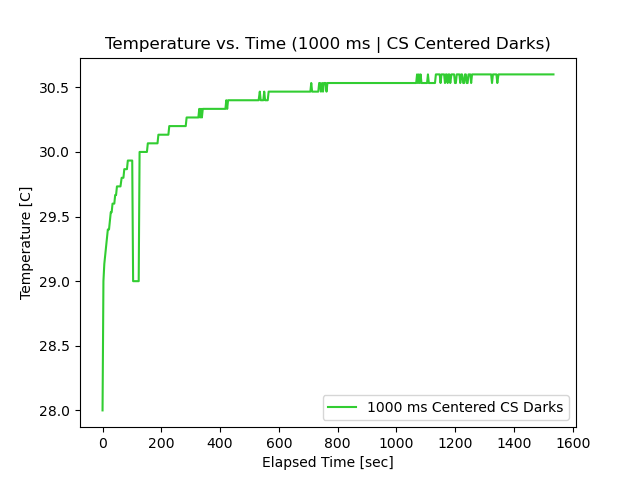

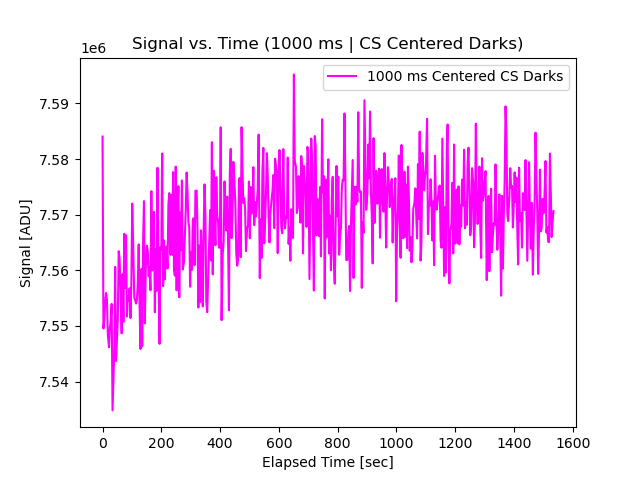

In [10]:
plt.figure('T v T 1000 ms Centered Closed Shutter Darks')
plt.clf()
plt.plot(ElapsedTimesCCSD,TempsCCSD, color = 'limegreen', label = '1000 ms Centered CS Darks')
#plt.scatter(ElapsedTimesOS_Set_5_sec,TempsOS_Set5, color = 'limegreen', label = '300 ms Open Shutter Dark Set 5')
plt.title('Temperature vs. Time (1000 ms | CS Centered Darks)')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms Centered Closed Shutter Darks')
plt.clf()
plt.plot(ElapsedTimesCCSD,SignalsCCSD, color = 'magenta', label = '1000 ms Centered CS Darks')
#plt.scatter(ElapsedTimesOS_Set_5_sec,TempsOS_Set5, color = 'limegreen', label = '300 ms Open Shutter Dark Set 5')
plt.title('Signal vs. Time (1000 ms | CS Centered Darks)')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [11]:
#I have decided that Steady State occurs after an elapsed time of 780 seconds

#Making a list of files captured after an elapsed time of 780 seconds.
SteadyStateImageFileNameListCCSD = ListFilesAfterElapsedTime(780,TimesCCSD,FilesCCSD)

#Moving these files to a new folder
destination = 'SteadyStateDataSets\X0_Y0\CS_Darks/'

for source in SteadyStateImageFileNameListCCSD:
    shutil.copy(source,destination)

In [12]:
#Loading in the new Steady State files
datadirectoryOpen = 'SteadyStateDataSets\X0_Y0\CS_Darks/'
filepatternOpen = '*.FTS'
ImageFileNameListX0_Y0_ssDarks = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesListX0_Y0_ssDarks = MakeImagesList(ImageFileNameListX0_Y0_ssDarks,1)

In [13]:
#Making Time and Date Arrays for X0_Y0 Steady State Closed Shutter Darks 
ImagesList = ImagesListX0_Y0_ssDarks
TimesX0_Y0_ssDarks, TempsX0_Y0_ssDarks, SignalsX0_Y0_ssDarks, FilesX0_Y0_ssDarks = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = TimesX0_Y0_ssDarks.argsort()
TimesX0_Y0_ssDarks = TimesX0_Y0_ssDarks[idx]
TempsX0_Y0_ssDarks = TempsX0_Y0_ssDarks[idx]
SignalsX0_Y0_ssDarks = SignalsX0_Y0_ssDarks[idx]
FilesX0_Y0_ssDarks = FilesX0_Y0_ssDarks[idx]

ElapsedTimeX0_Y0_ssDarks = GetElapsedTimeArray(TimesX0_Y0_ssDarks)

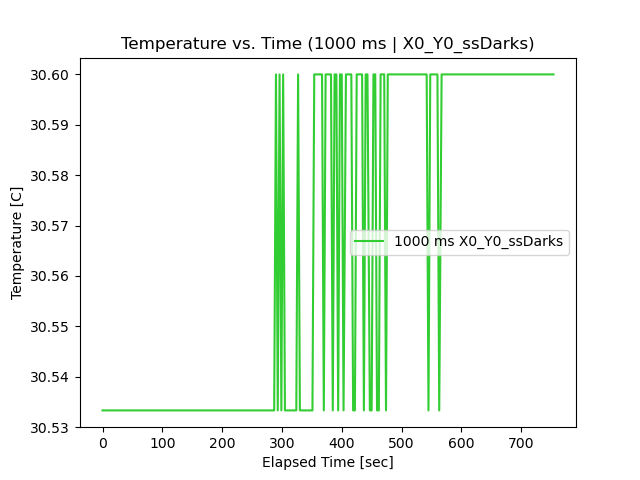

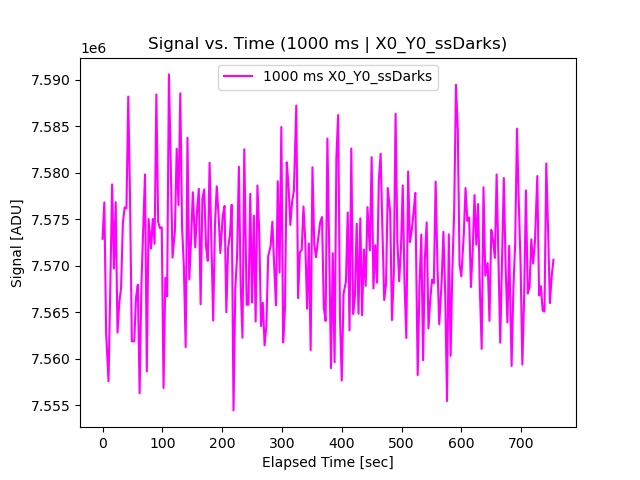

In [14]:
plt.figure('T v T 1000 ms X0_Y0_ssDarks')
plt.clf()
plt.plot(ElapsedTimeX0_Y0_ssDarks,TempsX0_Y0_ssDarks, color = 'limegreen', label = '1000 ms X0_Y0_ssDarks')
plt.title('Temperature vs. Time (1000 ms | X0_Y0_ssDarks)')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms X0_Y0_ssDarks')
plt.clf()
plt.plot(ElapsedTimeX0_Y0_ssDarks,SignalsX0_Y0_ssDarks, color = 'magenta', label = '1000 ms X0_Y0_ssDarks')
plt.title('Signal vs. Time (1000 ms | X0_Y0_ssDarks)')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [66]:
#Getting printing information about the steady state data set for printing and attaching.
DataSetName = "(0,0) Steady State Closed Shutter Dark Frames"
ImagesList = ImagesListX0_Y0_ssDarks

PrintDataSetInfo(DataSetName,ImagesList)


Data Set: (0,0) Steady State Closed Shutter Dark Frames
Time Start: 2022-12-01T00:34:03.000 (UTC)
Time Stop: 2022-12-01T00:46:37.000 (UTC)
Elapsed Time: 12 min 34.0 sec
Exposure Time: 999.991 ms
Number of Frames: 246
Min Sensor Temperature: 30.53
Max Sensor Temperature: 30.6
Median Sensor Temperature: 30.53
Mean Sensor Temperature: 30.57
Standard Deviation of Sensor Temperature: 0.03


In [8]:
#load in Centered Open Shutter Data (x0 y0 turns)
datadirectoryOpen = 'Image_Folders\OpenShutterDataFrames_Step19/'
filepatternOpen = '*.FTS'
ImageFileNameListIncidentalCOSD = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesListCOSD = MakeImagesList(ImageFileNameListIncidentalCOSD,1)

In [9]:
#Making Time and Date Arrays for Centered Open Shutter Data (x0 y0 turns)
ImagesList = ImagesListCOSD
TimesCOSD, TempsCOSD, SignalsCOSD = GetTimeTempAndSignal(ImagesList)

#Sorting by date (lowest to highest)
idx = TimesCOSD.argsort()
TimesCOSD = TimesCOSD[idx]
TempsCOSD = TempsCOSD[idx]
SignalsCOSD = SignalsCOSD[idx]

ElapsedTimesCOSD = TimesCOSD - np.amin(TimesCOSD)
ElapsedTimesCOSD = ElapsedTimesCOSD*86400 #now in seconds

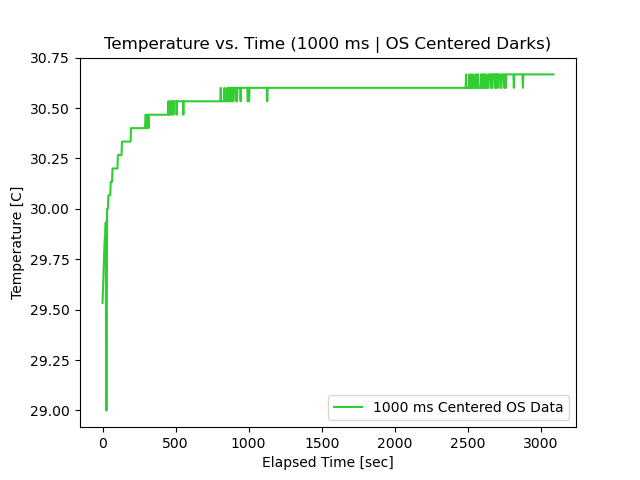

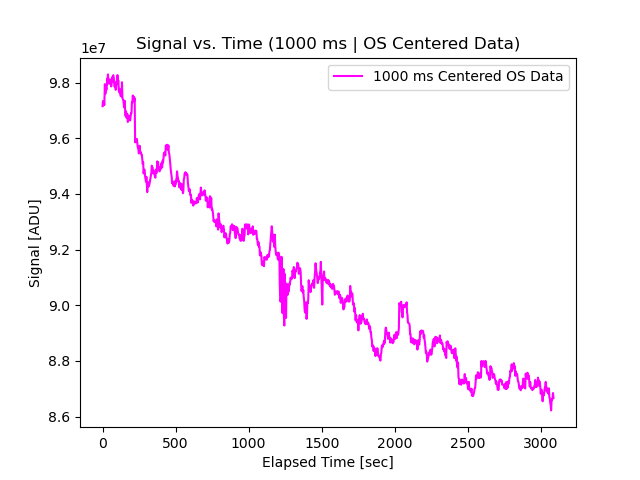

In [10]:
plt.figure('T v T 1000 ms Centered Open Shutter Data')
plt.clf()
plt.plot(ElapsedTimesCOSD,TempsCOSD, color = 'limegreen', label = '1000 ms Centered OS Data')
plt.title('Temperature vs. Time (1000 ms | OS Centered Darks)')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms Centered Closed Shutter Data')
plt.clf()
plt.plot(ElapsedTimesCOSD,SignalsCOSD, color = 'magenta', label = '1000 ms Centered OS Data')
plt.title('Signal vs. Time (1000 ms | OS Centered Data)')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [70]:
#load in X0_YP1
#datadirectoryOpen = 'Image_Folders\OpenShutterDataFrames_Step19/'
datadirectoryOpen = 'Image_Folders\YP1_X0/'
filepatternOpen = '*.FTS'
ImageFileNameListX0_YP1 = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesListX0_YP1 = MakeImagesList(ImageFileNameListX0_YP1,1)

In [73]:
#Making Time and Date Arrays for X0_YP1
ImagesList = ImagesListX0_YP1
TimesX0_YP1, TempsX0_YP1, SignalsX0_YP1, FilesX0_YP1 = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = TimesX0_YP1.argsort()
TimesX0_YP1 = TimesX0_YP1[idx]
TempsX0_YP1 = TempsX0_YP1[idx]
SignalsX0_YP1 = SignalsX0_YP1[idx]
FilesX0_YP1 = FilesX0_YP1[idx]

ElapsedTimesX0_YP1 = TimesX0_YP1 - np.amin(TimesX0_YP1)
ElapsedTimesX0_YP1 = ElapsedTimesX0_YP1*86400 #now in seconds

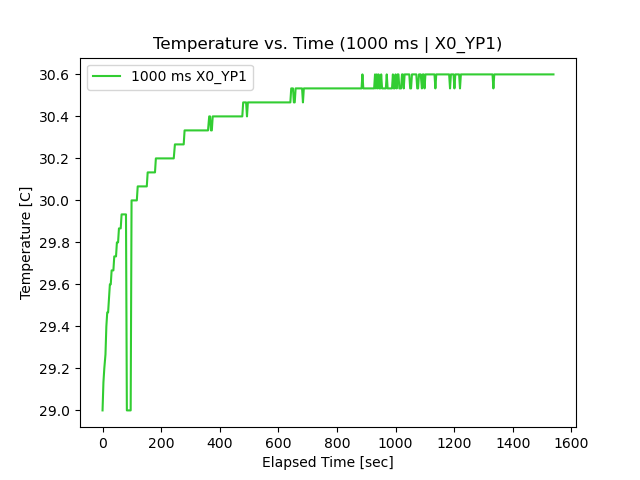

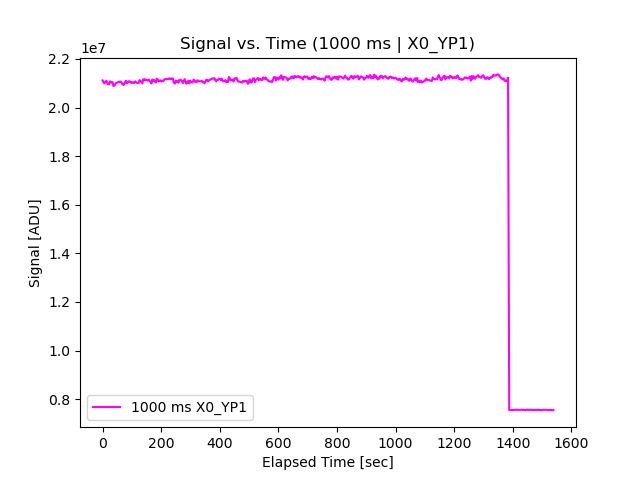

In [74]:
plt.figure('T v T 1000 ms X0_YP1')
plt.clf()
plt.plot(ElapsedTimesX0_YP1,TempsX0_YP1, color = 'limegreen', label = '1000 ms X0_YP1')
plt.title('Temperature vs. Time (1000 ms | X0_YP1)')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms X0_YP1')
plt.clf()
plt.plot(ElapsedTimesX0_YP1,SignalsX0_YP1, color = 'magenta', label = '1000 ms X0_YP1')
plt.title('Signal vs. Time (1000 ms | X0_YP1)')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [76]:
#I have decided that Steady State occurs after an elapsed time of 695 seconds
#Data Frames between 695 and 1328 seconds
#Dark Frames after 1390 seconds

#I begin with the data frames

#Making a list of Data Frame files
FileNameListX0_YP1_ssBeam = ListFilesBetweenElapsedTime(695,1328,TimesX0_YP1,FilesX0_YP1)

#Making a list of Dark Frame files
FileNameListX0_YP1_ssDarks = ListFilesAfterElapsedTime(1390,TimesX0_YP1,FilesX0_YP1)

#Moving these files to a new folder
destinationBeam = 'SteadyStateDataSets\X0_YP1\BeamImages/'
for source in FileNameListX0_YP1_ssBeam:
    shutil.copy(source,destinationBeam)
    
destinationDarks = 'SteadyStateDataSets\X0_YP1\CS_Darks/'
for source in FileNameListX0_YP1_ssDarks:
    shutil.copy(source,destinationDarks)

In [77]:
#Loading in the new Steady State files

datadirectoryOpen = 'SteadyStateDataSets\X0_YP1\BeamImages/'
filepatternOpen = '*.FTS'
ImageFileNameListX0_YP1_ssBeam = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesListX0_YP1_ssBeam = MakeImagesList(ImageFileNameListX0_YP1_ssBeam,1)

datadirectoryOpen = 'SteadyStateDataSets\X0_YP1\CS_Darks/'
filepatternOpen = '*.FTS'
ImageFileNameListX0_YP1_ssDarks = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesListX0_YP1_ssDarks = MakeImagesList(ImageFileNameListX0_YP1_ssDarks,1)

In [78]:
#Making Time and Date Arrays for X0_YP1 Steady State Beam Images 
ImagesList = ImagesListX0_YP1_ssBeam
TimesX0_YP1_ssBeam, TempsX0_YP1_ssBeam, SignalsX0_YP1_ssBeam, FilesX0_YP1_ssBeam = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = TimesX0_YP1_ssBeam.argsort()
TimesX0_YP1_ssBeam = TimesX0_YP1_ssBeam[idx]
TempsX0_YP1_ssBeam = TempsX0_YP1_ssBeam[idx]
SignalsX0_YP1_ssBeam = SignalsX0_YP1_ssBeam[idx]
FilesX0_YP1_ssBeam = FilesX0_YP1_ssBeam[idx]

ElapsedTimeX0_YP1_ssBeam = GetElapsedTimeArray(TimesX0_YP1_ssBeam)

#Making Time and Date Arrays for X0_YP1 Steady State Dark Frames 
ImagesList = ImagesListX0_YP1_ssDarks
TimesX0_YP1_ssDarks, TempsX0_YP1_ssDarks, SignalsX0_YP1_ssDarks, FilesX0_YP1_ssDarks = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = TimesX0_YP1_ssDarks.argsort()
TimesX0_YP1_ssDarks = TimesX0_YP1_ssDarks[idx]
TempsX0_YP1_ssDarks = TempsX0_YP1_ssDarks[idx]
SignalsX0_YP1_ssDarks = SignalsX0_YP1_ssDarks[idx]
FilesX0_YP1_ssDarks = FilesX0_YP1_ssDarks[idx]

ElapsedTimeX0_YP1_ssDarks = GetElapsedTimeArray(TimesX0_YP1_ssDarks)

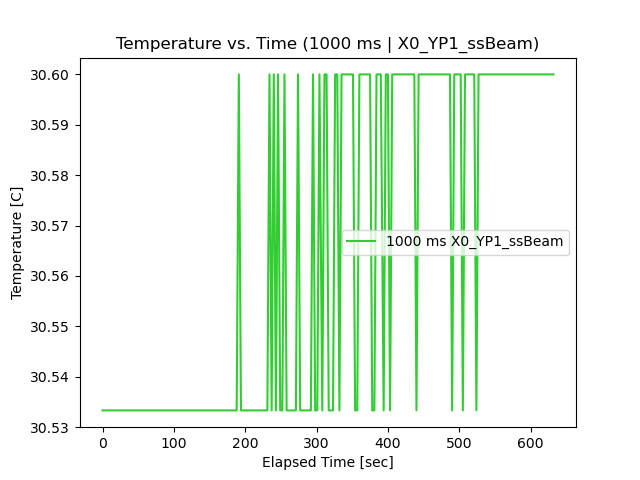

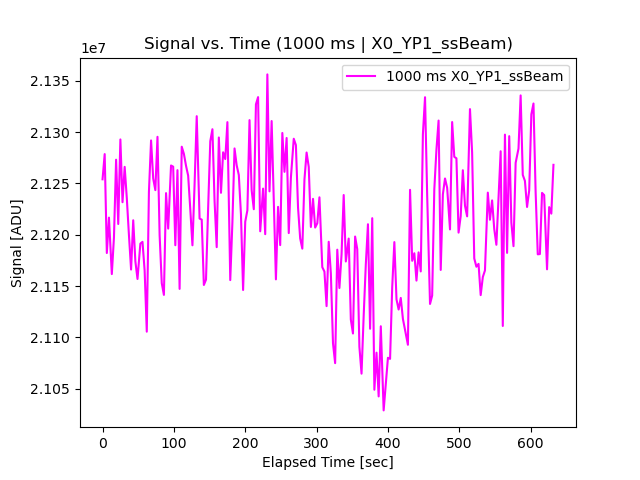

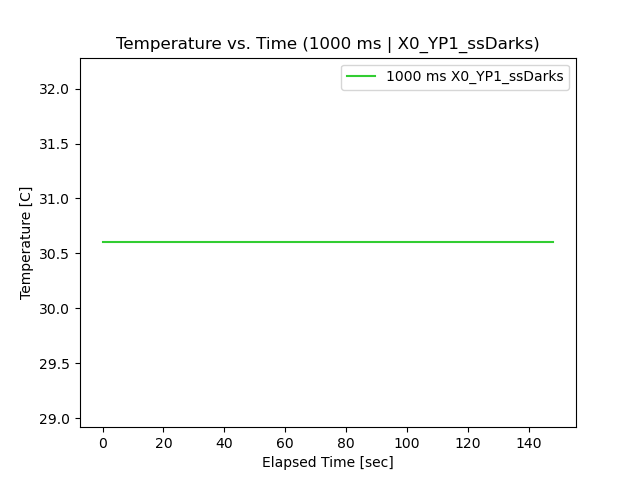

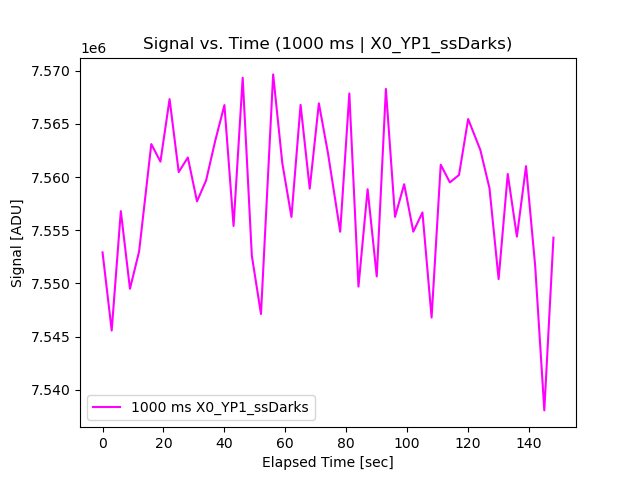

In [79]:
plt.figure('T v T 1000 ms X0_YP1_ssBeam')
plt.clf()
plt.plot(ElapsedTimeX0_YP1_ssBeam,TempsX0_YP1_ssBeam, color = 'limegreen', label = '1000 ms X0_YP1_ssBeam')
plt.title('Temperature vs. Time (1000 ms | X0_YP1_ssBeam)')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms X0_YP1_ssBeam')
plt.clf()
plt.plot(ElapsedTimeX0_YP1_ssBeam,SignalsX0_YP1_ssBeam, color = 'magenta', label = '1000 ms X0_YP1_ssBeam')
plt.title('Signal vs. Time (1000 ms | X0_YP1_ssBeam)')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

plt.figure('T v T 1000 ms X0_YP1_ssDarks')
plt.clf()
plt.plot(ElapsedTimeX0_YP1_ssDarks,TempsX0_YP1_ssDarks, color = 'limegreen', label = '1000 ms X0_YP1_ssDarks')
plt.title('Temperature vs. Time (1000 ms | X0_YP1_ssDarks)')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms X0_YP1_ssDarks')
plt.clf()
plt.plot(ElapsedTimeX0_YP1_ssDarks,SignalsX0_YP1_ssDarks, color = 'magenta', label = '1000 ms X0_YP1_ssDarks')
plt.title('Signal vs. Time (1000 ms | X0_YP1_ssDarks)')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [81]:
#Getting printing information about the steady state data set for printing and attaching.
DataSetName = "(0,1) Steady State Beam Images"
ImagesList = ImagesListX0_YP1_ssBeam

PrintDataSetInfo(DataSetName,ImagesList)

print("")

DataSetName = "(0,1) Steady State Closed Shutter Dark Frames"
ImagesList = ImagesListX0_YP1_ssDarks

PrintDataSetInfo(DataSetName,ImagesList)


Data Set: (0,1) Steady State Beam Images
Time Start: 2022-12-01T02:19:26.000 (UTC)
Time Stop: 2022-12-01T02:29:58.000 (UTC)
Elapsed Time: 10 min 32.0 sec
Exposure Time: 999.991 ms
Number of Frames: 206
Min Sensor Temperature: 30.53
Max Sensor Temperature: 30.6
Median Sensor Temperature: 30.53
Mean Sensor Temperature: 30.57
Standard Deviation of Sensor Temperature: 0.03


Data Set: (0,1) Steady State Closed Shutter Dark Frames
Time Start: 2022-12-01T02:31:01.000 (UTC)
Time Stop: 2022-12-01T02:33:29.000 (UTC)
Elapsed Time: 2 min 28.0 sec
Exposure Time: 999.991 ms
Number of Frames: 49
Min Sensor Temperature: 30.6
Max Sensor Temperature: 30.6
Median Sensor Temperature: 30.6
Mean Sensor Temperature: 30.6
Standard Deviation of Sensor Temperature: 0.0


***
### (0,-1)

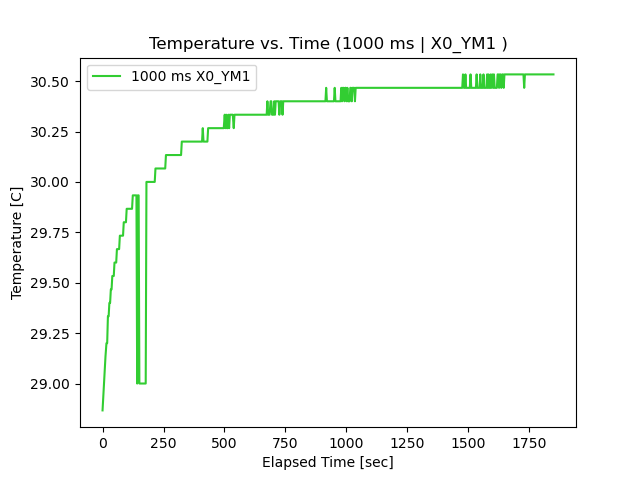

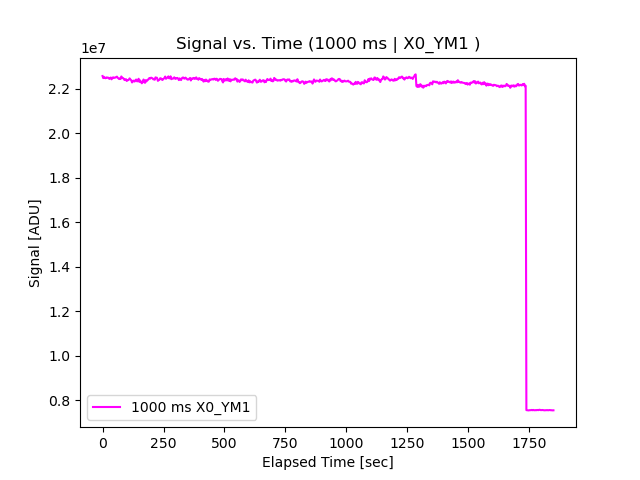

In [88]:
#load in X0_YM1
SetName = 'X0_YM1'
FolderName = '\YM1_X0/'

datadirectoryOpen = 'Image_Folders' + FolderName
filepatternOpen = '*.FTS'
ImageFileNameList = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList = MakeImagesList(ImageFileNameList,1)

#Making Time and Date Arrays for Centered Open Shutter Data (x0 y0 turns)
Times, Temps, Signals, Files = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times.argsort()
Times = Times[idx]
Temps = Temps[idx]
Signals = Signals[idx]
Files = Files[idx]

ElapsedTimes = Times - np.amin(Times)
ElapsedTimes = ElapsedTimes*86400 #now in seconds

#Plotting 
plt.figure('T v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Temps, color = 'limegreen', label = '1000 ms ' + SetName)
plt.title('Temperature vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Signals, color = 'magenta', label = '1000 ms ' + SetName)
plt.title('Signal vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [89]:
#Defining and moving the two steady state sets
#Manually input the corresponding Elapsed Times
SteadyStateStart = 1040
DataFramesEnd = 1720
DarkFramesStart = 1740

#Making a list of Steady State Data Frame files
FileNameList_ssBeam = ListFilesBetweenElapsedTime(SteadyStateStart,DataFramesEnd,Times,Files)

#Making a list of Steady State Dark Frame files
FileNameList_ssDarks = ListFilesAfterElapsedTime(DarkFramesStart,Times,Files)

#Moving these files to new folders
DestStr = 'SteadyStateDataSets/' + SetName + '/'

#destinationBeam = 'SteadyStateDataSets\X0_YP1\BeamImages/'
destinationBeam = DestStr + 'BeamImages/'
for source in FileNameList_ssBeam:
    shutil.copy(source,destinationBeam)
    
#destinationDarks = 'SteadyStateDataSets\X0_YP1\CS_Darks/'
destinationDarks = DestStr + 'CS_Darks/'
for source in FileNameList_ssDarks:
    shutil.copy(source,destinationDarks)

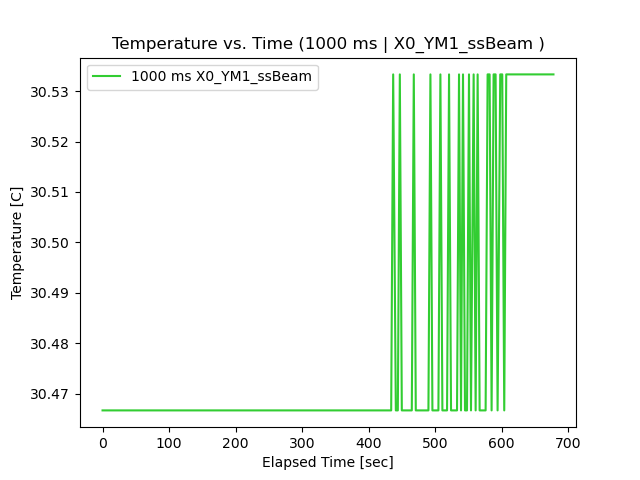

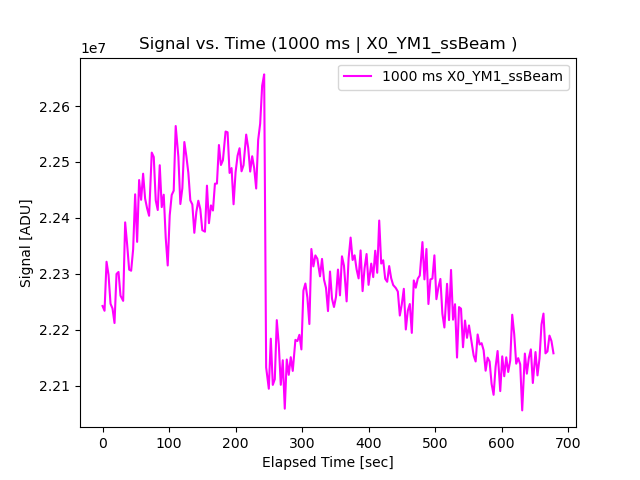

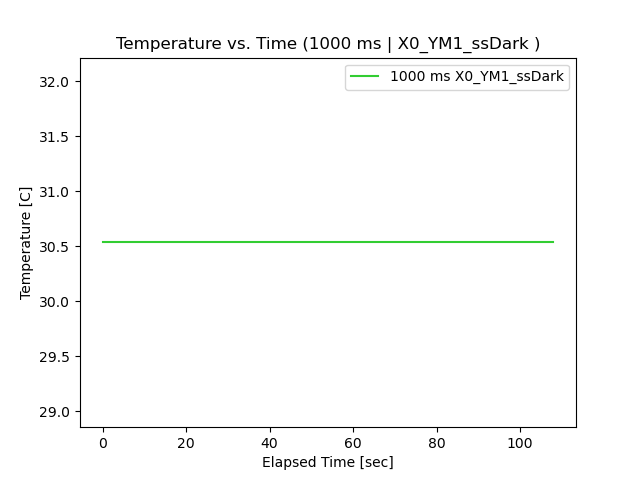

C:\Users\Colin Packard\AppData\Local\Temp\ipykernel_15388\3530622120.py:71: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure('Signal v T 1000 ms b' + SetName2)


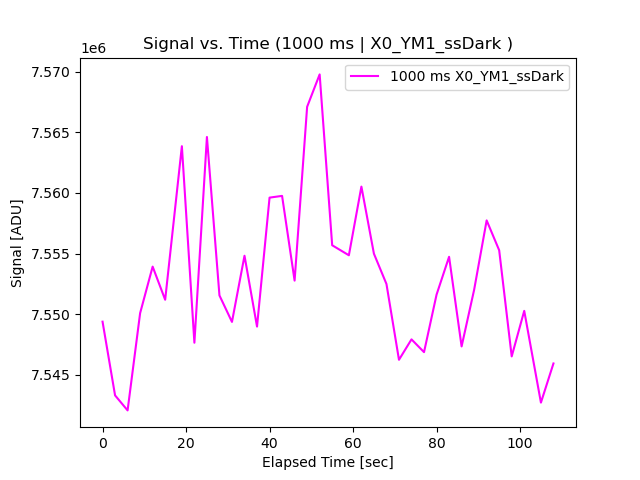


Data Set: (0,-1) Steady State Beam Images
Time Start: 2022-12-01T03:35:59.000 (UTC)
Time Stop: 2022-12-01T03:47:17.000 (UTC)
Elapsed Time: 11 min 18.0 sec
Exposure Time: 999.991 ms
Number of Frames: 221
Min Sensor Temperature: 30.47
Max Sensor Temperature: 30.53
Median Sensor Temperature: 30.47
Mean Sensor Temperature: 30.48
Standard Deviation of Sensor Temperature: 0.03


Data Set: (0,-1) Steady State Closed Shutter Dark Frames
Time Start: 2022-12-01T03:47:39.000 (UTC)
Time Stop: 2022-12-01T03:49:27.000 (UTC)
Elapsed Time: 1 min 48.0 sec
Exposure Time: 999.991 ms
Number of Frames: 36
Min Sensor Temperature: 30.53
Max Sensor Temperature: 30.53
Median Sensor Temperature: 30.53
Mean Sensor Temperature: 30.53
Standard Deviation of Sensor Temperature: 0.0


In [92]:
#Loading in the new Steady State files

datadirectoryOpen = DestStr + 'BeamImages/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssBeam = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssBeam = MakeImagesList(ImageFileNameList_ssBeam,1)

datadirectoryOpen = DestStr + 'CS_Darks/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssDarks = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssDarks = MakeImagesList(ImageFileNameList_ssDarks,1)

#Making Time and Date Arrays for Steady State Beam Images 
ImagesList = ImagesList_ssBeam
Times_ssBeam, Temps_ssBeam, Signals_ssBeam, Files_ssBeam = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssBeam.argsort()
Times_ssBeam = Times_ssBeam[idx]
Temps_ssBeam = Temps_ssBeam[idx]
Signals_ssBeam = Signals_ssBeam[idx]
Files_ssBeam = Files_ssBeam[idx]

ElapsedTimes_ssBeam = GetElapsedTimeArray(Times_ssBeam)

#Making Time and Date Arrays forSteady State Dark Frames 
ImagesList = ImagesList_ssDarks
Times_ssDarks, Temps_ssDarks, Signals_ssDarks, Files_ssDarks = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssDarks.argsort()
Times_ssDarks = Times_ssDarks[idx]
Temps_ssDarks = Temps_ssDarks[idx]
Signals_ssDarks = Signals_ssDarks[idx]
Files_ssDarks = Files_ssDarks[idx]

ElapsedTimes_ssDarks = GetElapsedTimeArray(Times_ssDarks)

#Plotting 
SetName1 = SetName + "_ssBeam"

plt.figure('T v T 1000 ms b' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Temps_ssBeam, color = 'limegreen', label = '1000 ms ' + SetName1)
plt.title('Temperature vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms b' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Signals_ssBeam, color = 'magenta', label = '1000 ms ' + SetName1)
plt.title('Signal vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

SetName2 = SetName + "_ssDark"

plt.figure('T v T 1000 ms b' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Temps_ssDarks, color = 'limegreen', label = '1000 ms ' + SetName2)
plt.title('Temperature vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms b' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Signals_ssDarks, color = 'magenta', label = '1000 ms ' + SetName2)
plt.title('Signal vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()



#Getting printing information about the steady state data set for printing and attaching.
DataSetName = "(0,-1) Steady State Beam Images"
ImagesList = ImagesList_ssBeam

PrintDataSetInfo(DataSetName,ImagesList)

print("")

DataSetName = "(0,-1) Steady State Closed Shutter Dark Frames"
ImagesList = ImagesList_ssDarks

PrintDataSetInfo(DataSetName,ImagesList)

***
### (2,0)

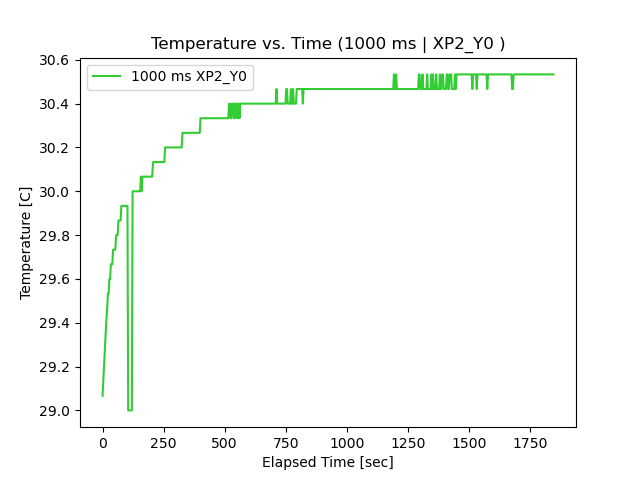

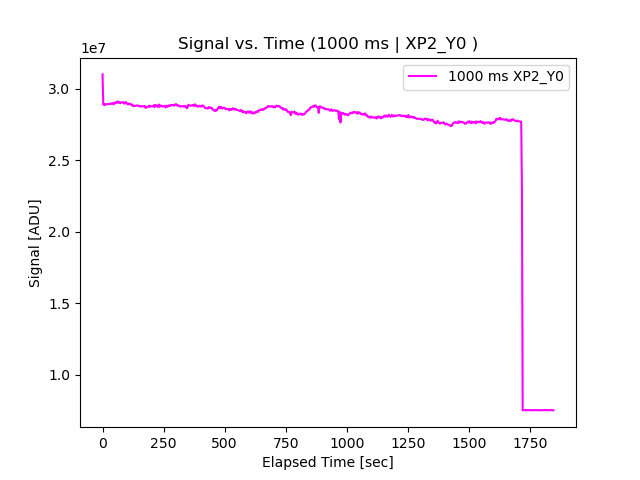

In [93]:
#load in XP2_Y0
SetName = 'XP2_Y0'
FolderName = '\Y0_XP2/'

datadirectoryOpen = 'Image_Folders' + FolderName
filepatternOpen = '*.FTS'
ImageFileNameList = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList = MakeImagesList(ImageFileNameList,1)

#Making Time and Date Arrays for Centered Open Shutter Data (x0 y0 turns)
Times, Temps, Signals, Files = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times.argsort()
Times = Times[idx]
Temps = Temps[idx]
Signals = Signals[idx]
Files = Files[idx]

ElapsedTimes = Times - np.amin(Times)
ElapsedTimes = ElapsedTimes*86400 #now in seconds

#Plotting 
plt.figure('T v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Temps, color = 'limegreen', label = '1000 ms ' + SetName)
plt.title('Temperature vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Signals, color = 'magenta', label = '1000 ms ' + SetName)
plt.title('Signal vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [95]:
#Defining and moving the two steady state sets
#Manually input the corresponding Elapsed Times
SteadyStateStart = 825
DataFramesEnd = 1699 #to give 15 seconds to drop off at 1714
DarkFramesStart = 1724

#Making a list of Steady State Data Frame files
FileNameList_ssBeam = ListFilesBetweenElapsedTime(SteadyStateStart,DataFramesEnd,Times,Files)

#Making a list of Steady State Dark Frame files
FileNameList_ssDarks = ListFilesAfterElapsedTime(DarkFramesStart,Times,Files)

#Moving these files to new folders
DestStr = 'SteadyStateDataSets/' + SetName + '/'

destinationBeam = DestStr + 'BeamImages/'
for source in FileNameList_ssBeam:
    shutil.copy(source,destinationBeam)
    
destinationDarks = DestStr + 'CS_Darks/'
for source in FileNameList_ssDarks:
    shutil.copy(source,destinationDarks)

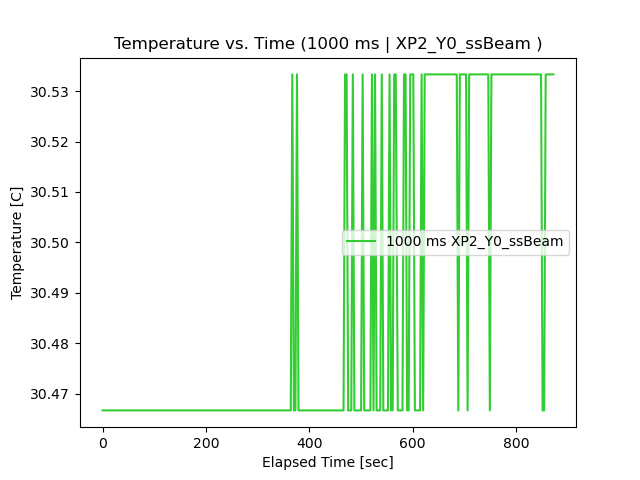

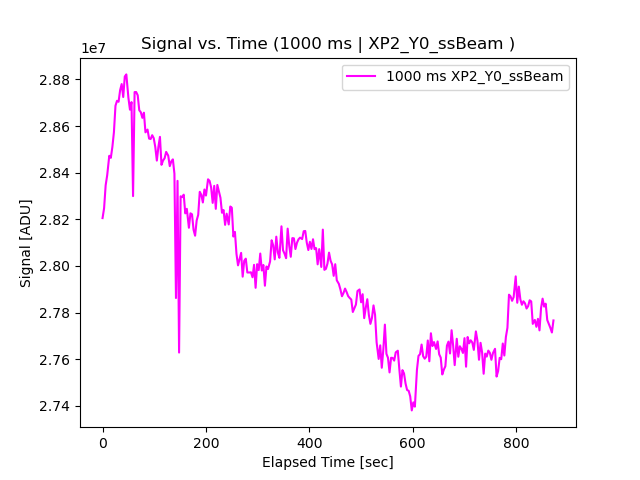

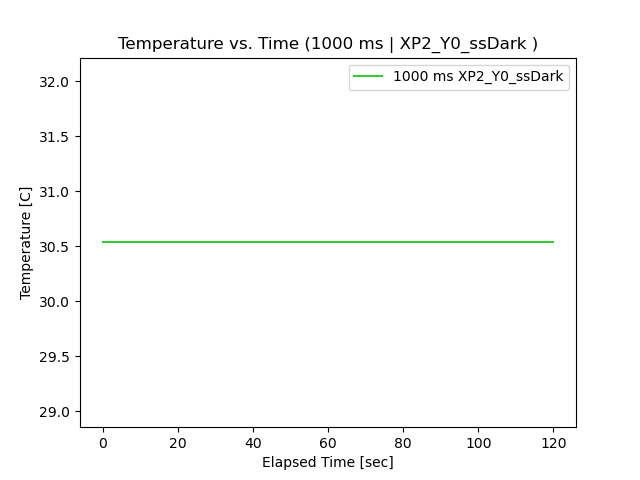

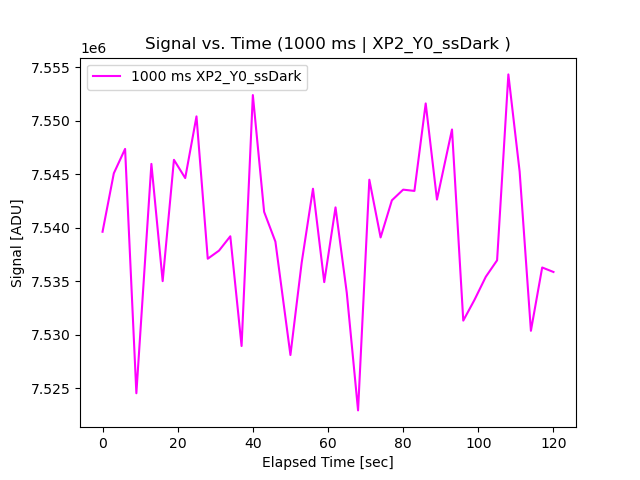


Data Set: (2,0) Steady State Beam Images
Time Start: 2022-12-01T04:24:47.000 (UTC)
Time Stop: 2022-12-01T04:39:19.000 (UTC)
Elapsed Time: 14 min 32.0 sec
Exposure Time: 999.991 ms
Number of Frames: 284
Min Sensor Temperature: 30.47
Max Sensor Temperature: 30.53
Median Sensor Temperature: 30.47
Mean Sensor Temperature: 30.49
Standard Deviation of Sensor Temperature: 0.03


Data Set: (2,0) Steady State Closed Shutter Dark Frames
Time Start: 2022-12-01T04:39:47.000 (UTC)
Time Stop: 2022-12-01T04:41:47.000 (UTC)
Elapsed Time: 1 min 60.0 sec
Exposure Time: 999.991 ms
Number of Frames: 40
Min Sensor Temperature: 30.53
Max Sensor Temperature: 30.53
Median Sensor Temperature: 30.53
Mean Sensor Temperature: 30.53
Standard Deviation of Sensor Temperature: 0.0


In [97]:
#Loading in the new Steady State files

datadirectoryOpen = DestStr + 'BeamImages/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssBeam = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssBeam = MakeImagesList(ImageFileNameList_ssBeam,1)

datadirectoryOpen = DestStr + 'CS_Darks/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssDarks = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssDarks = MakeImagesList(ImageFileNameList_ssDarks,1)

#Making Time and Date Arrays for Steady State Beam Images 
ImagesList = ImagesList_ssBeam
Times_ssBeam, Temps_ssBeam, Signals_ssBeam, Files_ssBeam = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssBeam.argsort()
Times_ssBeam = Times_ssBeam[idx]
Temps_ssBeam = Temps_ssBeam[idx]
Signals_ssBeam = Signals_ssBeam[idx]
Files_ssBeam = Files_ssBeam[idx]

ElapsedTimes_ssBeam = GetElapsedTimeArray(Times_ssBeam)

#Making Time and Date Arrays forSteady State Dark Frames 
ImagesList = ImagesList_ssDarks
Times_ssDarks, Temps_ssDarks, Signals_ssDarks, Files_ssDarks = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssDarks.argsort()
Times_ssDarks = Times_ssDarks[idx]
Temps_ssDarks = Temps_ssDarks[idx]
Signals_ssDarks = Signals_ssDarks[idx]
Files_ssDarks = Files_ssDarks[idx]

ElapsedTimes_ssDarks = GetElapsedTimeArray(Times_ssDarks)

#Plotting 
SetName1 = SetName + "_ssBeam"

plt.figure('T v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Temps_ssBeam, color = 'limegreen', label = '1000 ms ' + SetName1)
plt.title('Temperature vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Signals_ssBeam, color = 'magenta', label = '1000 ms ' + SetName1)
plt.title('Signal vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

SetName2 = SetName + "_ssDark"

plt.figure('T v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Temps_ssDarks, color = 'limegreen', label = '1000 ms ' + SetName2)
plt.title('Temperature vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Signals_ssDarks, color = 'magenta', label = '1000 ms ' + SetName2)
plt.title('Signal vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()



#Getting printing information about the steady state data set for printing and attaching.
DataSetName = "(2,0) Steady State Beam Images"
ImagesList = ImagesList_ssBeam

PrintDataSetInfo(DataSetName,ImagesList)

print("")

DataSetName = "(2,0) Steady State Closed Shutter Dark Frames"
ImagesList = ImagesList_ssDarks

PrintDataSetInfo(DataSetName,ImagesList)

***
### (-2,0)

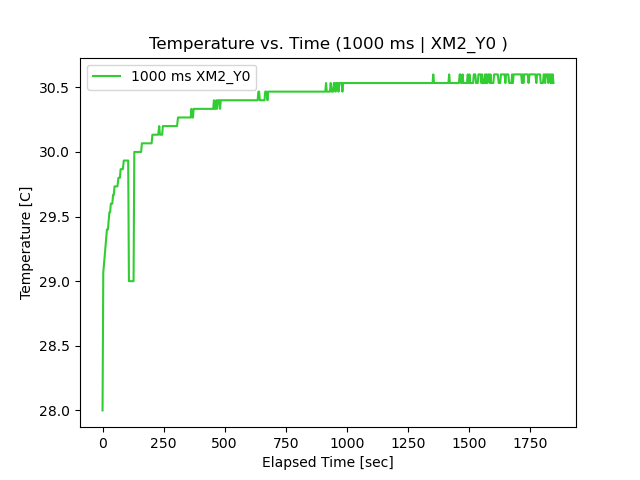

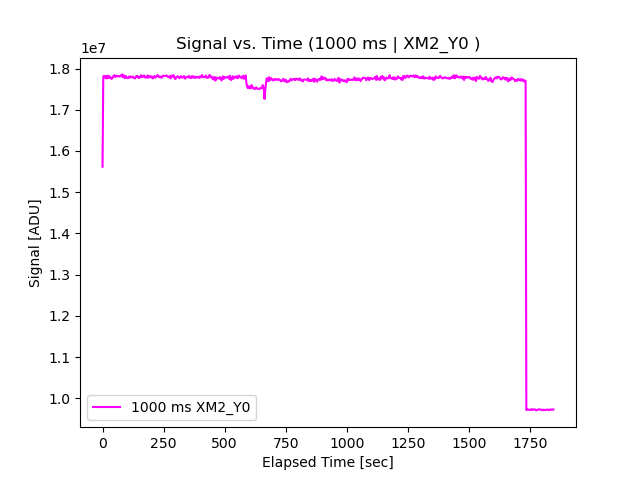

In [98]:
#load in XM2_Y0
SetName = 'XM2_Y0'
FolderName = '\Y0_XM2/'

datadirectoryOpen = 'Image_Folders' + FolderName
filepatternOpen = '*.FTS'
ImageFileNameList = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList = MakeImagesList(ImageFileNameList,1)

#Making Time and Date Arrays for Centered Open Shutter Data (x0 y0 turns)
Times, Temps, Signals, Files = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times.argsort()
Times = Times[idx]
Temps = Temps[idx]
Signals = Signals[idx]
Files = Files[idx]

ElapsedTimes = Times - np.amin(Times)
ElapsedTimes = ElapsedTimes*86400 #now in seconds

#Plotting 
plt.figure('T v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Temps, color = 'limegreen', label = '1000 ms ' + SetName)
plt.title('Temperature vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Signals, color = 'magenta', label = '1000 ms ' + SetName)
plt.title('Signal vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [99]:
#Defining and moving the two steady state sets
#Manually input the corresponding Elapsed Times
SteadyStateStart = 986
DataFramesEnd = 1717 #to give 15 seconds to drop off at 1732
DarkFramesStart = 1737

#Making a list of Steady State Data Frame files
FileNameList_ssBeam = ListFilesBetweenElapsedTime(SteadyStateStart,DataFramesEnd,Times,Files)

#Making a list of Steady State Dark Frame files
FileNameList_ssDarks = ListFilesAfterElapsedTime(DarkFramesStart,Times,Files)

#Moving these files to new folders
DestStr = 'SteadyStateDataSets/' + SetName + '/'

destinationBeam = DestStr + 'BeamImages/'
for source in FileNameList_ssBeam:
    shutil.copy(source,destinationBeam)
    
destinationDarks = DestStr + 'CS_Darks/'
for source in FileNameList_ssDarks:
    shutil.copy(source,destinationDarks)

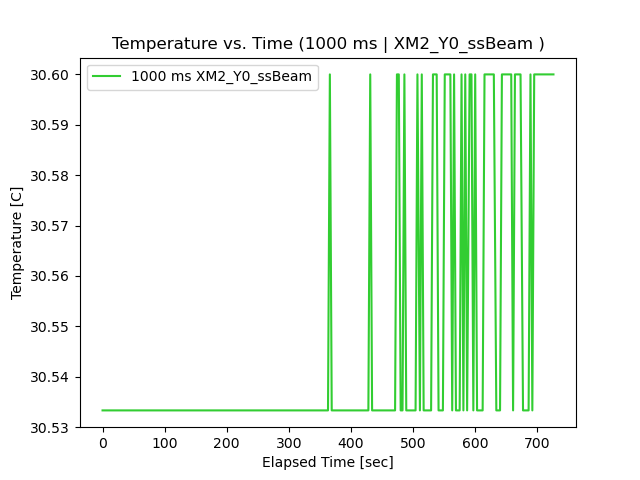

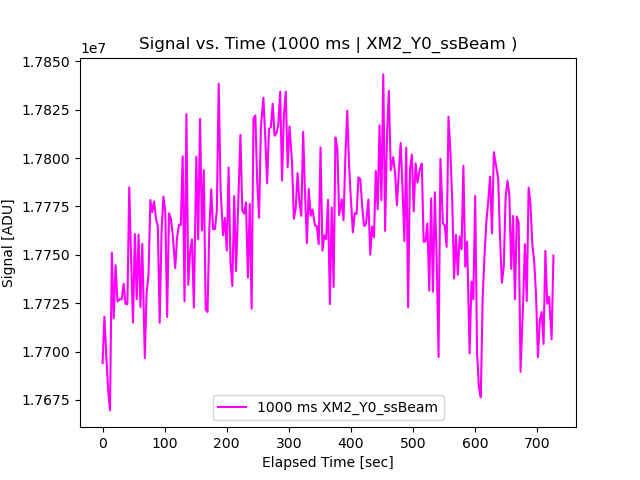

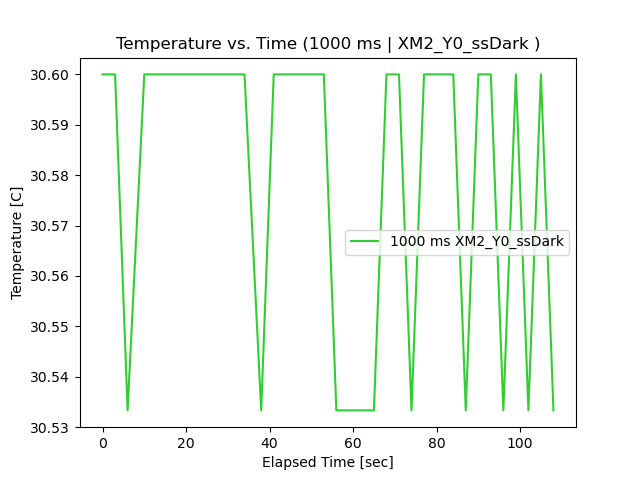

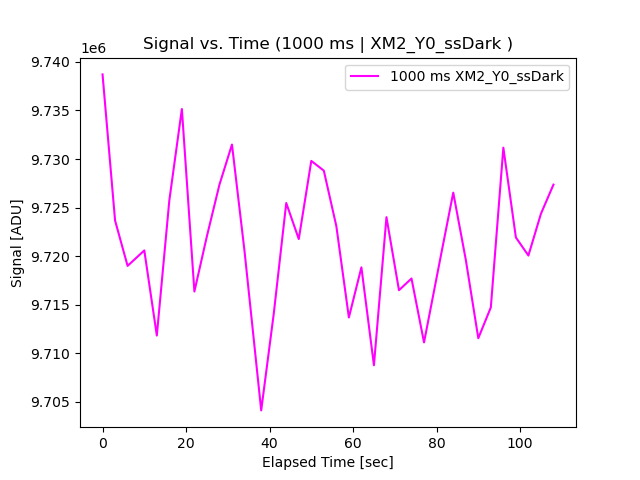


Data Set: (-2,0) Steady State Beam Images
Time Start: 2022-12-01T05:08:38.000 (UTC)
Time Stop: 2022-12-01T05:20:44.000 (UTC)
Elapsed Time: 12 min 6.0 sec
Exposure Time: 999.991 ms
Number of Frames: 237
Min Sensor Temperature: 30.53
Max Sensor Temperature: 30.6
Median Sensor Temperature: 30.53
Mean Sensor Temperature: 30.55
Standard Deviation of Sensor Temperature: 0.03


Data Set: (-2,0) Steady State Closed Shutter Dark Frames
Time Start: 2022-12-01T05:21:08.000 (UTC)
Time Stop: 2022-12-01T05:22:56.000 (UTC)
Elapsed Time: 1 min 48.0 sec
Exposure Time: 999.991 ms
Number of Frames: 36
Min Sensor Temperature: 30.53
Max Sensor Temperature: 30.6
Median Sensor Temperature: 30.6
Mean Sensor Temperature: 30.58
Standard Deviation of Sensor Temperature: 0.03


In [100]:
#Loading in the new Steady State files

datadirectoryOpen = DestStr + 'BeamImages/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssBeam = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssBeam = MakeImagesList(ImageFileNameList_ssBeam,1)

datadirectoryOpen = DestStr + 'CS_Darks/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssDarks = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssDarks = MakeImagesList(ImageFileNameList_ssDarks,1)

#Making Time and Date Arrays for Steady State Beam Images 
ImagesList = ImagesList_ssBeam
Times_ssBeam, Temps_ssBeam, Signals_ssBeam, Files_ssBeam = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssBeam.argsort()
Times_ssBeam = Times_ssBeam[idx]
Temps_ssBeam = Temps_ssBeam[idx]
Signals_ssBeam = Signals_ssBeam[idx]
Files_ssBeam = Files_ssBeam[idx]

ElapsedTimes_ssBeam = GetElapsedTimeArray(Times_ssBeam)

#Making Time and Date Arrays forSteady State Dark Frames 
ImagesList = ImagesList_ssDarks
Times_ssDarks, Temps_ssDarks, Signals_ssDarks, Files_ssDarks = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssDarks.argsort()
Times_ssDarks = Times_ssDarks[idx]
Temps_ssDarks = Temps_ssDarks[idx]
Signals_ssDarks = Signals_ssDarks[idx]
Files_ssDarks = Files_ssDarks[idx]

ElapsedTimes_ssDarks = GetElapsedTimeArray(Times_ssDarks)

#Plotting 
SetName1 = SetName + "_ssBeam"

plt.figure('T v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Temps_ssBeam, color = 'limegreen', label = '1000 ms ' + SetName1)
plt.title('Temperature vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Signals_ssBeam, color = 'magenta', label = '1000 ms ' + SetName1)
plt.title('Signal vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

SetName2 = SetName + "_ssDark"

plt.figure('T v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Temps_ssDarks, color = 'limegreen', label = '1000 ms ' + SetName2)
plt.title('Temperature vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Signals_ssDarks, color = 'magenta', label = '1000 ms ' + SetName2)
plt.title('Signal vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()



#Getting printing information about the steady state data set for printing and attaching.
DataSetName = "(-2,0) Steady State Beam Images"
ImagesList = ImagesList_ssBeam

PrintDataSetInfo(DataSetName,ImagesList)

print("")

DataSetName = "(-2,0) Steady State Closed Shutter Dark Frames"
ImagesList = ImagesList_ssDarks

PrintDataSetInfo(DataSetName,ImagesList)

***
### (2,1)

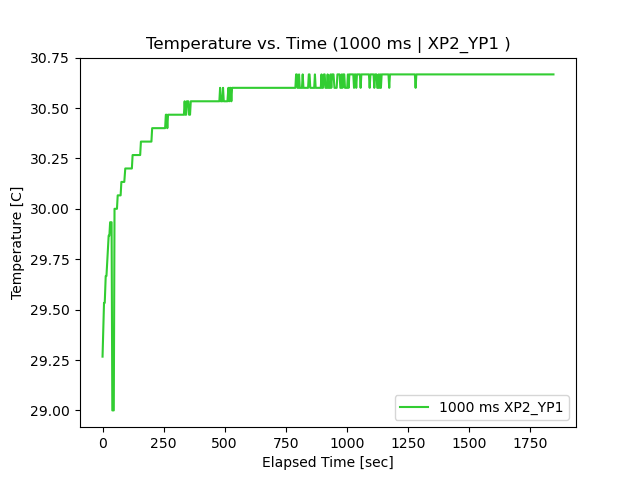

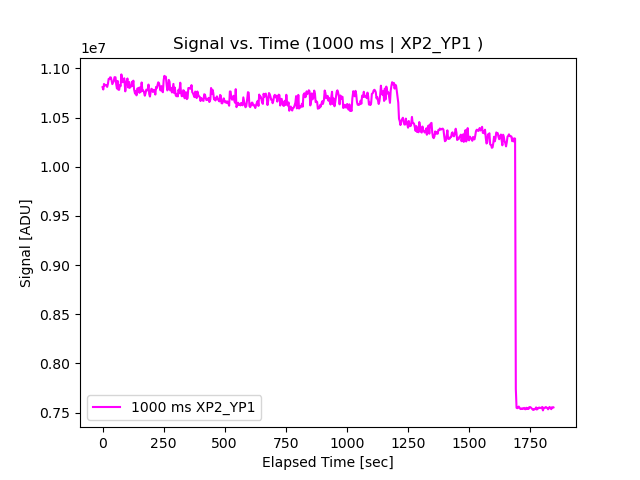

In [101]:
#load in XM2_Y0
SetName = 'XP2_YP1'
FolderName = '\YP1_XP2/'

datadirectoryOpen = 'Image_Folders' + FolderName
filepatternOpen = '*.FTS'
ImageFileNameList = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList = MakeImagesList(ImageFileNameList,1)

#Making Time and Date Arrays for Centered Open Shutter Data (x0 y0 turns)
Times, Temps, Signals, Files = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times.argsort()
Times = Times[idx]
Temps = Temps[idx]
Signals = Signals[idx]
Files = Files[idx]

ElapsedTimes = Times - np.amin(Times)
ElapsedTimes = ElapsedTimes*86400 #now in seconds

#Plotting 
plt.figure('T v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Temps, color = 'limegreen', label = '1000 ms ' + SetName)
plt.title('Temperature vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Signals, color = 'magenta', label = '1000 ms ' + SetName)
plt.title('Signal vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [103]:
#Defining and moving the two steady state sets
#Manually input the corresponding Elapsed Times
SteadyStateStart = 531
DataFramesEnd = 1673 #to give 15 seconds to drop off at 1732
DarkFramesStart = 1697 # 3 seconds after end of drop

#Making a list of Steady State Data Frame files
FileNameList_ssBeam = ListFilesBetweenElapsedTime(SteadyStateStart,DataFramesEnd,Times,Files)

#Making a list of Steady State Dark Frame files
FileNameList_ssDarks = ListFilesAfterElapsedTime(DarkFramesStart,Times,Files)

#Moving these files to new folders
DestStr = 'SteadyStateDataSets/' + SetName + '/'

destinationBeam = DestStr + 'BeamImages/'
for source in FileNameList_ssBeam:
    shutil.copy(source,destinationBeam)
    
destinationDarks = DestStr + 'CS_Darks/'
for source in FileNameList_ssDarks:
    shutil.copy(source,destinationDarks)

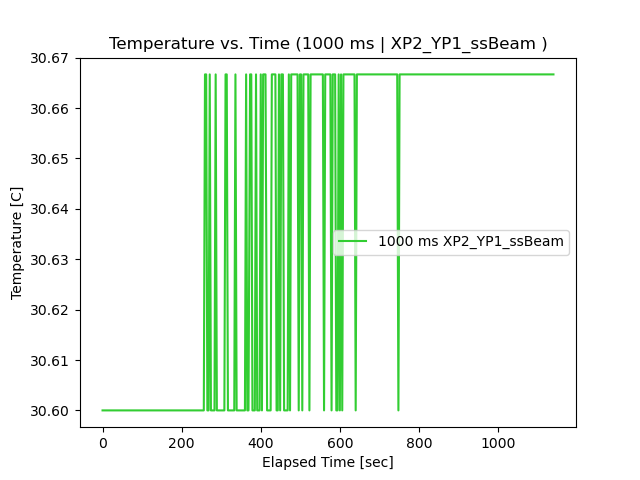

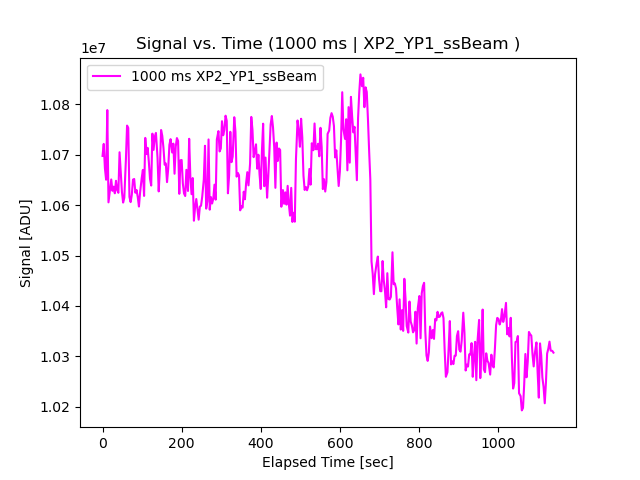

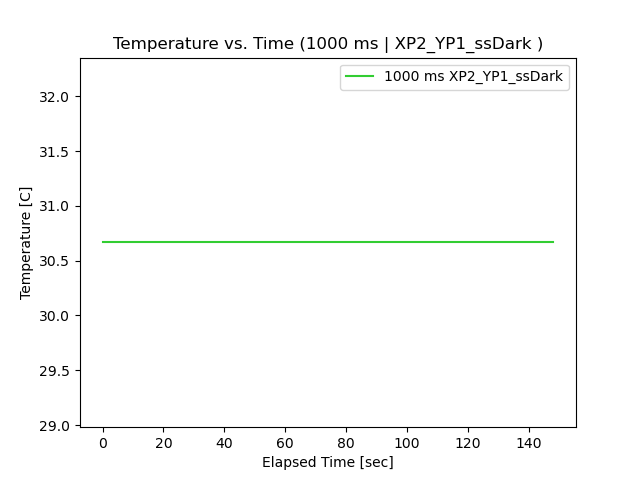

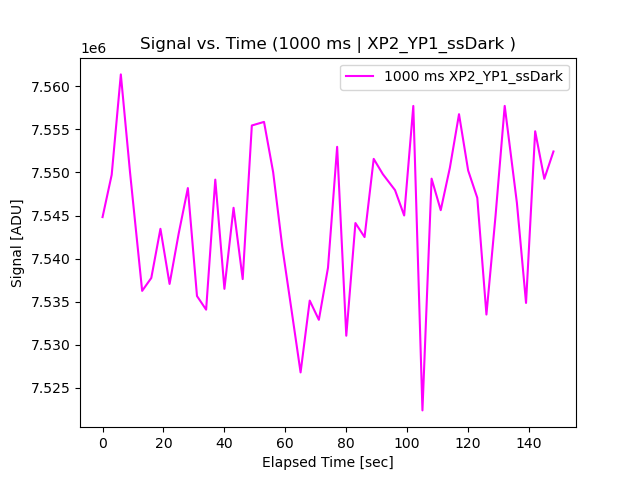


Data Set: (2,1) Steady State Beam Images
Time Start: 2022-12-01T08:47:40.000 (UTC)
Time Stop: 2022-12-01T09:06:40.000 (UTC)
Elapsed Time: 19 min 0.0 sec
Exposure Time: 999.991 ms
Number of Frames: 371
Min Sensor Temperature: 30.6
Max Sensor Temperature: 30.67
Median Sensor Temperature: 30.67
Mean Sensor Temperature: 30.64
Standard Deviation of Sensor Temperature: 0.03


Data Set: (2,1) Steady State Closed Shutter Dark Frames
Time Start: 2022-12-01T09:07:04.000 (UTC)
Time Stop: 2022-12-01T09:09:32.000 (UTC)
Elapsed Time: 2 min 28.0 sec
Exposure Time: 999.991 ms
Number of Frames: 49
Min Sensor Temperature: 30.67
Max Sensor Temperature: 30.67
Median Sensor Temperature: 30.67
Mean Sensor Temperature: 30.67
Standard Deviation of Sensor Temperature: 0.0


In [104]:
#Loading in the new Steady State files

datadirectoryOpen = DestStr + 'BeamImages/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssBeam = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssBeam = MakeImagesList(ImageFileNameList_ssBeam,1)

datadirectoryOpen = DestStr + 'CS_Darks/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssDarks = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssDarks = MakeImagesList(ImageFileNameList_ssDarks,1)

#Making Time and Date Arrays for Steady State Beam Images 
ImagesList = ImagesList_ssBeam
Times_ssBeam, Temps_ssBeam, Signals_ssBeam, Files_ssBeam = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssBeam.argsort()
Times_ssBeam = Times_ssBeam[idx]
Temps_ssBeam = Temps_ssBeam[idx]
Signals_ssBeam = Signals_ssBeam[idx]
Files_ssBeam = Files_ssBeam[idx]

ElapsedTimes_ssBeam = GetElapsedTimeArray(Times_ssBeam)

#Making Time and Date Arrays forSteady State Dark Frames 
ImagesList = ImagesList_ssDarks
Times_ssDarks, Temps_ssDarks, Signals_ssDarks, Files_ssDarks = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssDarks.argsort()
Times_ssDarks = Times_ssDarks[idx]
Temps_ssDarks = Temps_ssDarks[idx]
Signals_ssDarks = Signals_ssDarks[idx]
Files_ssDarks = Files_ssDarks[idx]

ElapsedTimes_ssDarks = GetElapsedTimeArray(Times_ssDarks)

#Plotting 
SetName1 = SetName + "_ssBeam"

plt.figure('T v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Temps_ssBeam, color = 'limegreen', label = '1000 ms ' + SetName1)
plt.title('Temperature vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Signals_ssBeam, color = 'magenta', label = '1000 ms ' + SetName1)
plt.title('Signal vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

SetName2 = SetName + "_ssDark"

plt.figure('T v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Temps_ssDarks, color = 'limegreen', label = '1000 ms ' + SetName2)
plt.title('Temperature vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Signals_ssDarks, color = 'magenta', label = '1000 ms ' + SetName2)
plt.title('Signal vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()



#Getting printing information about the steady state data set for printing and attaching.
DataSetName = "(2,1) Steady State Beam Images"
ImagesList = ImagesList_ssBeam

PrintDataSetInfo(DataSetName,ImagesList)

print("")

DataSetName = "(2,1) Steady State Closed Shutter Dark Frames"
ImagesList = ImagesList_ssDarks

PrintDataSetInfo(DataSetName,ImagesList)

***
### (2,1)

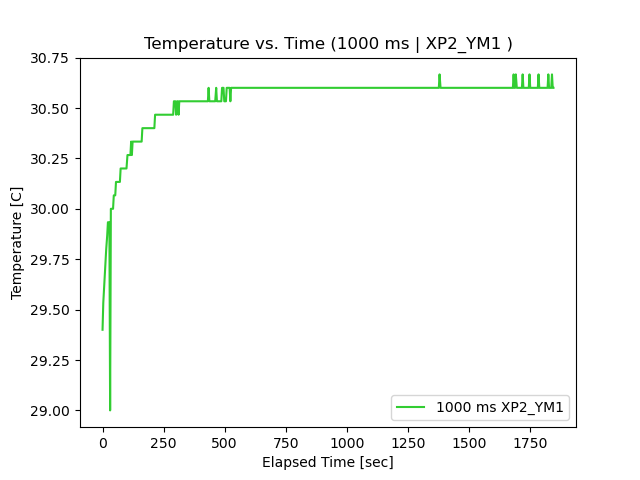

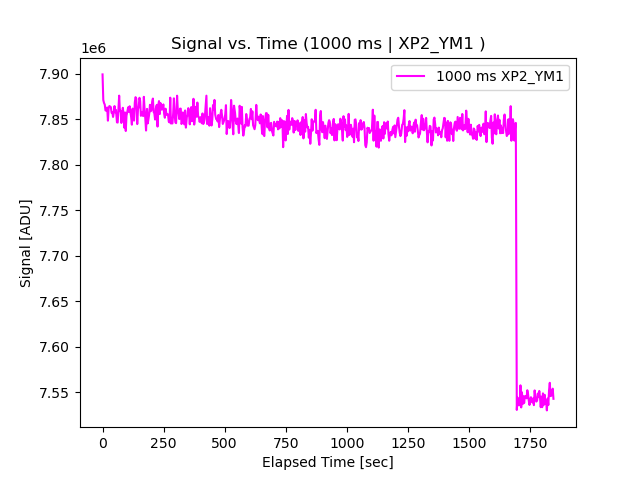

In [105]:
#load in XM2_Y0
SetName = 'XP2_YM1'
FolderName = '\YM1_XP2/'

datadirectoryOpen = 'Image_Folders' + FolderName
filepatternOpen = '*.FTS'
ImageFileNameList = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList = MakeImagesList(ImageFileNameList,1)

#Making Time and Date Arrays for Centered Open Shutter Data (x0 y0 turns)
Times, Temps, Signals, Files = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times.argsort()
Times = Times[idx]
Temps = Temps[idx]
Signals = Signals[idx]
Files = Files[idx]

ElapsedTimes = Times - np.amin(Times)
ElapsedTimes = ElapsedTimes*86400 #now in seconds

#Plotting 
plt.figure('T v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Temps, color = 'limegreen', label = '1000 ms ' + SetName)
plt.title('Temperature vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Signals, color = 'magenta', label = '1000 ms ' + SetName)
plt.title('Signal vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [106]:
#Defining and moving the two steady state sets
#Manually input the corresponding Elapsed Times
SteadyStateStart = 527
DataFramesEnd = 1676 #to give 15 seconds to drop off at 1732
DarkFramesStart = 1698 # 3 seconds after end of drop

#Making a list of Steady State Data Frame files
FileNameList_ssBeam = ListFilesBetweenElapsedTime(SteadyStateStart,DataFramesEnd,Times,Files)

#Making a list of Steady State Dark Frame files
FileNameList_ssDarks = ListFilesAfterElapsedTime(DarkFramesStart,Times,Files)

#Moving these files to new folders
DestStr = 'SteadyStateDataSets/' + SetName + '/'

destinationBeam = DestStr + 'BeamImages/'
for source in FileNameList_ssBeam:
    shutil.copy(source,destinationBeam)
    
destinationDarks = DestStr + 'CS_Darks/'
for source in FileNameList_ssDarks:
    shutil.copy(source,destinationDarks)

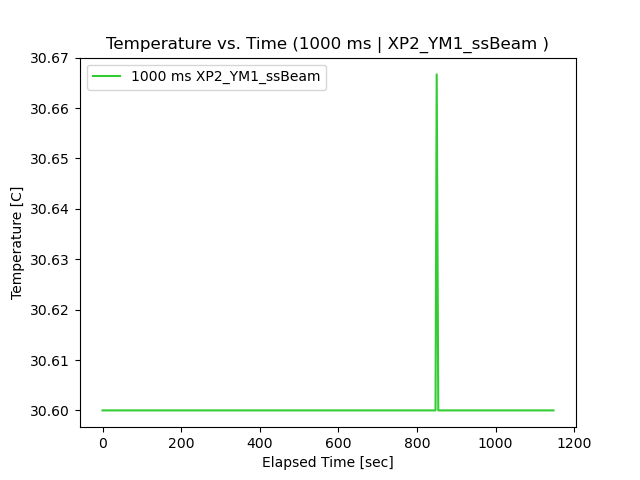

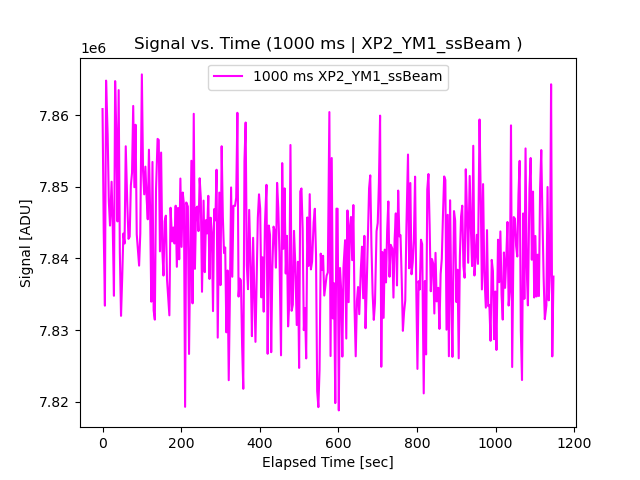

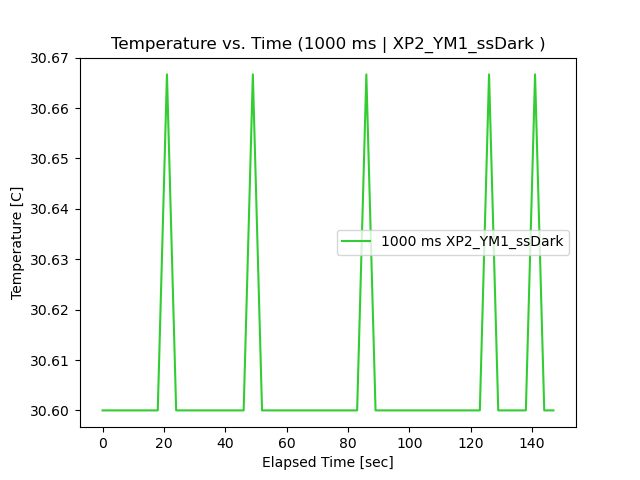

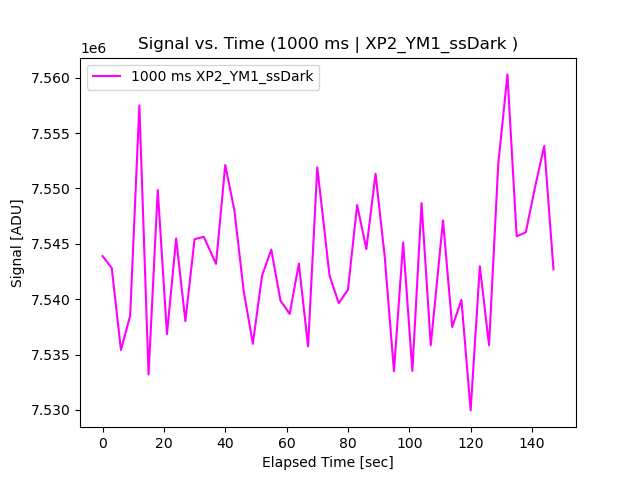


Data Set: (2,-1) Steady State Beam Images
Time Start: 2022-12-01T09:21:53.000 (UTC)
Time Stop: 2022-12-01T09:41:00.000 (UTC)
Elapsed Time: 19 min 7.0 sec
Exposure Time: 999.991 ms
Number of Frames: 373
Min Sensor Temperature: 30.6
Max Sensor Temperature: 30.67
Median Sensor Temperature: 30.6
Mean Sensor Temperature: 30.6
Standard Deviation of Sensor Temperature: 0.0


Data Set: (2,-1) Steady State Closed Shutter Dark Frames
Time Start: 2022-12-01T09:41:22.000 (UTC)
Time Stop: 2022-12-01T09:43:49.000 (UTC)
Elapsed Time: 2 min 27.0 sec
Exposure Time: 999.991 ms
Number of Frames: 49
Min Sensor Temperature: 30.6
Max Sensor Temperature: 30.67
Median Sensor Temperature: 30.6
Mean Sensor Temperature: 30.61
Standard Deviation of Sensor Temperature: 0.02


In [107]:
#Loading in the new Steady State files

datadirectoryOpen = DestStr + 'BeamImages/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssBeam = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssBeam = MakeImagesList(ImageFileNameList_ssBeam,1)

datadirectoryOpen = DestStr + 'CS_Darks/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssDarks = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssDarks = MakeImagesList(ImageFileNameList_ssDarks,1)

#Making Time and Date Arrays for Steady State Beam Images 
ImagesList = ImagesList_ssBeam
Times_ssBeam, Temps_ssBeam, Signals_ssBeam, Files_ssBeam = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssBeam.argsort()
Times_ssBeam = Times_ssBeam[idx]
Temps_ssBeam = Temps_ssBeam[idx]
Signals_ssBeam = Signals_ssBeam[idx]
Files_ssBeam = Files_ssBeam[idx]

ElapsedTimes_ssBeam = GetElapsedTimeArray(Times_ssBeam)

#Making Time and Date Arrays forSteady State Dark Frames 
ImagesList = ImagesList_ssDarks
Times_ssDarks, Temps_ssDarks, Signals_ssDarks, Files_ssDarks = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssDarks.argsort()
Times_ssDarks = Times_ssDarks[idx]
Temps_ssDarks = Temps_ssDarks[idx]
Signals_ssDarks = Signals_ssDarks[idx]
Files_ssDarks = Files_ssDarks[idx]

ElapsedTimes_ssDarks = GetElapsedTimeArray(Times_ssDarks)

#Plotting 
SetName1 = SetName + "_ssBeam"

plt.figure('T v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Temps_ssBeam, color = 'limegreen', label = '1000 ms ' + SetName1)
plt.title('Temperature vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Signals_ssBeam, color = 'magenta', label = '1000 ms ' + SetName1)
plt.title('Signal vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

SetName2 = SetName + "_ssDark"

plt.figure('T v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Temps_ssDarks, color = 'limegreen', label = '1000 ms ' + SetName2)
plt.title('Temperature vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Signals_ssDarks, color = 'magenta', label = '1000 ms ' + SetName2)
plt.title('Signal vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()



#Getting printing information about the steady state data set for printing and attaching.
DataSetName = "(2,-1) Steady State Beam Images"
ImagesList = ImagesList_ssBeam

PrintDataSetInfo(DataSetName,ImagesList)

print("")

DataSetName = "(2,-1) Steady State Closed Shutter Dark Frames"
ImagesList = ImagesList_ssDarks

PrintDataSetInfo(DataSetName,ImagesList)

***
### (-2,1)

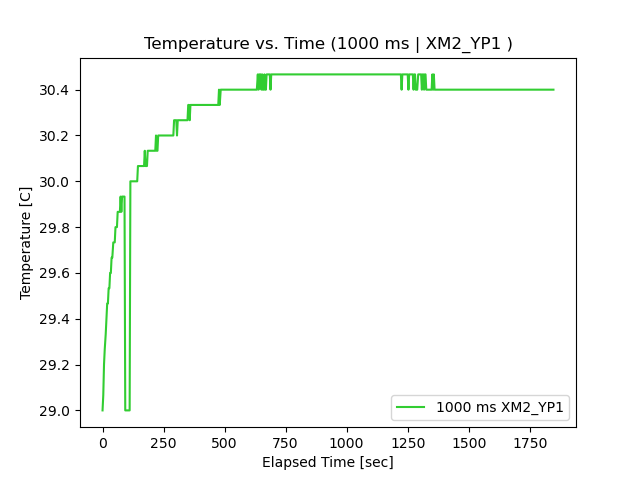

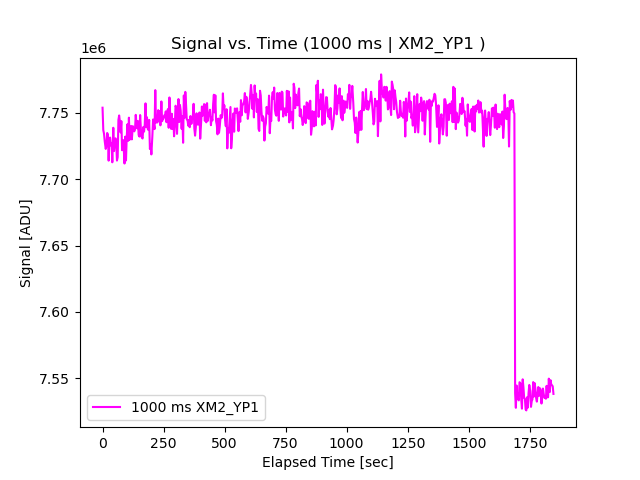

In [108]:
#load in XM2_Y0
SetName = 'XM2_YP1'
FolderName = '\YP1_XM2/'

datadirectoryOpen = 'Image_Folders' + FolderName
filepatternOpen = '*.FTS'
ImageFileNameList = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList = MakeImagesList(ImageFileNameList,1)

#Making Time and Date Arrays for Centered Open Shutter Data (x0 y0 turns)
Times, Temps, Signals, Files = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times.argsort()
Times = Times[idx]
Temps = Temps[idx]
Signals = Signals[idx]
Files = Files[idx]

ElapsedTimes = Times - np.amin(Times)
ElapsedTimes = ElapsedTimes*86400 #now in seconds

#Plotting 
plt.figure('T v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Temps, color = 'limegreen', label = '1000 ms ' + SetName)
plt.title('Temperature vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Signals, color = 'magenta', label = '1000 ms ' + SetName)
plt.title('Signal vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [109]:
#Defining and moving the two steady state sets
#Manually input the corresponding Elapsed Times
SteadyStateStart = 486
DataFramesEnd = 1672 #to give 15 seconds to drop off at 1687
DarkFramesStart = 1693 # 3 seconds after end of drop

#Making a list of Steady State Data Frame files
FileNameList_ssBeam = ListFilesBetweenElapsedTime(SteadyStateStart,DataFramesEnd,Times,Files)

#Making a list of Steady State Dark Frame files
FileNameList_ssDarks = ListFilesAfterElapsedTime(DarkFramesStart,Times,Files)

#Moving these files to new folders
DestStr = 'SteadyStateDataSets/' + SetName + '/'

destinationBeam = DestStr + 'BeamImages/'
for source in FileNameList_ssBeam:
    shutil.copy(source,destinationBeam)
    
destinationDarks = DestStr + 'CS_Darks/'
for source in FileNameList_ssDarks:
    shutil.copy(source,destinationDarks)

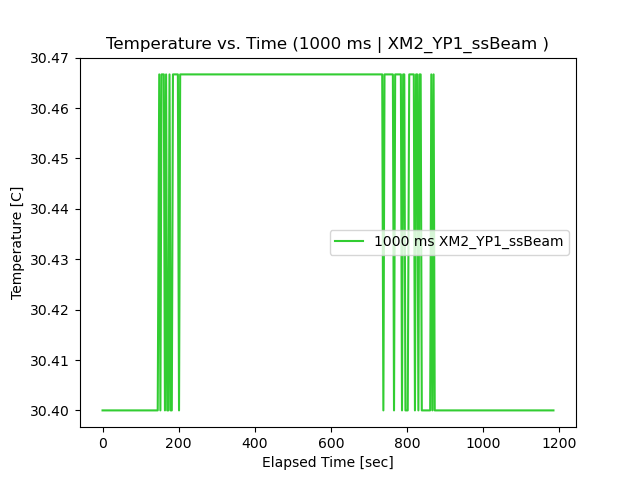

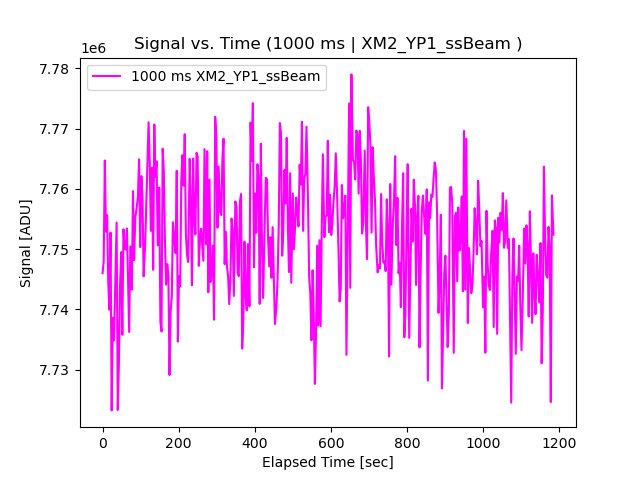

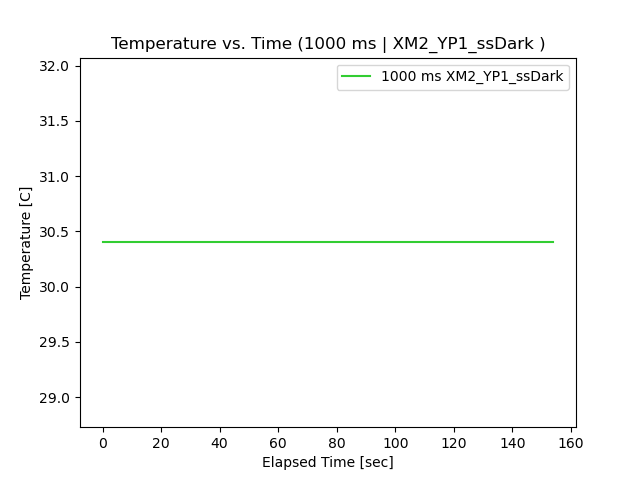

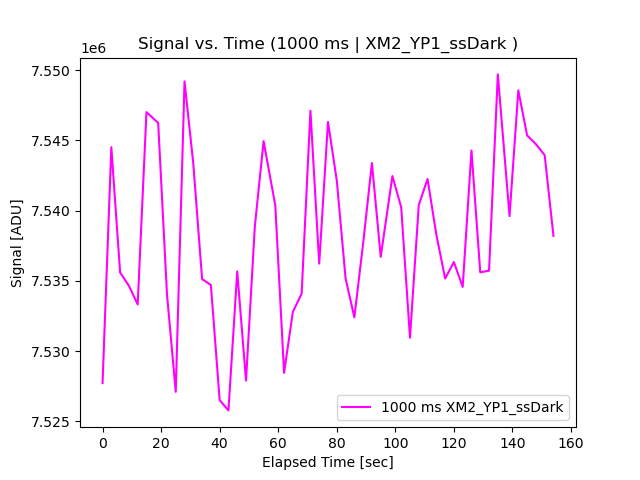


Data Set: (-2,1) Steady State Beam Images
Time Start: 2022-12-01T10:35:46.000 (UTC)
Time Stop: 2022-12-01T10:55:31.000 (UTC)
Elapsed Time: 19 min 45.0 sec
Exposure Time: 999.991 ms
Number of Frames: 385
Min Sensor Temperature: 30.4
Max Sensor Temperature: 30.47
Median Sensor Temperature: 30.47
Mean Sensor Temperature: 30.44
Standard Deviation of Sensor Temperature: 0.03


Data Set: (-2,1) Steady State Closed Shutter Dark Frames
Time Start: 2022-12-01T10:55:52.000 (UTC)
Time Stop: 2022-12-01T10:58:26.000 (UTC)
Elapsed Time: 2 min 34.0 sec
Exposure Time: 999.991 ms
Number of Frames: 51
Min Sensor Temperature: 30.4
Max Sensor Temperature: 30.4
Median Sensor Temperature: 30.4
Mean Sensor Temperature: 30.4
Standard Deviation of Sensor Temperature: 0.0


In [110]:
#Loading in the new Steady State files

datadirectoryOpen = DestStr + 'BeamImages/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssBeam = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssBeam = MakeImagesList(ImageFileNameList_ssBeam,1)

datadirectoryOpen = DestStr + 'CS_Darks/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssDarks = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssDarks = MakeImagesList(ImageFileNameList_ssDarks,1)

#Making Time and Date Arrays for Steady State Beam Images 
ImagesList = ImagesList_ssBeam
Times_ssBeam, Temps_ssBeam, Signals_ssBeam, Files_ssBeam = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssBeam.argsort()
Times_ssBeam = Times_ssBeam[idx]
Temps_ssBeam = Temps_ssBeam[idx]
Signals_ssBeam = Signals_ssBeam[idx]
Files_ssBeam = Files_ssBeam[idx]

ElapsedTimes_ssBeam = GetElapsedTimeArray(Times_ssBeam)

#Making Time and Date Arrays forSteady State Dark Frames 
ImagesList = ImagesList_ssDarks
Times_ssDarks, Temps_ssDarks, Signals_ssDarks, Files_ssDarks = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssDarks.argsort()
Times_ssDarks = Times_ssDarks[idx]
Temps_ssDarks = Temps_ssDarks[idx]
Signals_ssDarks = Signals_ssDarks[idx]
Files_ssDarks = Files_ssDarks[idx]

ElapsedTimes_ssDarks = GetElapsedTimeArray(Times_ssDarks)

#Plotting 
SetName1 = SetName + "_ssBeam"

plt.figure('T v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Temps_ssBeam, color = 'limegreen', label = '1000 ms ' + SetName1)
plt.title('Temperature vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Signals_ssBeam, color = 'magenta', label = '1000 ms ' + SetName1)
plt.title('Signal vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

SetName2 = SetName + "_ssDark"

plt.figure('T v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Temps_ssDarks, color = 'limegreen', label = '1000 ms ' + SetName2)
plt.title('Temperature vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Signals_ssDarks, color = 'magenta', label = '1000 ms ' + SetName2)
plt.title('Signal vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()



#Getting printing information about the steady state data set for printing and attaching.
DataSetName = "(-2,1) Steady State Beam Images"
ImagesList = ImagesList_ssBeam

PrintDataSetInfo(DataSetName,ImagesList)

print("")

DataSetName = "(-2,1) Steady State Closed Shutter Dark Frames"
ImagesList = ImagesList_ssDarks

PrintDataSetInfo(DataSetName,ImagesList)

***
### (-2,-1)

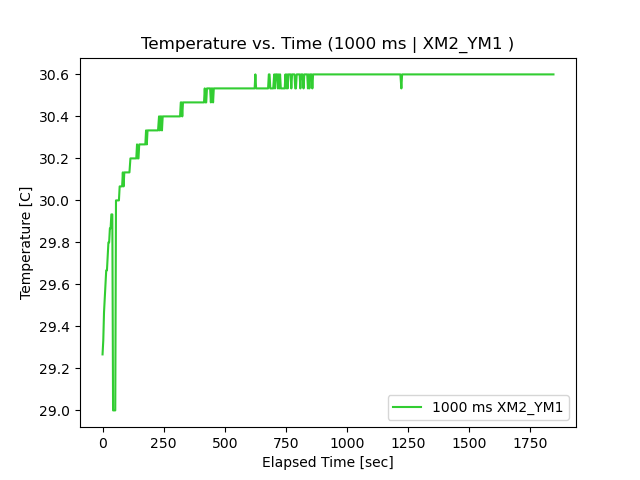

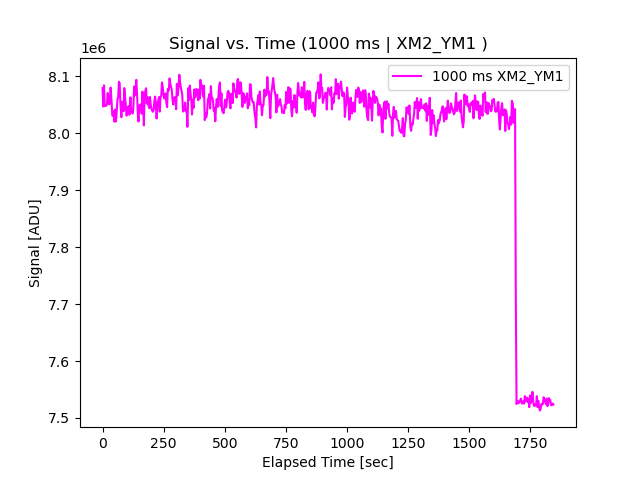

In [111]:
#load in XM2_YM1
SetName = 'XM2_YM1'
FolderName = '\YM1_XM2/'

datadirectoryOpen = 'Image_Folders' + FolderName
filepatternOpen = '*.FTS'
ImageFileNameList = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList = MakeImagesList(ImageFileNameList,1)

#Making Time and Date Arrays for Centered Open Shutter Data (x0 y0 turns)
Times, Temps, Signals, Files = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times.argsort()
Times = Times[idx]
Temps = Temps[idx]
Signals = Signals[idx]
Files = Files[idx]

ElapsedTimes = Times - np.amin(Times)
ElapsedTimes = ElapsedTimes*86400 #now in seconds

#Plotting 
plt.figure('T v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Temps, color = 'limegreen', label = '1000 ms ' + SetName)
plt.title('Temperature vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Signals, color = 'magenta', label = '1000 ms ' + SetName)
plt.title('Signal vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [112]:
#Defining and moving the two steady state sets
#Manually input the corresponding Elapsed Times
SteadyStateStart = 456
DataFramesEnd = 1672 #to give 15 seconds to drop off at 1687
DarkFramesStart = 1696 # 3 seconds after end of drop

#Making a list of Steady State Data Frame files
FileNameList_ssBeam = ListFilesBetweenElapsedTime(SteadyStateStart,DataFramesEnd,Times,Files)

#Making a list of Steady State Dark Frame files
FileNameList_ssDarks = ListFilesAfterElapsedTime(DarkFramesStart,Times,Files)

#Moving these files to new folders
DestStr = 'SteadyStateDataSets/' + SetName + '/'

destinationBeam = DestStr + 'BeamImages/'
for source in FileNameList_ssBeam:
    shutil.copy(source,destinationBeam)
    
destinationDarks = DestStr + 'CS_Darks/'
for source in FileNameList_ssDarks:
    shutil.copy(source,destinationDarks)

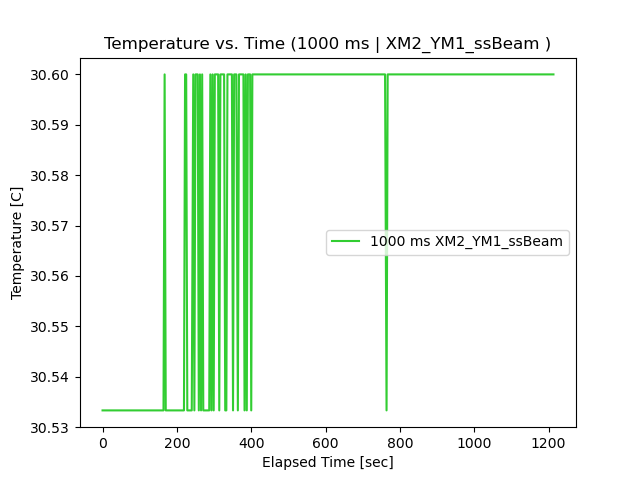

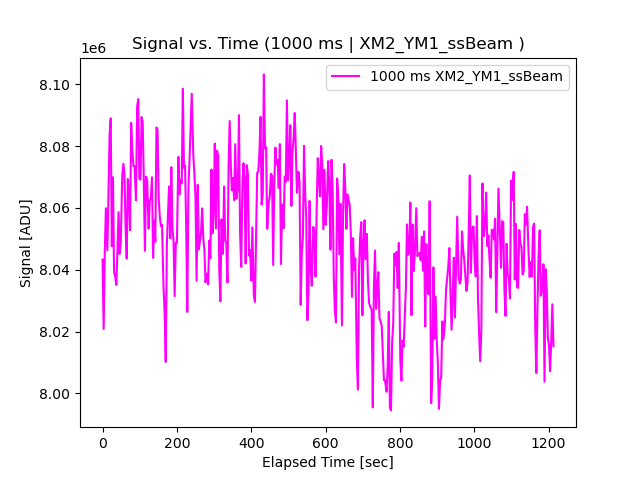

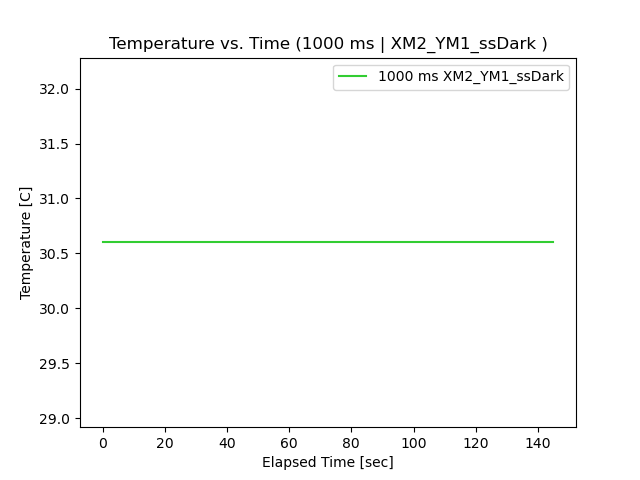

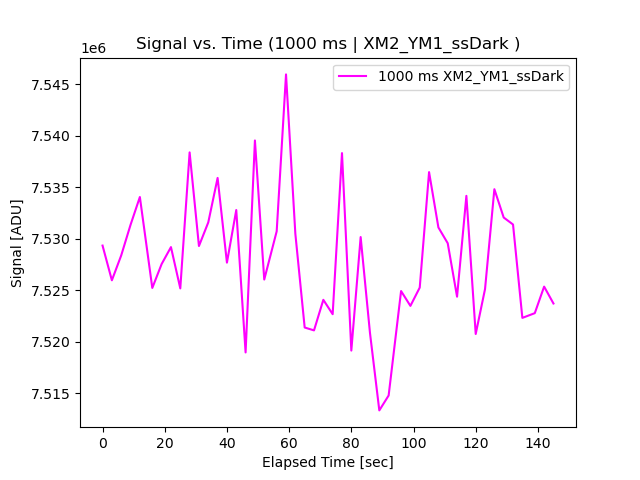


Data Set: (-2,-1) Steady State Beam Images
Time Start: 2022-12-01T09:56:04.000 (UTC)
Time Stop: 2022-12-01T10:16:17.000 (UTC)
Elapsed Time: 20 min 13.0 sec
Exposure Time: 999.991 ms
Number of Frames: 395
Min Sensor Temperature: 30.53
Max Sensor Temperature: 30.6
Median Sensor Temperature: 30.6
Mean Sensor Temperature: 30.58
Standard Deviation of Sensor Temperature: 0.03


Data Set: (-2,-1) Steady State Closed Shutter Dark Frames
Time Start: 2022-12-01T10:16:45.000 (UTC)
Time Stop: 2022-12-01T10:19:10.000 (UTC)
Elapsed Time: 2 min 25.0 sec
Exposure Time: 999.991 ms
Number of Frames: 48
Min Sensor Temperature: 30.6
Max Sensor Temperature: 30.6
Median Sensor Temperature: 30.6
Mean Sensor Temperature: 30.6
Standard Deviation of Sensor Temperature: 0.0


In [114]:
#Loading in the new Steady State files

datadirectoryOpen = DestStr + 'BeamImages/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssBeam = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssBeam = MakeImagesList(ImageFileNameList_ssBeam,1)

datadirectoryOpen = DestStr + 'CS_Darks/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssDarks = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssDarks = MakeImagesList(ImageFileNameList_ssDarks,1)

#Making Time and Date Arrays for Steady State Beam Images 
ImagesList = ImagesList_ssBeam
Times_ssBeam, Temps_ssBeam, Signals_ssBeam, Files_ssBeam = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssBeam.argsort()
Times_ssBeam = Times_ssBeam[idx]
Temps_ssBeam = Temps_ssBeam[idx]
Signals_ssBeam = Signals_ssBeam[idx]
Files_ssBeam = Files_ssBeam[idx]

ElapsedTimes_ssBeam = GetElapsedTimeArray(Times_ssBeam)

#Making Time and Date Arrays forSteady State Dark Frames 
ImagesList = ImagesList_ssDarks
Times_ssDarks, Temps_ssDarks, Signals_ssDarks, Files_ssDarks = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssDarks.argsort()
Times_ssDarks = Times_ssDarks[idx]
Temps_ssDarks = Temps_ssDarks[idx]
Signals_ssDarks = Signals_ssDarks[idx]
Files_ssDarks = Files_ssDarks[idx]

ElapsedTimes_ssDarks = GetElapsedTimeArray(Times_ssDarks)

#Plotting 
SetName1 = SetName + "_ssBeam"

plt.figure('T v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Temps_ssBeam, color = 'limegreen', label = '1000 ms ' + SetName1)
plt.title('Temperature vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Signals_ssBeam, color = 'magenta', label = '1000 ms ' + SetName1)
plt.title('Signal vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

SetName2 = SetName + "_ssDark"

plt.figure('T v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Temps_ssDarks, color = 'limegreen', label = '1000 ms ' + SetName2)
plt.title('Temperature vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Signals_ssDarks, color = 'magenta', label = '1000 ms ' + SetName2)
plt.title('Signal vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()



#Getting printing information about the steady state data set for printing and attaching.
DataSetName = "(-2,-1) Steady State Beam Images"
ImagesList = ImagesList_ssBeam

PrintDataSetInfo(DataSetName,ImagesList)

print("")

DataSetName = "(-2,-1) Steady State Closed Shutter Dark Frames"
ImagesList = ImagesList_ssDarks

PrintDataSetInfo(DataSetName,ImagesList)

***
### (4,0)

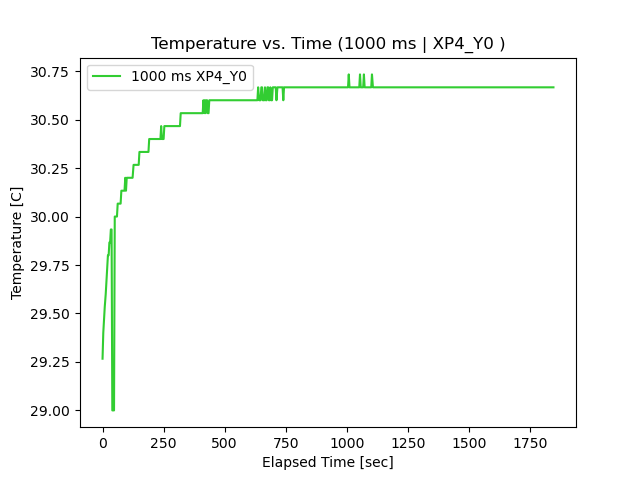

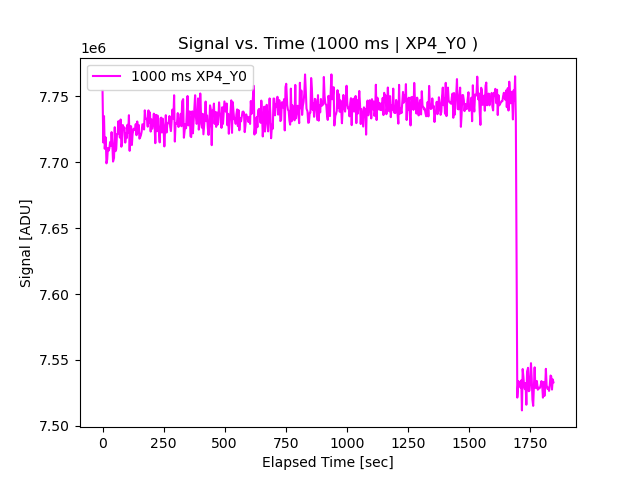

In [115]:
#load in XP4_Y0
SetName = 'XP4_Y0'
FolderName = '\Y0_XP4/'

datadirectoryOpen = 'Image_Folders' + FolderName
filepatternOpen = '*.FTS'
ImageFileNameList = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList = MakeImagesList(ImageFileNameList,1)

#Making Time and Date Arrays for Centered Open Shutter Data (x0 y0 turns)
Times, Temps, Signals, Files = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times.argsort()
Times = Times[idx]
Temps = Temps[idx]
Signals = Signals[idx]
Files = Files[idx]

ElapsedTimes = Times - np.amin(Times)
ElapsedTimes = ElapsedTimes*86400 #now in seconds

#Plotting 
plt.figure('T v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Temps, color = 'limegreen', label = '1000 ms ' + SetName)
plt.title('Temperature vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Signals, color = 'magenta', label = '1000 ms ' + SetName)
plt.title('Signal vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [117]:
#Defining and moving the two steady state sets
#Manually input the corresponding Elapsed Times
SteadyStateStart = 445
DataFramesEnd = 1674 #to give 15 seconds to drop off at 1687
DarkFramesStart = 1701 # 3 seconds after end of drop

#Making a list of Steady State Data Frame files
FileNameList_ssBeam = ListFilesBetweenElapsedTime(SteadyStateStart,DataFramesEnd,Times,Files)

#Making a list of Steady State Dark Frame files
FileNameList_ssDarks = ListFilesAfterElapsedTime(DarkFramesStart,Times,Files)

#Moving these files to new folders
DestStr = 'SteadyStateDataSets/' + SetName + '/'

destinationBeam = DestStr + 'BeamImages/'
for source in FileNameList_ssBeam:
    shutil.copy(source,destinationBeam)
    
destinationDarks = DestStr + 'CS_Darks/'
for source in FileNameList_ssDarks:
    shutil.copy(source,destinationDarks)

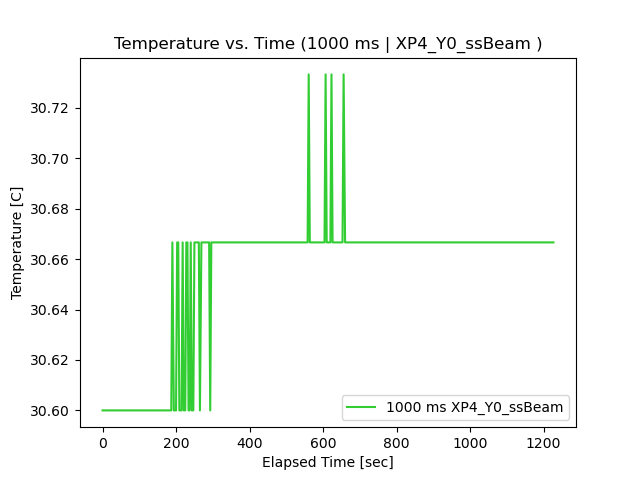

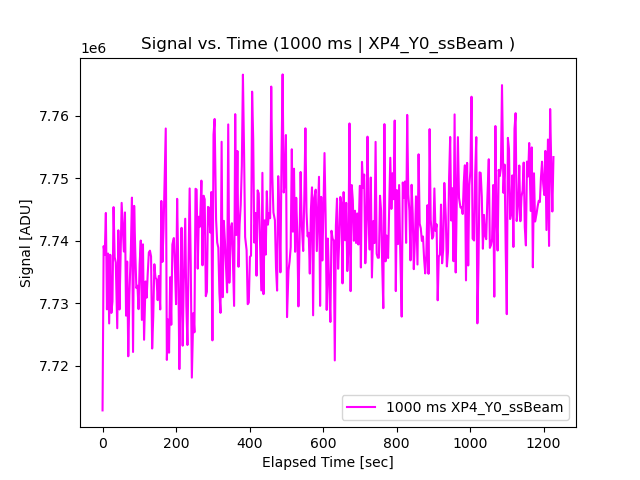

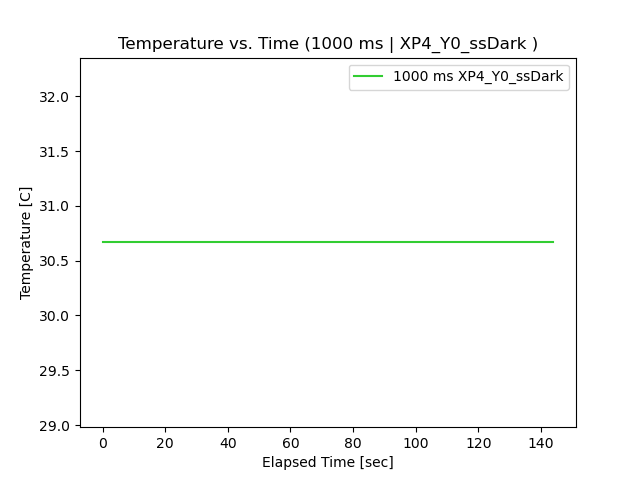

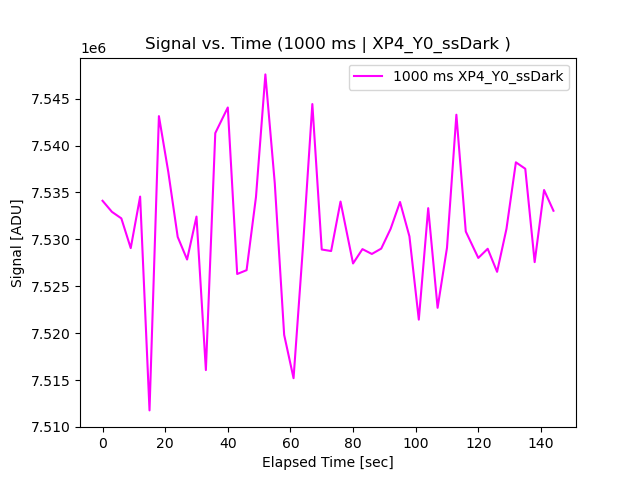


Data Set: (4,0) Steady State Beam Images
Time Start: 2022-12-01T08:10:58.000 (UTC)
Time Stop: 2022-12-01T08:31:25.000 (UTC)
Elapsed Time: 20 min 27.0 sec
Exposure Time: 999.991 ms
Number of Frames: 399
Min Sensor Temperature: 30.6
Max Sensor Temperature: 30.73
Median Sensor Temperature: 30.67
Mean Sensor Temperature: 30.65
Standard Deviation of Sensor Temperature: 0.03


Data Set: (4,0) Steady State Closed Shutter Dark Frames
Time Start: 2022-12-01T08:31:53.000 (UTC)
Time Stop: 2022-12-01T08:34:17.000 (UTC)
Elapsed Time: 2 min 24.0 sec
Exposure Time: 999.991 ms
Number of Frames: 48
Min Sensor Temperature: 30.67
Max Sensor Temperature: 30.67
Median Sensor Temperature: 30.67
Mean Sensor Temperature: 30.67
Standard Deviation of Sensor Temperature: 0.0


In [118]:
#Loading in the new Steady State files

datadirectoryOpen = DestStr + 'BeamImages/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssBeam = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssBeam = MakeImagesList(ImageFileNameList_ssBeam,1)

datadirectoryOpen = DestStr + 'CS_Darks/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssDarks = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssDarks = MakeImagesList(ImageFileNameList_ssDarks,1)

#Making Time and Date Arrays for Steady State Beam Images 
ImagesList = ImagesList_ssBeam
Times_ssBeam, Temps_ssBeam, Signals_ssBeam, Files_ssBeam = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssBeam.argsort()
Times_ssBeam = Times_ssBeam[idx]
Temps_ssBeam = Temps_ssBeam[idx]
Signals_ssBeam = Signals_ssBeam[idx]
Files_ssBeam = Files_ssBeam[idx]

ElapsedTimes_ssBeam = GetElapsedTimeArray(Times_ssBeam)

#Making Time and Date Arrays forSteady State Dark Frames 
ImagesList = ImagesList_ssDarks
Times_ssDarks, Temps_ssDarks, Signals_ssDarks, Files_ssDarks = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssDarks.argsort()
Times_ssDarks = Times_ssDarks[idx]
Temps_ssDarks = Temps_ssDarks[idx]
Signals_ssDarks = Signals_ssDarks[idx]
Files_ssDarks = Files_ssDarks[idx]

ElapsedTimes_ssDarks = GetElapsedTimeArray(Times_ssDarks)

#Plotting 
SetName1 = SetName + "_ssBeam"

plt.figure('T v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Temps_ssBeam, color = 'limegreen', label = '1000 ms ' + SetName1)
plt.title('Temperature vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Signals_ssBeam, color = 'magenta', label = '1000 ms ' + SetName1)
plt.title('Signal vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

SetName2 = SetName + "_ssDark"

plt.figure('T v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Temps_ssDarks, color = 'limegreen', label = '1000 ms ' + SetName2)
plt.title('Temperature vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Signals_ssDarks, color = 'magenta', label = '1000 ms ' + SetName2)
plt.title('Signal vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()



#Getting printing information about the steady state data set for printing and attaching.
DataSetName = "(4,0) Steady State Beam Images"
ImagesList = ImagesList_ssBeam

PrintDataSetInfo(DataSetName,ImagesList)

print("")

DataSetName = "(4,0) Steady State Closed Shutter Dark Frames"
ImagesList = ImagesList_ssDarks

PrintDataSetInfo(DataSetName,ImagesList)

***
### (0,3)

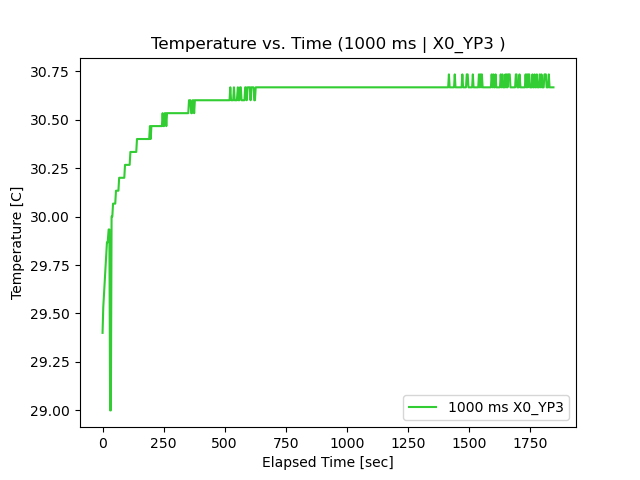

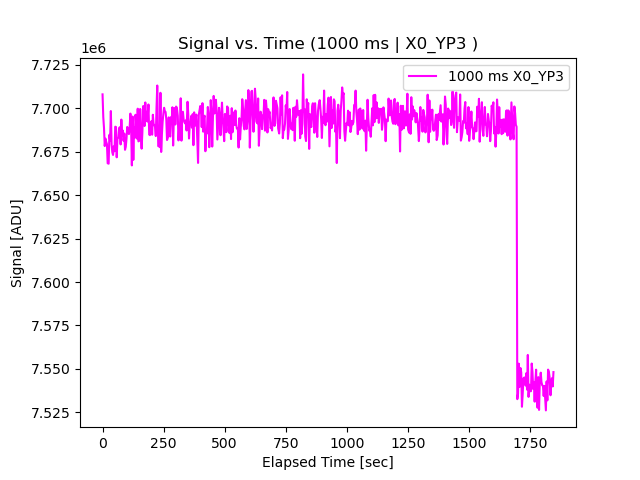

In [124]:
#load in X0_YP3
SetName = 'X0_YP3'
FolderName = '\YP3_X0/'

datadirectoryOpen = 'Image_Folders' + FolderName
filepatternOpen = '*.FTS'
ImageFileNameList = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList = MakeImagesList(ImageFileNameList,1)

#Making Time and Date Arrays for Centered Open Shutter Data (x0 y0 turns)
Times, Temps, Signals, Files = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times.argsort()
Times = Times[idx]
Temps = Temps[idx]
Signals = Signals[idx]
Files = Files[idx]

ElapsedTimes = Times - np.amin(Times)
ElapsedTimes = ElapsedTimes*86400 #now in seconds

#Plotting 
plt.figure('T v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Temps, color = 'limegreen', label = '1000 ms ' + SetName)
plt.title('Temperature vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Signals, color = 'magenta', label = '1000 ms ' + SetName)
plt.title('Signal vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [121]:
#Defining and moving the two steady state sets
#Manually input the corresponding Elapsed Times
SteadyStateStart = 569
DataFramesEnd = 1677 #to give 15 seconds to drop off at 1687
DarkFramesStart = 1698 # 3 seconds after end of drop

#Making a list of Steady State Data Frame files
FileNameList_ssBeam = ListFilesBetweenElapsedTime(SteadyStateStart,DataFramesEnd,Times,Files)

#Making a list of Steady State Dark Frame files
FileNameList_ssDarks = ListFilesAfterElapsedTime(DarkFramesStart,Times,Files)

#Moving these files to new folders
DestStr = 'SteadyStateDataSets/' + SetName + '/'

destinationBeam = DestStr + 'BeamImages/'
for source in FileNameList_ssBeam:
    shutil.copy(source,destinationBeam)
    
destinationDarks = DestStr + 'CS_Darks/'
for source in FileNameList_ssDarks:
    shutil.copy(source,destinationDarks)

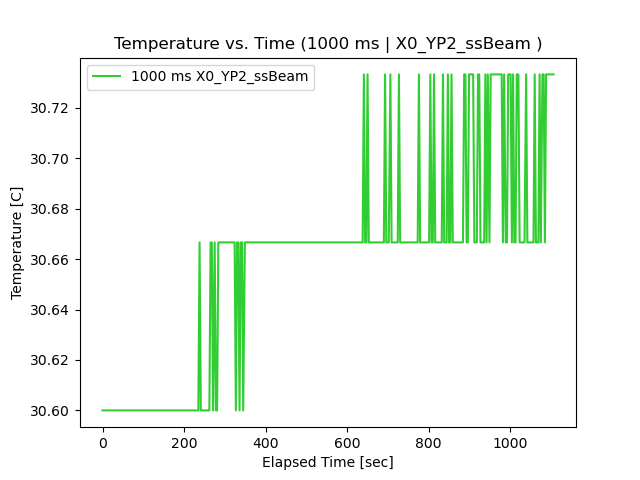

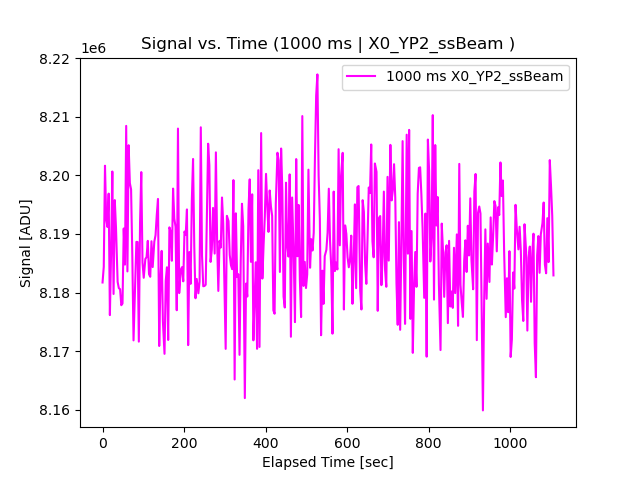

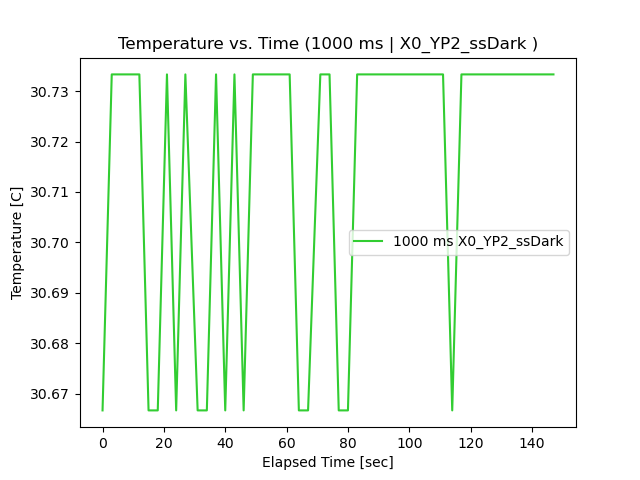

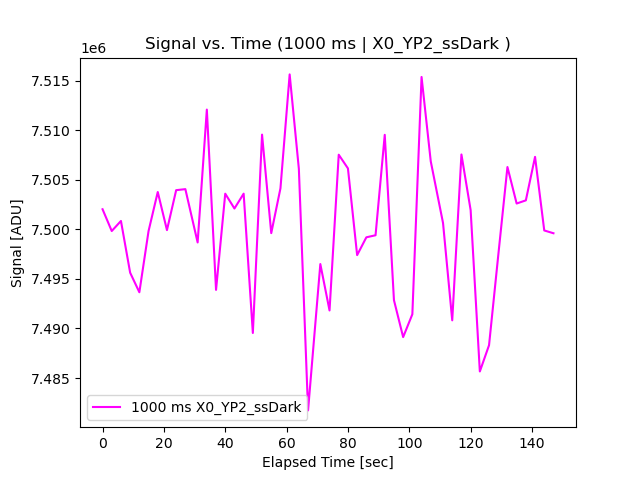


Data Set: (0,2) Steady State Beam Images
Time Start: 2022-12-01T07:01:48.000 (UTC)
Time Stop: 2022-12-01T07:20:14.000 (UTC)
Elapsed Time: 18 min 26.0 sec
Exposure Time: 999.991 ms
Number of Frames: 360
Min Sensor Temperature: 30.6
Max Sensor Temperature: 30.73
Median Sensor Temperature: 30.67
Mean Sensor Temperature: 30.66
Standard Deviation of Sensor Temperature: 0.04


Data Set: (0,2) Steady State Closed Shutter Dark Frames
Time Start: 2022-12-01T07:20:36.000 (UTC)
Time Stop: 2022-12-01T07:23:03.000 (UTC)
Elapsed Time: 2 min 27.0 sec
Exposure Time: 999.991 ms
Number of Frames: 49
Min Sensor Temperature: 30.67
Max Sensor Temperature: 30.73
Median Sensor Temperature: 30.73
Mean Sensor Temperature: 30.72
Standard Deviation of Sensor Temperature: 0.03


In [123]:
#Loading in the new Steady State files

datadirectoryOpen = DestStr + 'BeamImages/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssBeam = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssBeam = MakeImagesList(ImageFileNameList_ssBeam,1)

datadirectoryOpen = DestStr + 'CS_Darks/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssDarks = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssDarks = MakeImagesList(ImageFileNameList_ssDarks,1)

#Making Time and Date Arrays for Steady State Beam Images 
ImagesList = ImagesList_ssBeam
Times_ssBeam, Temps_ssBeam, Signals_ssBeam, Files_ssBeam = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssBeam.argsort()
Times_ssBeam = Times_ssBeam[idx]
Temps_ssBeam = Temps_ssBeam[idx]
Signals_ssBeam = Signals_ssBeam[idx]
Files_ssBeam = Files_ssBeam[idx]

ElapsedTimes_ssBeam = GetElapsedTimeArray(Times_ssBeam)

#Making Time and Date Arrays forSteady State Dark Frames 
ImagesList = ImagesList_ssDarks
Times_ssDarks, Temps_ssDarks, Signals_ssDarks, Files_ssDarks = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssDarks.argsort()
Times_ssDarks = Times_ssDarks[idx]
Temps_ssDarks = Temps_ssDarks[idx]
Signals_ssDarks = Signals_ssDarks[idx]
Files_ssDarks = Files_ssDarks[idx]

ElapsedTimes_ssDarks = GetElapsedTimeArray(Times_ssDarks)

#Plotting 
SetName1 = SetName + "_ssBeam"

plt.figure('T v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Temps_ssBeam, color = 'limegreen', label = '1000 ms ' + SetName1)
plt.title('Temperature vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Signals_ssBeam, color = 'magenta', label = '1000 ms ' + SetName1)
plt.title('Signal vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

SetName2 = SetName + "_ssDark"

plt.figure('T v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Temps_ssDarks, color = 'limegreen', label = '1000 ms ' + SetName2)
plt.title('Temperature vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Signals_ssDarks, color = 'magenta', label = '1000 ms ' + SetName2)
plt.title('Signal vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()



#Getting printing information about the steady state data set for printing and attaching.
DataSetName = "(0,2) Steady State Beam Images"
ImagesList = ImagesList_ssBeam

PrintDataSetInfo(DataSetName,ImagesList)

print("")

DataSetName = "(0,2) Steady State Closed Shutter Dark Frames"
ImagesList = ImagesList_ssDarks

PrintDataSetInfo(DataSetName,ImagesList)

***
### (0,2)

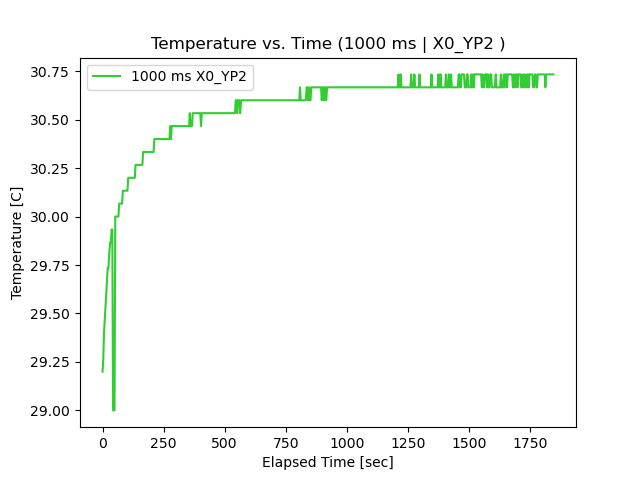

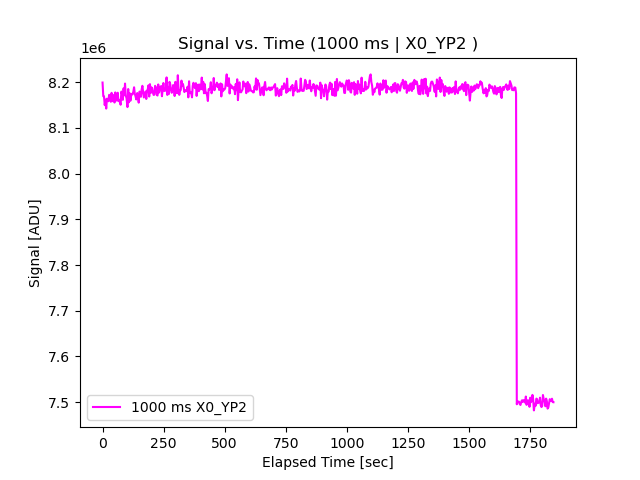

In [119]:
#load in X0_YP2
SetName = 'X0_YP2'
FolderName = '\YP2_X0/'

datadirectoryOpen = 'Image_Folders' + FolderName
filepatternOpen = '*.FTS'
ImageFileNameList = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList = MakeImagesList(ImageFileNameList,1)

#Making Time and Date Arrays for Centered Open Shutter Data (x0 y0 turns)
Times, Temps, Signals, Files = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times.argsort()
Times = Times[idx]
Temps = Temps[idx]
Signals = Signals[idx]
Files = Files[idx]

ElapsedTimes = Times - np.amin(Times)
ElapsedTimes = ElapsedTimes*86400 #now in seconds

#Plotting 
plt.figure('T v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Temps, color = 'limegreen', label = '1000 ms ' + SetName)
plt.title('Temperature vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Signals, color = 'magenta', label = '1000 ms ' + SetName)
plt.title('Signal vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [125]:
#Defining and moving the two steady state sets
#Manually input the corresponding Elapsed Times
SteadyStateStart = 569
DataFramesEnd = 1677 #to give 15 seconds to drop off at 1687
DarkFramesStart = 1698 # 3 seconds after end of drop

#Making a list of Steady State Data Frame files
FileNameList_ssBeam = ListFilesBetweenElapsedTime(SteadyStateStart,DataFramesEnd,Times,Files)

#Making a list of Steady State Dark Frame files
FileNameList_ssDarks = ListFilesAfterElapsedTime(DarkFramesStart,Times,Files)

#Moving these files to new folders
DestStr = 'SteadyStateDataSets/' + SetName + '/'

destinationBeam = DestStr + 'BeamImages/'
for source in FileNameList_ssBeam:
    shutil.copy(source,destinationBeam)
    
destinationDarks = DestStr + 'CS_Darks/'
for source in FileNameList_ssDarks:
    shutil.copy(source,destinationDarks)

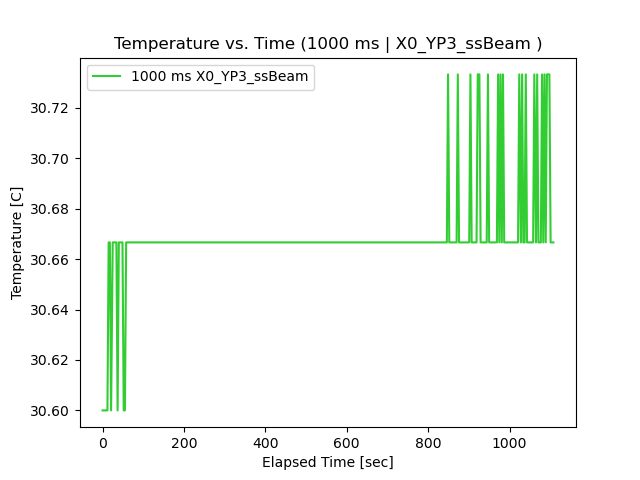

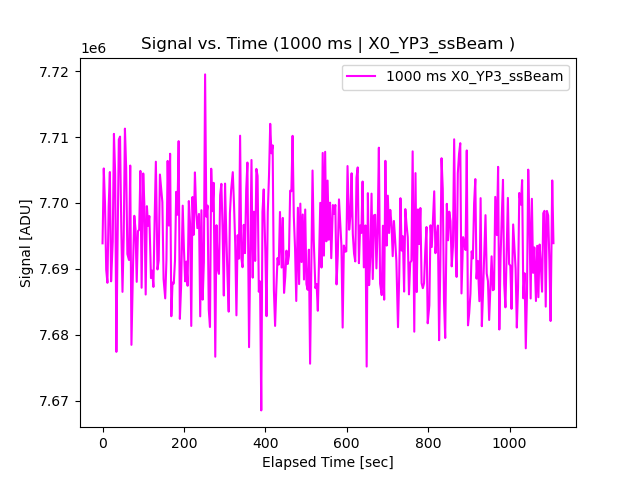

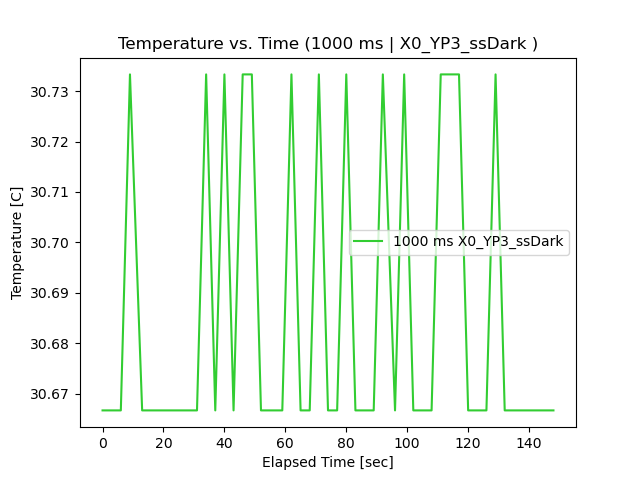

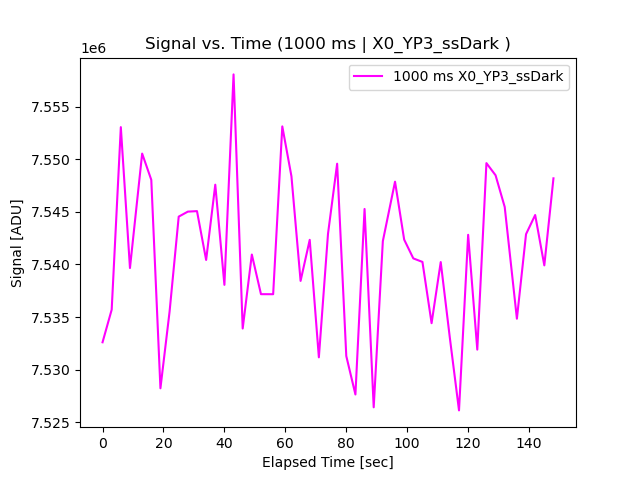


Data Set: (0,3) Steady State Beam Images
Time Start: 2022-12-01T07:36:38.000 (UTC)
Time Stop: 2022-12-01T07:55:06.000 (UTC)
Elapsed Time: 18 min 28.0 sec
Exposure Time: 999.991 ms
Number of Frames: 360
Min Sensor Temperature: 30.6
Max Sensor Temperature: 30.73
Median Sensor Temperature: 30.67
Mean Sensor Temperature: 30.67
Standard Deviation of Sensor Temperature: 0.02


Data Set: (0,3) Steady State Closed Shutter Dark Frames
Time Start: 2022-12-01T07:55:27.000 (UTC)
Time Stop: 2022-12-01T07:57:55.000 (UTC)
Elapsed Time: 2 min 28.0 sec
Exposure Time: 999.991 ms
Number of Frames: 49
Min Sensor Temperature: 30.67
Max Sensor Temperature: 30.73
Median Sensor Temperature: 30.67
Mean Sensor Temperature: 30.69
Standard Deviation of Sensor Temperature: 0.03


In [126]:
#Loading in the new Steady State files

datadirectoryOpen = DestStr + 'BeamImages/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssBeam = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssBeam = MakeImagesList(ImageFileNameList_ssBeam,1)

datadirectoryOpen = DestStr + 'CS_Darks/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssDarks = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssDarks = MakeImagesList(ImageFileNameList_ssDarks,1)

#Making Time and Date Arrays for Steady State Beam Images 
ImagesList = ImagesList_ssBeam
Times_ssBeam, Temps_ssBeam, Signals_ssBeam, Files_ssBeam = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssBeam.argsort()
Times_ssBeam = Times_ssBeam[idx]
Temps_ssBeam = Temps_ssBeam[idx]
Signals_ssBeam = Signals_ssBeam[idx]
Files_ssBeam = Files_ssBeam[idx]

ElapsedTimes_ssBeam = GetElapsedTimeArray(Times_ssBeam)

#Making Time and Date Arrays forSteady State Dark Frames 
ImagesList = ImagesList_ssDarks
Times_ssDarks, Temps_ssDarks, Signals_ssDarks, Files_ssDarks = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssDarks.argsort()
Times_ssDarks = Times_ssDarks[idx]
Temps_ssDarks = Temps_ssDarks[idx]
Signals_ssDarks = Signals_ssDarks[idx]
Files_ssDarks = Files_ssDarks[idx]

ElapsedTimes_ssDarks = GetElapsedTimeArray(Times_ssDarks)

#Plotting 
SetName1 = SetName + "_ssBeam"

plt.figure('T v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Temps_ssBeam, color = 'limegreen', label = '1000 ms ' + SetName1)
plt.title('Temperature vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Signals_ssBeam, color = 'magenta', label = '1000 ms ' + SetName1)
plt.title('Signal vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

SetName2 = SetName + "_ssDark"

plt.figure('T v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Temps_ssDarks, color = 'limegreen', label = '1000 ms ' + SetName2)
plt.title('Temperature vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Signals_ssDarks, color = 'magenta', label = '1000 ms ' + SetName2)
plt.title('Signal vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()



#Getting printing information about the steady state data set for printing and attaching.
DataSetName = "(0,3) Steady State Beam Images"
ImagesList = ImagesList_ssBeam

PrintDataSetInfo(DataSetName,ImagesList)

print("")

DataSetName = "(0,3) Steady State Closed Shutter Dark Frames"
ImagesList = ImagesList_ssDarks

PrintDataSetInfo(DataSetName,ImagesList)

***
### (0,-2)

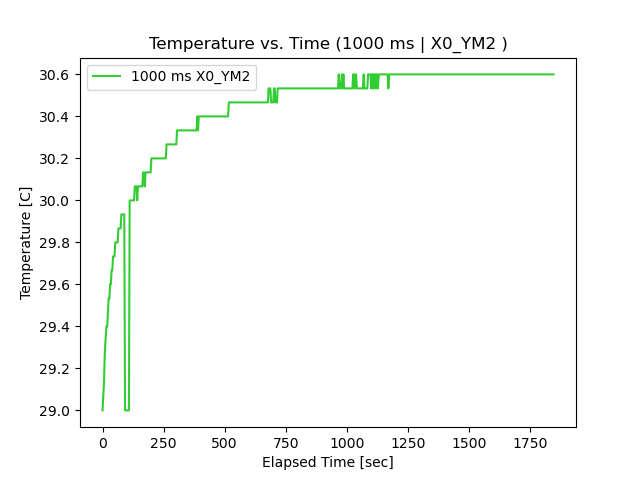

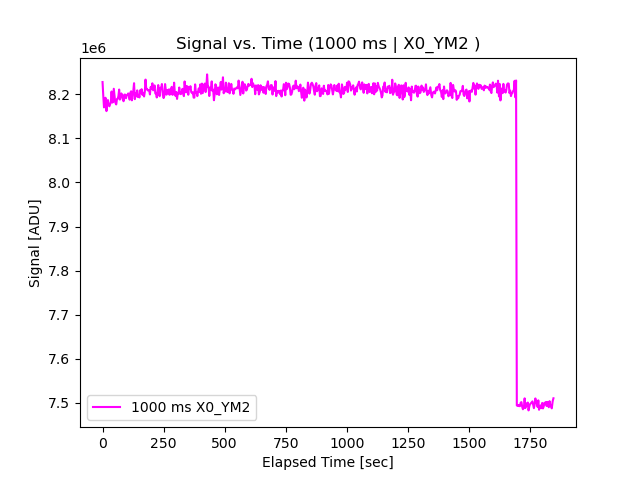

In [127]:
#load in X0_YM2
SetName = 'X0_YM2'
FolderName = '\YM2_X0/'

datadirectoryOpen = 'Image_Folders' + FolderName
filepatternOpen = '*.FTS'
ImageFileNameList = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList = MakeImagesList(ImageFileNameList,1)

#Making Time and Date Arrays for Centered Open Shutter Data (x0 y0 turns)
Times, Temps, Signals, Files = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times.argsort()
Times = Times[idx]
Temps = Temps[idx]
Signals = Signals[idx]
Files = Files[idx]

ElapsedTimes = Times - np.amin(Times)
ElapsedTimes = ElapsedTimes*86400 #now in seconds

#Plotting 
plt.figure('T v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Temps, color = 'limegreen', label = '1000 ms ' + SetName)
plt.title('Temperature vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Signals, color = 'magenta', label = '1000 ms ' + SetName)
plt.title('Signal vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [128]:
#Defining and moving the two steady state sets
#Manually input the corresponding Elapsed Times
SteadyStateStart = 719
DataFramesEnd = 1678 #to give 15 seconds to drop off at 1687
DarkFramesStart = 1699 # 3 seconds after end of drop

#Making a list of Steady State Data Frame files
FileNameList_ssBeam = ListFilesBetweenElapsedTime(SteadyStateStart,DataFramesEnd,Times,Files)

#Making a list of Steady State Dark Frame files
FileNameList_ssDarks = ListFilesAfterElapsedTime(DarkFramesStart,Times,Files)

#Moving these files to new folders
DestStr = 'SteadyStateDataSets/' + SetName + '/'

destinationBeam = DestStr + 'BeamImages/'
for source in FileNameList_ssBeam:
    shutil.copy(source,destinationBeam)
    
destinationDarks = DestStr + 'CS_Darks/'
for source in FileNameList_ssDarks:
    shutil.copy(source,destinationDarks)

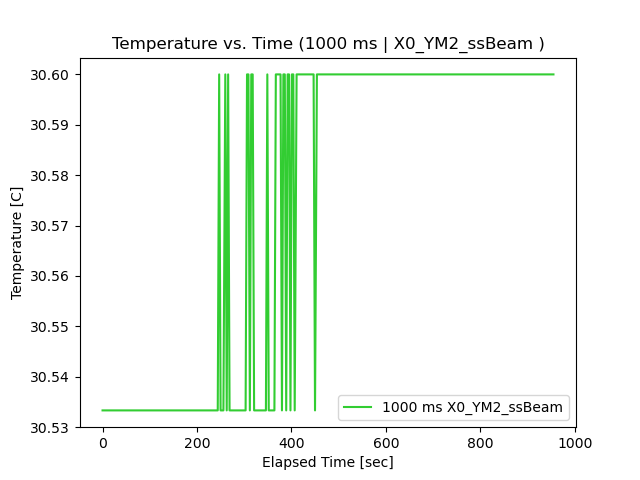

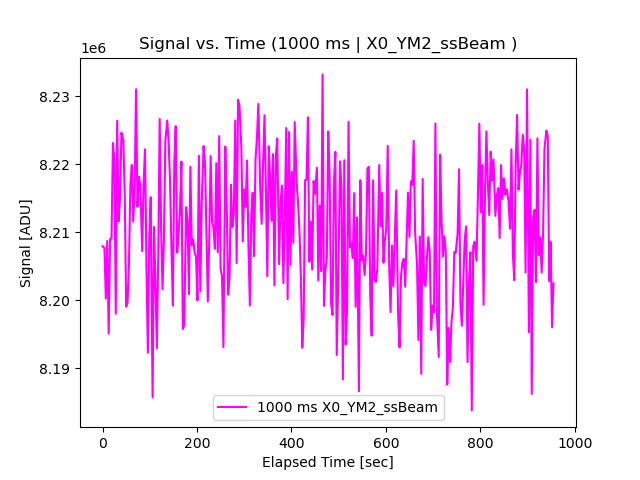

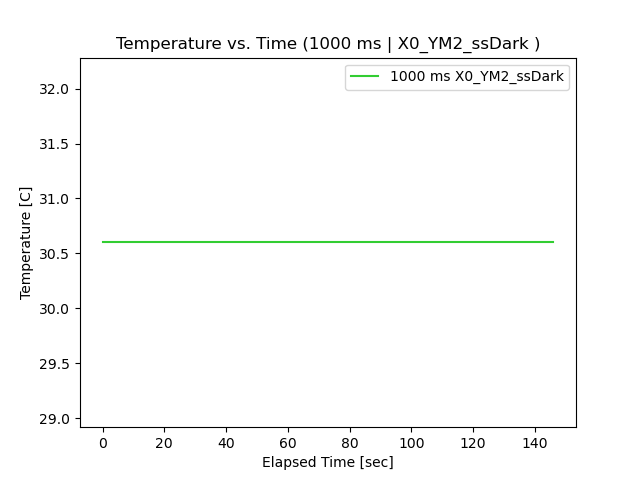

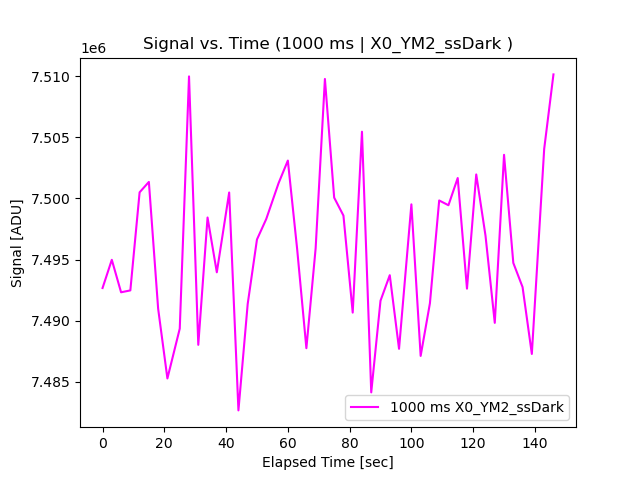


Data Set: (0,-2) Steady State Beam Images
Time Start: 2022-12-01T05:44:22.000 (UTC)
Time Stop: 2022-12-01T06:00:17.000 (UTC)
Elapsed Time: 15 min 55.0 sec
Exposure Time: 999.991 ms
Number of Frames: 311
Min Sensor Temperature: 30.53
Max Sensor Temperature: 30.6
Median Sensor Temperature: 30.6
Mean Sensor Temperature: 30.58
Standard Deviation of Sensor Temperature: 0.03


Data Set: (0,-2) Steady State Closed Shutter Dark Frames
Time Start: 2022-12-01T06:00:42.000 (UTC)
Time Stop: 2022-12-01T06:03:08.000 (UTC)
Elapsed Time: 2 min 26.0 sec
Exposure Time: 999.991 ms
Number of Frames: 48
Min Sensor Temperature: 30.6
Max Sensor Temperature: 30.6
Median Sensor Temperature: 30.6
Mean Sensor Temperature: 30.6
Standard Deviation of Sensor Temperature: 0.0


In [129]:
#Loading in the new Steady State files

datadirectoryOpen = DestStr + 'BeamImages/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssBeam = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssBeam = MakeImagesList(ImageFileNameList_ssBeam,1)

datadirectoryOpen = DestStr + 'CS_Darks/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssDarks = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssDarks = MakeImagesList(ImageFileNameList_ssDarks,1)

#Making Time and Date Arrays for Steady State Beam Images 
ImagesList = ImagesList_ssBeam
Times_ssBeam, Temps_ssBeam, Signals_ssBeam, Files_ssBeam = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssBeam.argsort()
Times_ssBeam = Times_ssBeam[idx]
Temps_ssBeam = Temps_ssBeam[idx]
Signals_ssBeam = Signals_ssBeam[idx]
Files_ssBeam = Files_ssBeam[idx]

ElapsedTimes_ssBeam = GetElapsedTimeArray(Times_ssBeam)

#Making Time and Date Arrays forSteady State Dark Frames 
ImagesList = ImagesList_ssDarks
Times_ssDarks, Temps_ssDarks, Signals_ssDarks, Files_ssDarks = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssDarks.argsort()
Times_ssDarks = Times_ssDarks[idx]
Temps_ssDarks = Temps_ssDarks[idx]
Signals_ssDarks = Signals_ssDarks[idx]
Files_ssDarks = Files_ssDarks[idx]

ElapsedTimes_ssDarks = GetElapsedTimeArray(Times_ssDarks)

#Plotting 
SetName1 = SetName + "_ssBeam"

plt.figure('T v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Temps_ssBeam, color = 'limegreen', label = '1000 ms ' + SetName1)
plt.title('Temperature vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Signals_ssBeam, color = 'magenta', label = '1000 ms ' + SetName1)
plt.title('Signal vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

SetName2 = SetName + "_ssDark"

plt.figure('T v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Temps_ssDarks, color = 'limegreen', label = '1000 ms ' + SetName2)
plt.title('Temperature vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Signals_ssDarks, color = 'magenta', label = '1000 ms ' + SetName2)
plt.title('Signal vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()



#Getting printing information about the steady state data set for printing and attaching.
DataSetName = "(0,-2) Steady State Beam Images"
ImagesList = ImagesList_ssBeam

PrintDataSetInfo(DataSetName,ImagesList)

print("")

DataSetName = "(0,-2) Steady State Closed Shutter Dark Frames"
ImagesList = ImagesList_ssDarks

PrintDataSetInfo(DataSetName,ImagesList)

***
### (0,-3)

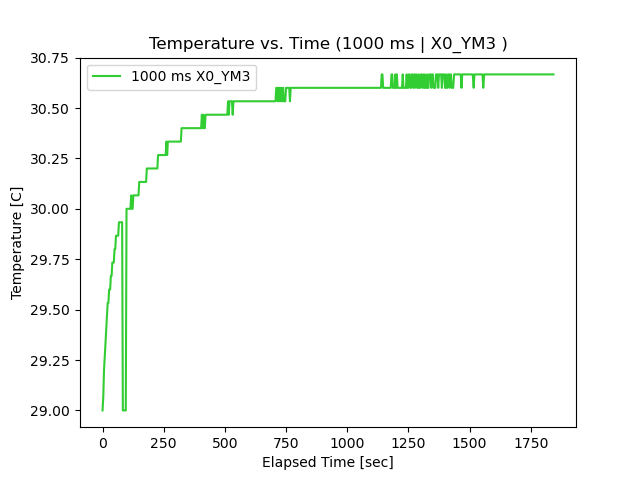

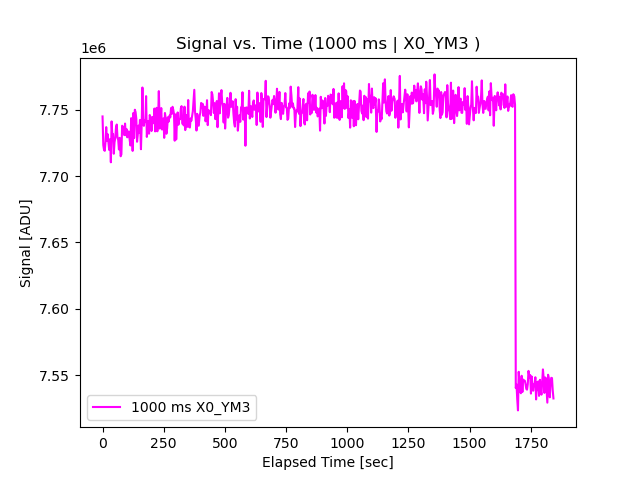

In [130]:
#load in X0_YM2
SetName = 'X0_YM3'
FolderName = '\YM3_X0/'

datadirectoryOpen = 'Image_Folders' + FolderName
filepatternOpen = '*.FTS'
ImageFileNameList = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList = MakeImagesList(ImageFileNameList,1)

#Making Time and Date Arrays for Centered Open Shutter Data (x0 y0 turns)
Times, Temps, Signals, Files = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times.argsort()
Times = Times[idx]
Temps = Temps[idx]
Signals = Signals[idx]
Files = Files[idx]

ElapsedTimes = Times - np.amin(Times)
ElapsedTimes = ElapsedTimes*86400 #now in seconds

#Plotting 
plt.figure('T v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Temps, color = 'limegreen', label = '1000 ms ' + SetName)
plt.title('Temperature vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Signals, color = 'magenta', label = '1000 ms ' + SetName)
plt.title('Signal vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [132]:
#Defining and moving the two steady state sets
#Manually input the corresponding Elapsed Times
SteadyStateStart = 536
DataFramesEnd = 1671 #to give 15 seconds to drop off at 1687
DarkFramesStart = 1692 # 3 seconds after end of drop

#Making a list of Steady State Data Frame files
FileNameList_ssBeam = ListFilesBetweenElapsedTime(SteadyStateStart,DataFramesEnd,Times,Files)

#Making a list of Steady State Dark Frame files
FileNameList_ssDarks = ListFilesAfterElapsedTime(DarkFramesStart,Times,Files)

#Moving these files to new folders
DestStr = 'SteadyStateDataSets/' + SetName + '/'

destinationBeam = DestStr + 'BeamImages/'
for source in FileNameList_ssBeam:
    shutil.copy(source,destinationBeam)
    
destinationDarks = DestStr + 'CS_Darks/'
for source in FileNameList_ssDarks:
    shutil.copy(source,destinationDarks)

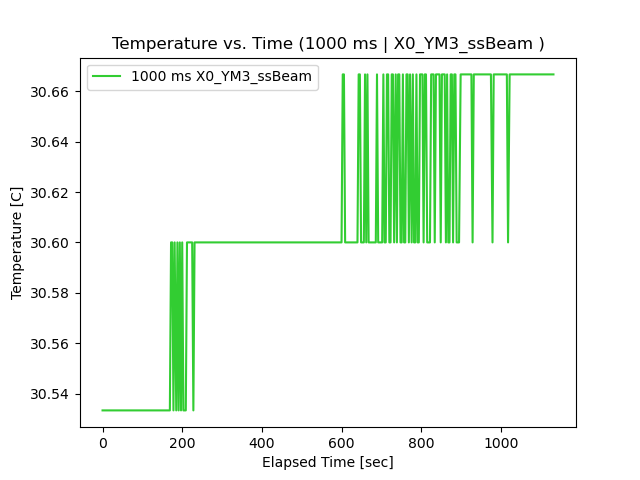

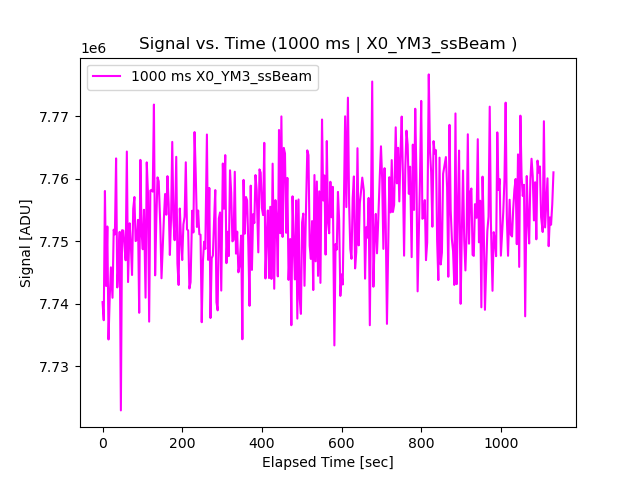

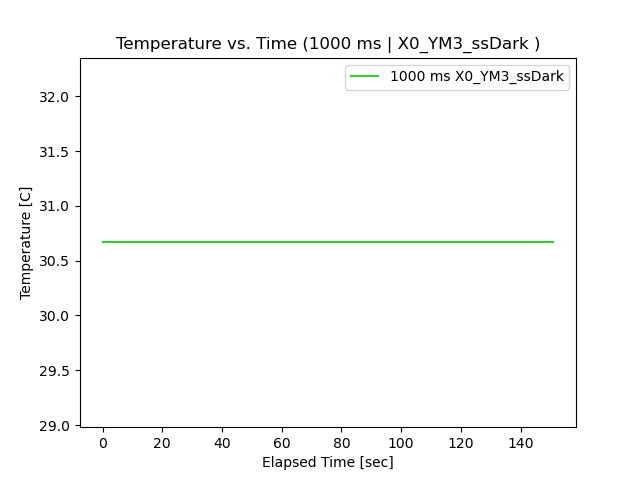

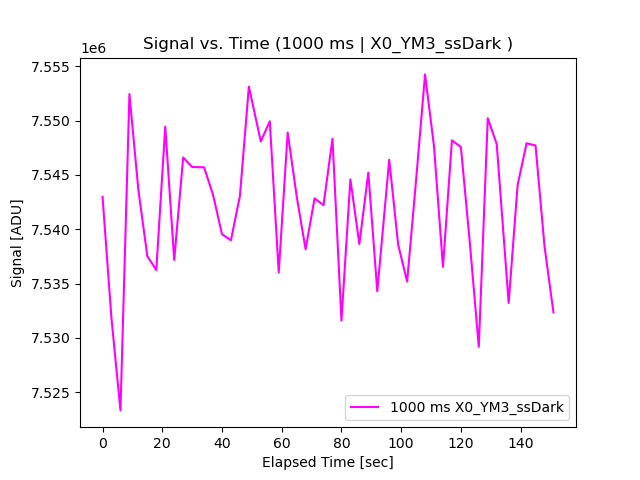


Data Set: (0,-3) Steady State Beam Images
Time Start: 2022-12-01T06:22:30.000 (UTC)
Time Stop: 2022-12-01T06:41:22.000 (UTC)
Elapsed Time: 18 min 52.0 sec
Exposure Time: 999.991 ms
Number of Frames: 369
Min Sensor Temperature: 30.53
Max Sensor Temperature: 30.67
Median Sensor Temperature: 30.6
Mean Sensor Temperature: 30.61
Standard Deviation of Sensor Temperature: 0.05


Data Set: (0,-3) Steady State Closed Shutter Dark Frames
Time Start: 2022-12-01T06:41:44.000 (UTC)
Time Stop: 2022-12-01T06:44:15.000 (UTC)
Elapsed Time: 2 min 31.0 sec
Exposure Time: 999.991 ms
Number of Frames: 50
Min Sensor Temperature: 30.67
Max Sensor Temperature: 30.67
Median Sensor Temperature: 30.67
Mean Sensor Temperature: 30.67
Standard Deviation of Sensor Temperature: 0.0


In [133]:
#Loading in the new Steady State files

datadirectoryOpen = DestStr + 'BeamImages/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssBeam = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssBeam = MakeImagesList(ImageFileNameList_ssBeam,1)

datadirectoryOpen = DestStr + 'CS_Darks/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssDarks = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssDarks = MakeImagesList(ImageFileNameList_ssDarks,1)

#Making Time and Date Arrays for Steady State Beam Images 
ImagesList = ImagesList_ssBeam
Times_ssBeam, Temps_ssBeam, Signals_ssBeam, Files_ssBeam = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssBeam.argsort()
Times_ssBeam = Times_ssBeam[idx]
Temps_ssBeam = Temps_ssBeam[idx]
Signals_ssBeam = Signals_ssBeam[idx]
Files_ssBeam = Files_ssBeam[idx]

ElapsedTimes_ssBeam = GetElapsedTimeArray(Times_ssBeam)

#Making Time and Date Arrays forSteady State Dark Frames 
ImagesList = ImagesList_ssDarks
Times_ssDarks, Temps_ssDarks, Signals_ssDarks, Files_ssDarks = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssDarks.argsort()
Times_ssDarks = Times_ssDarks[idx]
Temps_ssDarks = Temps_ssDarks[idx]
Signals_ssDarks = Signals_ssDarks[idx]
Files_ssDarks = Files_ssDarks[idx]

ElapsedTimes_ssDarks = GetElapsedTimeArray(Times_ssDarks)

#Plotting 
SetName1 = SetName + "_ssBeam"

plt.figure('T v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Temps_ssBeam, color = 'limegreen', label = '1000 ms ' + SetName1)
plt.title('Temperature vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Signals_ssBeam, color = 'magenta', label = '1000 ms ' + SetName1)
plt.title('Signal vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

SetName2 = SetName + "_ssDark"

plt.figure('T v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Temps_ssDarks, color = 'limegreen', label = '1000 ms ' + SetName2)
plt.title('Temperature vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Signals_ssDarks, color = 'magenta', label = '1000 ms ' + SetName2)
plt.title('Signal vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()



#Getting printing information about the steady state data set for printing and attaching.
DataSetName = "(0,-3) Steady State Beam Images"
ImagesList = ImagesList_ssBeam

PrintDataSetInfo(DataSetName,ImagesList)

print("")

DataSetName = "(0,-3) Steady State Closed Shutter Dark Frames"
ImagesList = ImagesList_ssDarks

PrintDataSetInfo(DataSetName,ImagesList)

***
### (0,0)

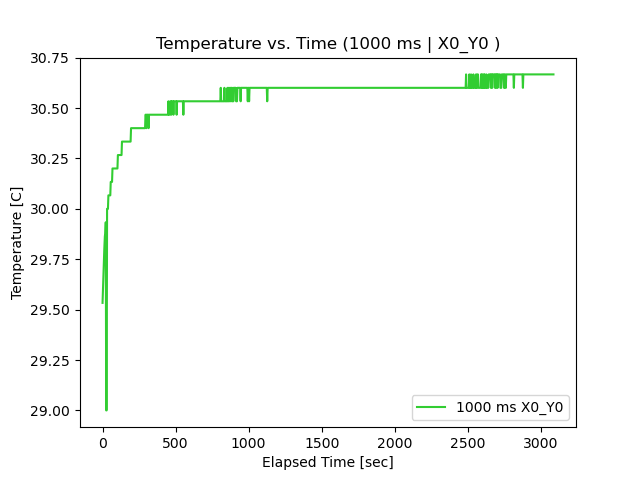

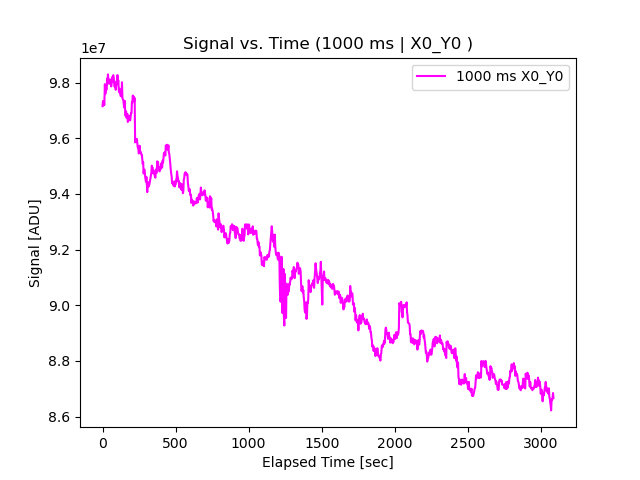

In [134]:
#load in X0_Y0
SetName = 'X0_Y0'
FolderName = '\OpenShutterDataFrames_Step19/'

datadirectoryOpen = 'Image_Folders' + FolderName
filepatternOpen = '*.FTS'
ImageFileNameList = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList = MakeImagesList(ImageFileNameList,1)

#Making Time and Date Arrays for Centered Open Shutter Data (x0 y0 turns)
Times, Temps, Signals, Files = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times.argsort()
Times = Times[idx]
Temps = Temps[idx]
Signals = Signals[idx]
Files = Files[idx]

ElapsedTimes = Times - np.amin(Times)
ElapsedTimes = ElapsedTimes*86400 #now in seconds

#Plotting 
plt.figure('T v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Temps, color = 'limegreen', label = '1000 ms ' + SetName)
plt.title('Temperature vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Signals, color = 'magenta', label = '1000 ms ' + SetName)
plt.title('Signal vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [135]:
#Defining and moving the two steady state sets
#Manually input the corresponding Elapsed Times
SteadyStateStart = 1131
DataFramesEnd = 2483
#DarkFramesStart = 1692 # 3 seconds after end of drop

#Making a list of Steady State Data Frame files
FileNameList_ssBeam = ListFilesBetweenElapsedTime(SteadyStateStart,DataFramesEnd,Times,Files)

#Making a list of Steady State Dark Frame files
#FileNameList_ssDarks = ListFilesAfterElapsedTime(DarkFramesStart,Times,Files)

#Moving these files to new folders
DestStr = 'SteadyStateDataSets/' + SetName + '/'

destinationBeam = DestStr + 'BeamImages/'
for source in FileNameList_ssBeam:
    shutil.copy(source,destinationBeam)
    
#destinationDarks = DestStr + 'CS_Darks/'
#for source in FileNameList_ssDarks:
#    shutil.copy(source,destinationDarks)

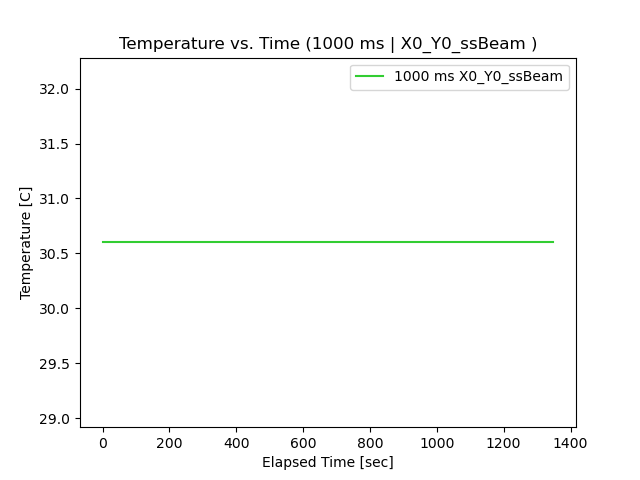

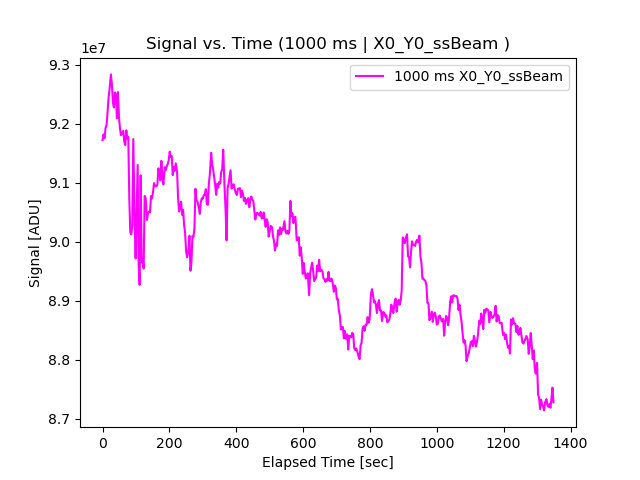

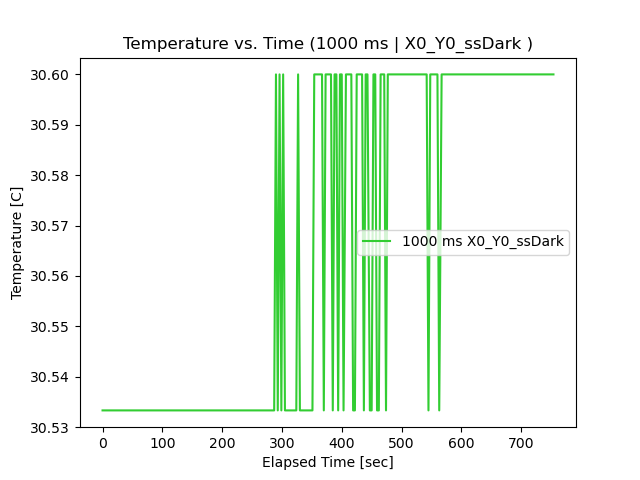

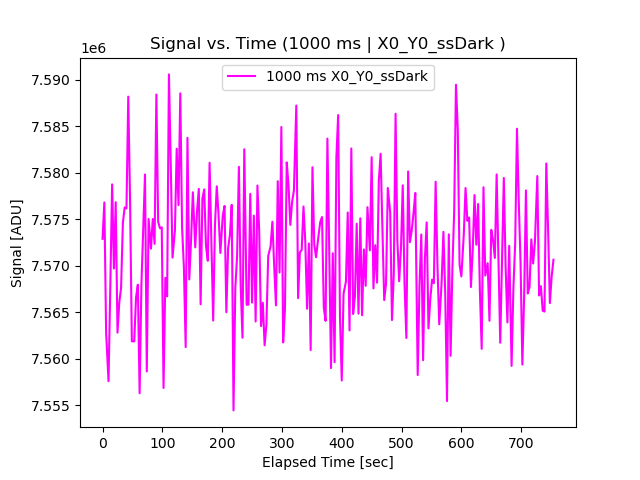


Data Set: (0,0) Steady State Beam Images
Time Start: 2022-12-01T01:20:33.000 (UTC)
Time Stop: 2022-12-01T01:43:02.000 (UTC)
Elapsed Time: 22 min 29.0 sec
Exposure Time: 999.991 ms
Number of Frames: 438
Min Sensor Temperature: 30.6
Max Sensor Temperature: 30.6
Median Sensor Temperature: 30.6
Mean Sensor Temperature: 30.6
Standard Deviation of Sensor Temperature: 0.0


Data Set: (0,0) Steady State Closed Shutter Dark Frames
Time Start: 2022-12-01T00:34:03.000 (UTC)
Time Stop: 2022-12-01T00:46:37.000 (UTC)
Elapsed Time: 12 min 34.0 sec
Exposure Time: 999.991 ms
Number of Frames: 246
Min Sensor Temperature: 30.53
Max Sensor Temperature: 30.6
Median Sensor Temperature: 30.53
Mean Sensor Temperature: 30.57
Standard Deviation of Sensor Temperature: 0.03


In [137]:
#Loading in the new Steady State files

datadirectoryOpen = DestStr + 'BeamImages/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssBeam = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssBeam = MakeImagesList(ImageFileNameList_ssBeam,1)

datadirectoryOpen = DestStr + 'CS_Darks/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssDarks = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssDarks = MakeImagesList(ImageFileNameList_ssDarks,1)

#Making Time and Date Arrays for Steady State Beam Images 
ImagesList = ImagesList_ssBeam
Times_ssBeam, Temps_ssBeam, Signals_ssBeam, Files_ssBeam = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssBeam.argsort()
Times_ssBeam = Times_ssBeam[idx]
Temps_ssBeam = Temps_ssBeam[idx]
Signals_ssBeam = Signals_ssBeam[idx]
Files_ssBeam = Files_ssBeam[idx]

ElapsedTimes_ssBeam = GetElapsedTimeArray(Times_ssBeam)

#Making Time and Date Arrays forSteady State Dark Frames 
ImagesList = ImagesList_ssDarks
Times_ssDarks, Temps_ssDarks, Signals_ssDarks, Files_ssDarks = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssDarks.argsort()
Times_ssDarks = Times_ssDarks[idx]
Temps_ssDarks = Temps_ssDarks[idx]
Signals_ssDarks = Signals_ssDarks[idx]
Files_ssDarks = Files_ssDarks[idx]

ElapsedTimes_ssDarks = GetElapsedTimeArray(Times_ssDarks)

#Plotting 
SetName1 = SetName + "_ssBeam"

plt.figure('T v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Temps_ssBeam, color = 'limegreen', label = '1000 ms ' + SetName1)
plt.title('Temperature vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Signals_ssBeam, color = 'magenta', label = '1000 ms ' + SetName1)
plt.title('Signal vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

SetName2 = SetName + "_ssDark"

plt.figure('T v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Temps_ssDarks, color = 'limegreen', label = '1000 ms ' + SetName2)
plt.title('Temperature vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Signals_ssDarks, color = 'magenta', label = '1000 ms ' + SetName2)
plt.title('Signal vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()



#Getting printing information about the steady state data set for printing and attaching.
DataSetName = "(0,0) Steady State Beam Images"
ImagesList = ImagesList_ssBeam

PrintDataSetInfo(DataSetName,ImagesList)

print("")

DataSetName = "(0,0) Steady State Closed Shutter Dark Frames"
ImagesList = ImagesList_ssDarks

PrintDataSetInfo(DataSetName,ImagesList)

***
### Second Order 981 eV (For Gain) (0,2)

#### Begin with Open Shutter Data

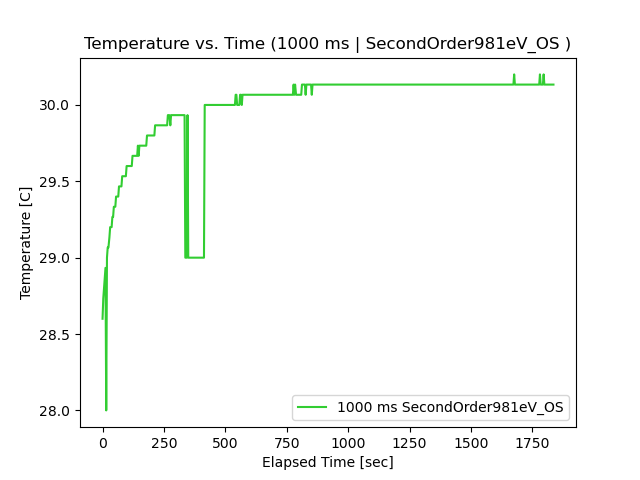

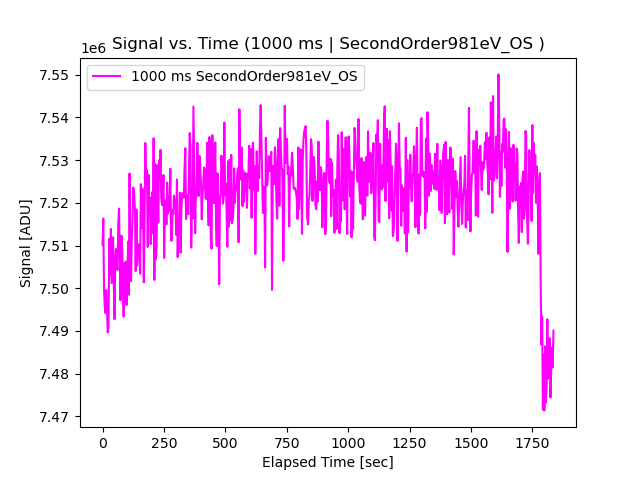

In [7]:
#load in Second Order 981 eV Open Shutter
SetName = 'SecondOrder981eV'
FolderName = '\Gain_Data\SecondOrderGain981eV_OS/'

datadirectoryOpen = 'Image_Folders' + FolderName
filepatternOpen = '*.FTS'
ImageFileNameList = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList = MakeImagesList(ImageFileNameList,1)

#Making Time and Date Arrays for Centered Open Shutter Data (x0 y0 turns)
Times, Temps, Signals, Files = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times.argsort()
Times = Times[idx]
Temps = Temps[idx]
Signals = Signals[idx]
Files = Files[idx]

ElapsedTimes = Times - np.amin(Times)
ElapsedTimes = ElapsedTimes*86400 #now in seconds

#Plotting 
plt.figure('T v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Temps, color = 'limegreen', label = '1000 ms ' + SetName)
plt.title('Temperature vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Signals, color = 'magenta', label = '1000 ms ' + SetName)
plt.title('Signal vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [8]:
#Defining and moving the two steady state sets
#Manually input the corresponding Elapsed Times
SetName = 'X0_YP2_981eV'

SteadyStateStart = 855
DataFramesEnd = 1766 #15 sec before inexplicable drop in signal (I wonder if we closed the shutter for darks and forgot.)
#DarkFramesStart = 1692 # 3 seconds after end of drop

#Making a list of Steady State Data Frame files
FileNameList_ssBeam = ListFilesBetweenElapsedTime(SteadyStateStart,DataFramesEnd,Times,Files)

#Making a list of Steady State Dark Frame files
#FileNameList_ssDarks = ListFilesAfterElapsedTime(DarkFramesStart,Times,Files)

#Moving these files to new folders
DestStr = 'SteadyStateDataSets/Gain_Data/' + SetName + '/'

destinationBeam = DestStr + 'BeamImages/'
for source in FileNameList_ssBeam:
    shutil.copy(source,destinationBeam)

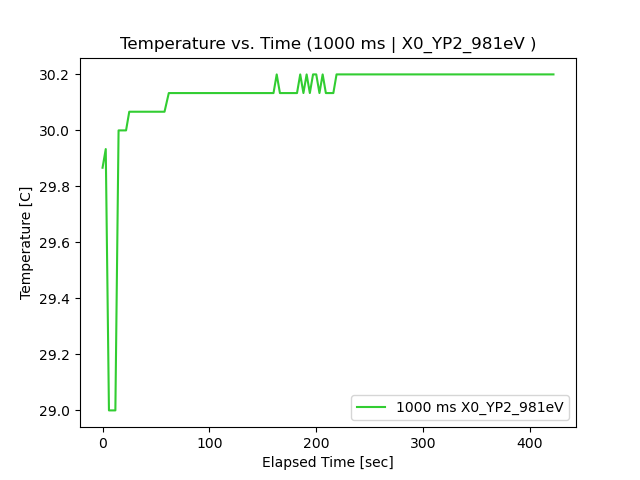

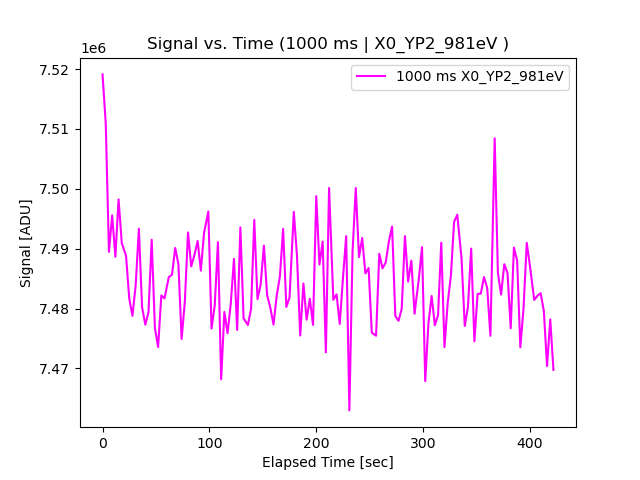

In [10]:
#load in Second Order 981 eV Closed Shutter
SetName = 'X0_YP2_981eV'
FolderName = '\Gain_Data\SecondOrderGain981eV_CS/'

datadirectoryOpen = 'Image_Folders' + FolderName
filepatternOpen = '*.FTS'
ImageFileNameList = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList = MakeImagesList(ImageFileNameList,1)

#Making Time and Date Arrays for Centered Open Shutter Data (x0 y0 turns)
Times, Temps, Signals, Files = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times.argsort()
Times = Times[idx]
Temps = Temps[idx]
Signals = Signals[idx]
Files = Files[idx]

ElapsedTimes = Times - np.amin(Times)
ElapsedTimes = ElapsedTimes*86400 #now in seconds

#Plotting 
plt.figure('T v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Temps, color = 'limegreen', label = '1000 ms ' + SetName)
plt.title('Temperature vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Signals, color = 'magenta', label = '1000 ms ' + SetName)
plt.title('Signal vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [17]:
#Defining and moving the two steady state sets
#Manually input the corresponding Elapsed Times

SteadyStateStart = 64

#Making a list of Steady State Dark Frame files
DarkFramesEnd = 197 #15 the data frames were slightly cooler so I cut of the dark frames before the average temp gets much higher

#Making a list of Steady State Data Frame files
FileNameList_ssDarks = ListFilesBetweenElapsedTime(SteadyStateStart,DarkFramesEnd,Times,Files)

#Moving these files to new folders
DestStr = 'SteadyStateDataSets/Gain_Data/' + SetName + '/'

destinationDarks = DestStr + 'CS_Darks/'
for source in FileNameList_ssDarks:
    shutil.copy(source,destinationDarks)

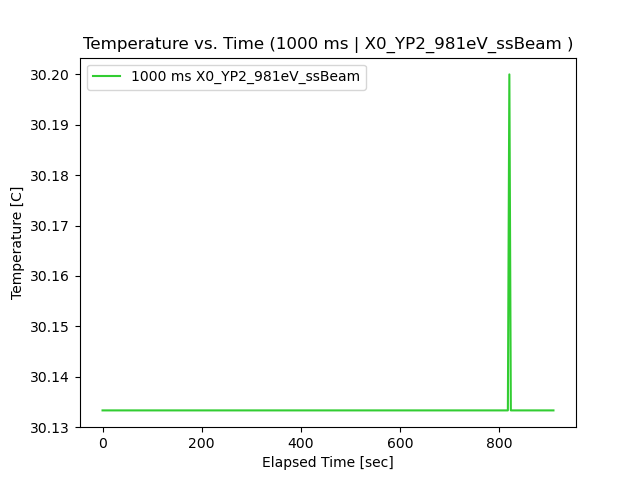

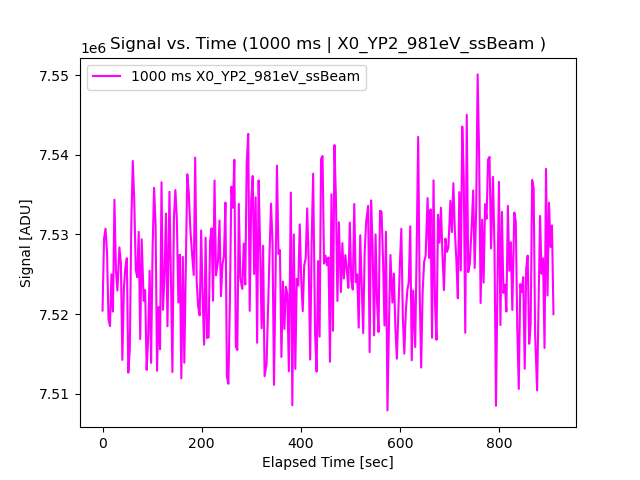

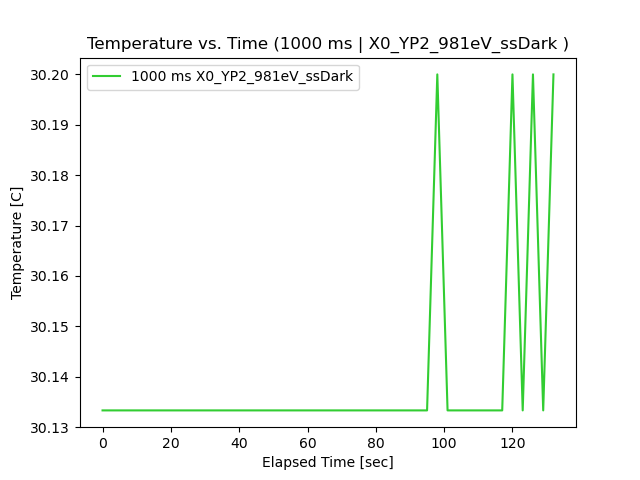

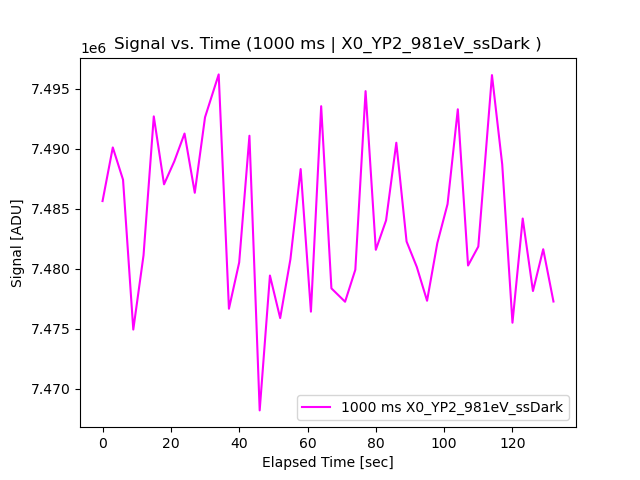


Data Set: (0,2) Second Order 981.0 eV Beam Images
Time Start: 2022-12-01T13:39:56.000 (UTC)
Time Stop: 2022-12-01T13:55:06.000 (UTC)
Elapsed Time: 15 min 10.0 sec
Exposure Time: 999.991 ms
Number of Frames: 298
Min Sensor Temperature: 30.13
Max Sensor Temperature: 30.2
Median Sensor Temperature: 30.13
Mean Sensor Temperature: 30.13
Standard Deviation of Sensor Temperature: 0.0


Data Set: (0,2) Second Order 981.0 eV Closed Shutter Dark Frames
Time Start: 2022-12-01T13:57:45.000 (UTC)
Time Stop: 2022-12-01T13:59:57.000 (UTC)
Elapsed Time: 2 min 12.0 sec
Exposure Time: 999.991 ms
Number of Frames: 44
Min Sensor Temperature: 30.13
Max Sensor Temperature: 30.2
Median Sensor Temperature: 30.13
Mean Sensor Temperature: 30.14
Standard Deviation of Sensor Temperature: 0.02


In [19]:
#Loading in the new Steady State files

datadirectoryOpen = DestStr + 'BeamImages/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssBeam = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssBeam = MakeImagesList(ImageFileNameList_ssBeam,1)

datadirectoryOpen = DestStr + 'CS_Darks/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssDarks = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssDarks = MakeImagesList(ImageFileNameList_ssDarks,1)

#Making Time and Date Arrays for Steady State Beam Images 
ImagesList = ImagesList_ssBeam
Times_ssBeam, Temps_ssBeam, Signals_ssBeam, Files_ssBeam = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssBeam.argsort()
Times_ssBeam = Times_ssBeam[idx]
Temps_ssBeam = Temps_ssBeam[idx]
Signals_ssBeam = Signals_ssBeam[idx]
Files_ssBeam = Files_ssBeam[idx]

ElapsedTimes_ssBeam = GetElapsedTimeArray(Times_ssBeam)

#Making Time and Date Arrays forSteady State Dark Frames 
ImagesList = ImagesList_ssDarks
Times_ssDarks, Temps_ssDarks, Signals_ssDarks, Files_ssDarks = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssDarks.argsort()
Times_ssDarks = Times_ssDarks[idx]
Temps_ssDarks = Temps_ssDarks[idx]
Signals_ssDarks = Signals_ssDarks[idx]
Files_ssDarks = Files_ssDarks[idx]

ElapsedTimes_ssDarks = GetElapsedTimeArray(Times_ssDarks)

#Plotting 
SetName1 = SetName + "_ssBeam"

plt.figure('T v T 1000 ms 1' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Temps_ssBeam, color = 'limegreen', label = '1000 ms ' + SetName1)
plt.title('Temperature vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms 1' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Signals_ssBeam, color = 'magenta', label = '1000 ms ' + SetName1)
plt.title('Signal vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

SetName2 = SetName + "_ssDark"

plt.figure('T v T 1000 ms 1' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Temps_ssDarks, color = 'limegreen', label = '1000 ms ' + SetName2)
plt.title('Temperature vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms 1' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Signals_ssDarks, color = 'magenta', label = '1000 ms ' + SetName2)
plt.title('Signal vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()



#Getting printing information about the steady state data set for printing and attaching.
DataSetName = "(0,2) Second Order 981.0 eV Beam Images"
ImagesList = ImagesList_ssBeam

PrintDataSetInfo(DataSetName,ImagesList)

print("")

DataSetName = "(0,2) Second Order 981.0 eV Closed Shutter Dark Frames"
ImagesList = ImagesList_ssDarks

PrintDataSetInfo(DataSetName,ImagesList)

***
### (0,0) Open Shutter Dark Frames

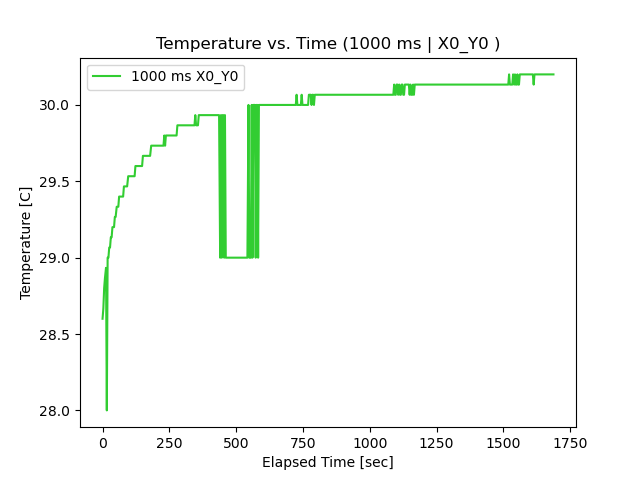

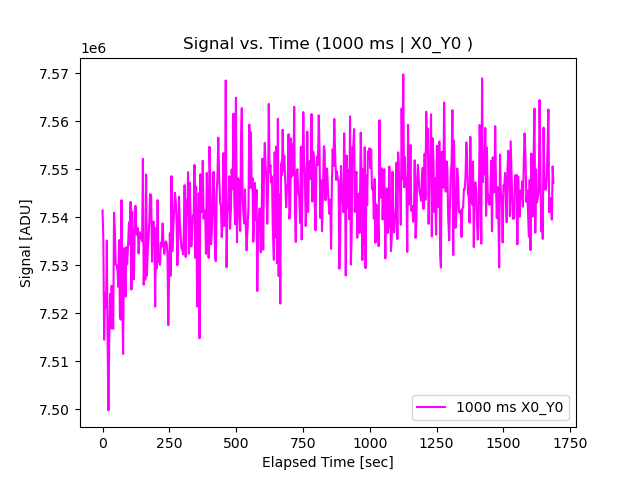

In [22]:
#load in X0_Y0 Open Shutter Dark Frames
SetName = 'X0_Y0'
FolderName = '\OpenShutterDarks490p5eV/'

datadirectoryOpen = 'Image_Folders' + FolderName
filepatternOpen = '*.FTS'
ImageFileNameList = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList = MakeImagesList(ImageFileNameList,1)

#Making Time and Date Arrays for Centered Open Shutter Data (x0 y0 turns)
Times, Temps, Signals, Files = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times.argsort()
Times = Times[idx]
Temps = Temps[idx]
Signals = Signals[idx]
Files = Files[idx]

ElapsedTimes = Times - np.amin(Times)
ElapsedTimes = ElapsedTimes*86400 #now in seconds

#Plotting 
plt.figure('T v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Temps, color = 'limegreen', label = '1000 ms ' + SetName)
plt.title('Temperature vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Signals, color = 'magenta', label = '1000 ms ' + SetName)
plt.title('Signal vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [24]:
#Defining and moving the two steady state sets
#Manually input the corresponding Elapsed Times

SteadyStateStart = 1168

#Making a list of Steady State Dark Frame files
FileNameList_ssDarks = ListFilesAfterElapsedTime(SteadyStateStart,Times,Files)

#Moving these files to new folders
DestStr = 'SteadyStateDataSets/' + SetName + '/'

destinationDarks = DestStr + 'OS_Darks/'
for source in FileNameList_ssDarks:
    shutil.copy(source,destinationDarks)

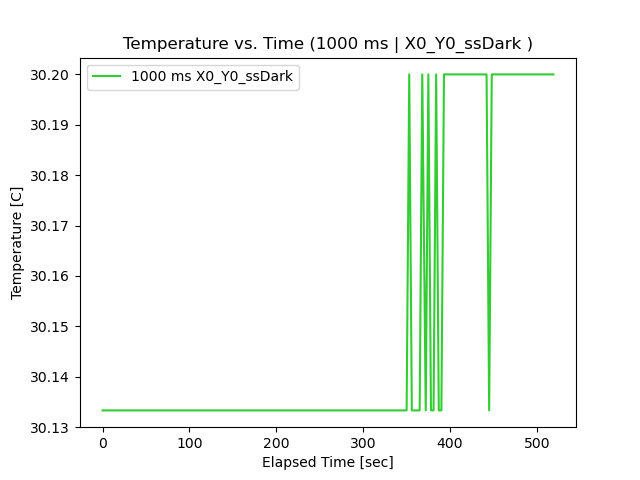

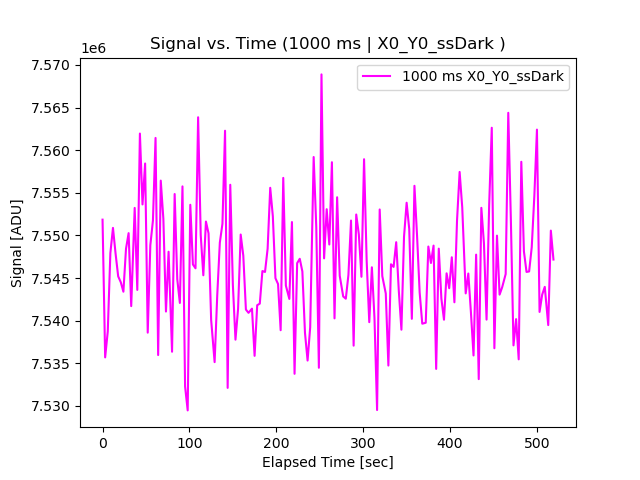


Data Set: (0,0) 490.5 eV Open Shutter Dark Frames
Time Start: 2022-12-01T12:49:14.000 (UTC)
Time Stop: 2022-12-01T12:57:53.000 (UTC)
Elapsed Time: 8 min 39.0 sec
Exposure Time: 999.991 ms
Number of Frames: 170
Min Sensor Temperature: 30.13
Max Sensor Temperature: 30.2
Median Sensor Temperature: 30.13
Mean Sensor Temperature: 30.15
Standard Deviation of Sensor Temperature: 0.03


In [28]:
#Loading in the new Steady State files

datadirectoryOpen = DestStr + 'OS_Darks/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssDarks = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssDarks = MakeImagesList(ImageFileNameList_ssDarks,1)


#Making Time and Date Arrays forSteady State Dark Frames 
ImagesList = ImagesList_ssDarks
Times_ssDarks, Temps_ssDarks, Signals_ssDarks, Files_ssDarks = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssDarks.argsort()
Times_ssDarks = Times_ssDarks[idx]
Temps_ssDarks = Temps_ssDarks[idx]
Signals_ssDarks = Signals_ssDarks[idx]
Files_ssDarks = Files_ssDarks[idx]

ElapsedTimes_ssDarks = GetElapsedTimeArray(Times_ssDarks)

SetName3 = SetName + "_ssDark"

plt.figure('T v T 1000 ms 4' + SetName3)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Temps_ssDarks, color = 'limegreen', label = '1000 ms ' + SetName3)
plt.title('Temperature vs. Time (1000 ms | ' + SetName3 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms 4' + SetName3)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Signals_ssDarks, color = 'magenta', label = '1000 ms ' + SetName3)
plt.title('Signal vs. Time (1000 ms | ' + SetName3 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()



#Getting printing information about the steady state data set for printing and attaching.
DataSetName = "(0,0) 490.5 eV Open Shutter Dark Frames"
ImagesList = ImagesList_ssDarks

PrintDataSetInfo(DataSetName,ImagesList)

***
### 520.0 eV (For Gain) (0,0)

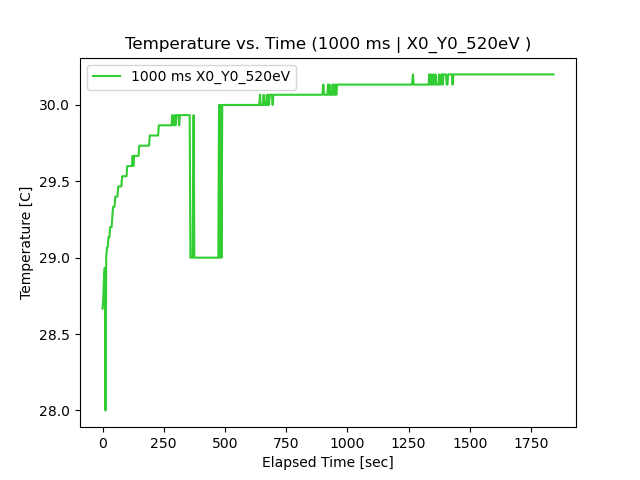

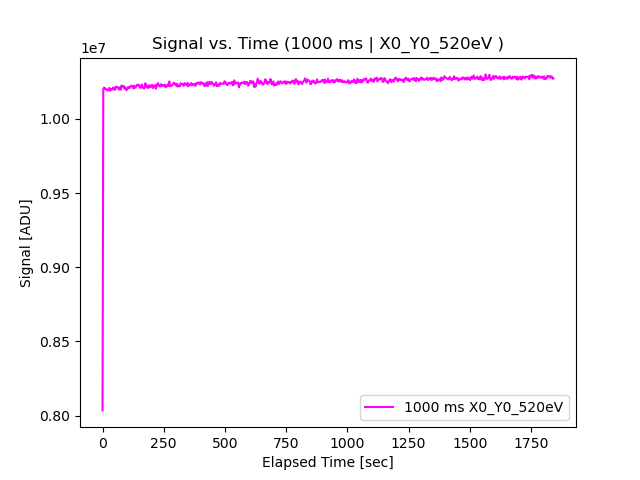

In [30]:
#load in Second Order 981 eV Open Shutter
SetName = 'X0_Y0_520eV'
FolderName = '\Gain_Data\Gain520eV/'

datadirectoryOpen = 'Image_Folders' + FolderName
filepatternOpen = '*.FTS'
ImageFileNameList = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList = MakeImagesList(ImageFileNameList,1)

#Making Time and Date Arrays for Centered Open Shutter Data (x0 y0 turns)
Times, Temps, Signals, Files = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times.argsort()
Times = Times[idx]
Temps = Temps[idx]
Signals = Signals[idx]
Files = Files[idx]

ElapsedTimes = Times - np.amin(Times)
ElapsedTimes = ElapsedTimes*86400 #now in seconds

#Plotting 
plt.figure('T v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Temps, color = 'limegreen', label = '1000 ms ' + SetName)
plt.title('Temperature vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms ' + SetName)
plt.clf()
plt.plot(ElapsedTimes,Signals, color = 'magenta', label = '1000 ms ' + SetName)
plt.title('Signal vs. Time (1000 ms | ' + SetName + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

In [32]:
#Defining and moving the two steady state sets
#Manually input the corresponding Elapsed Times

SteadyStateStart = 958

#Making a list of Steady State Dark Frame files
FileNameList_ssBeam = ListFilesAfterElapsedTime(SteadyStateStart,Times,Files)

#Moving these files to new folders
DestStr = 'SteadyStateDataSets/Gain_Data/' + SetName + '/'

destinationBeam = DestStr + 'BeamImages/'
for source in FileNameList_ssBeam:
    shutil.copy(source,destinationBeam)

For the associated dark frames the issue is that all the closed shutter darks at (0,0) were taken at a different steady state temperature and many hours seperate from the 520 eV gain frames.

The solution I've come up with is to find the hot pixels using the (0,2) Second Order 981.0 eV Closed Shutter Dark Frames because they were most recent to the 520 eV frames and also sufficiently close (1st or 2nd closest) in temperature. With the hot pixels found ROI Open shutter darks can be made for the areas of interest for event histograming.

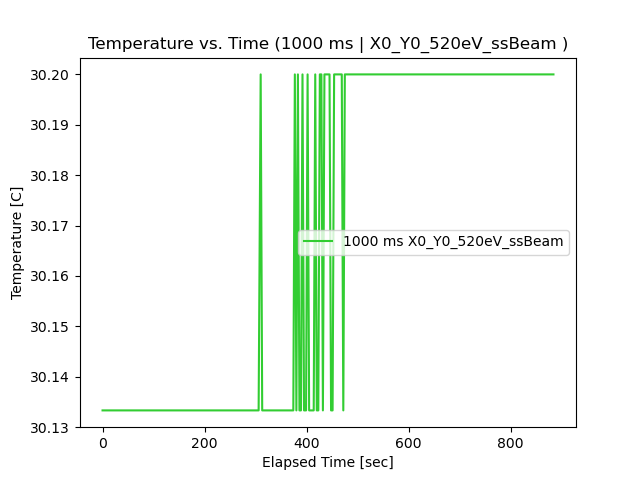

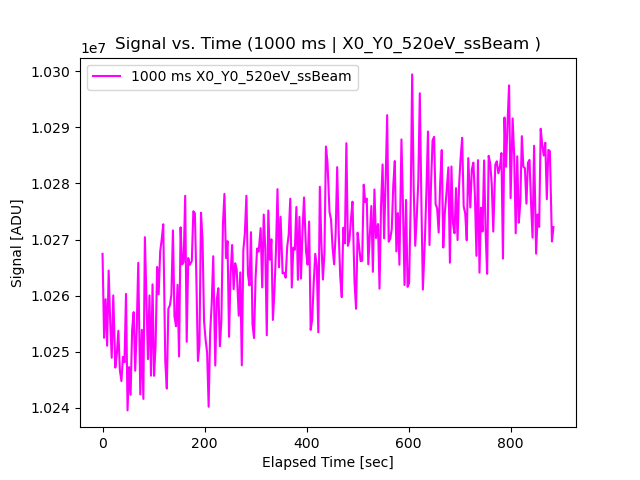

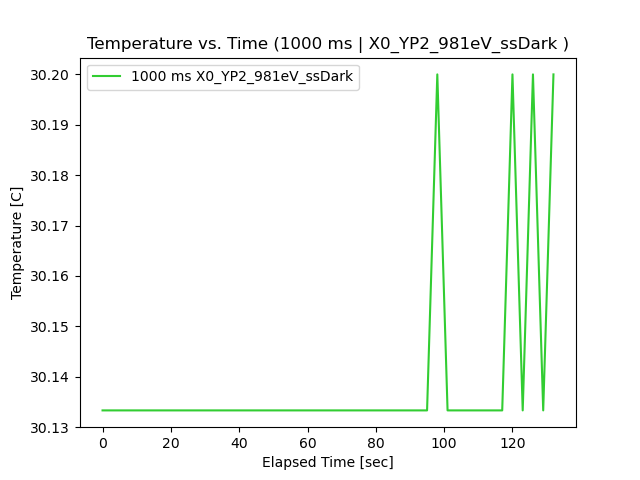

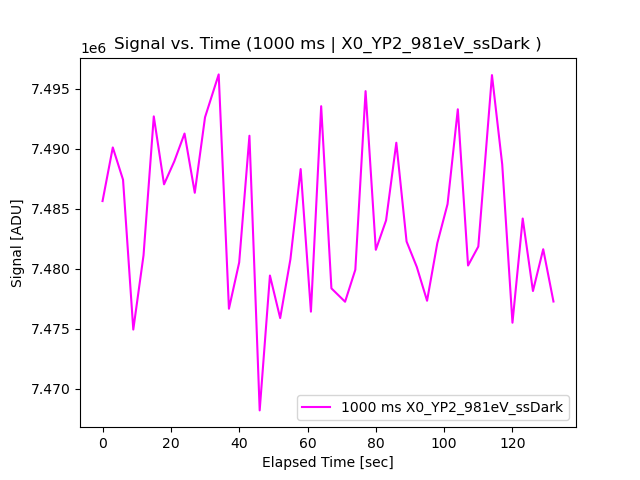


Data Set: (0,0) 520.0 eV Beam Images
Time Start: 2022-12-01T14:48:47.000 (UTC)
Time Stop: 2022-12-01T15:03:31.000 (UTC)
Elapsed Time: 14 min 44.0 sec
Exposure Time: 999.991 ms
Number of Frames: 289
Min Sensor Temperature: 30.13
Max Sensor Temperature: 30.2
Median Sensor Temperature: 30.2
Mean Sensor Temperature: 30.17
Standard Deviation of Sensor Temperature: 0.03


Data Set: (0,2) Second Order 981.0 eV Closed Shutter Dark Frames
Time Start: 2022-12-01T13:57:45.000 (UTC)
Time Stop: 2022-12-01T13:59:57.000 (UTC)
Elapsed Time: 2 min 12.0 sec
Exposure Time: 999.991 ms
Number of Frames: 44
Min Sensor Temperature: 30.13
Max Sensor Temperature: 30.2
Median Sensor Temperature: 30.13
Mean Sensor Temperature: 30.14
Standard Deviation of Sensor Temperature: 0.02


In [33]:
#Loading in the new Steady State files

datadirectoryOpen = DestStr + 'BeamImages/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssBeam = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssBeam = MakeImagesList(ImageFileNameList_ssBeam,1)

datadirectoryOpen = DestStr + 'X0_YP2_CS_Darks/'
filepatternOpen = '*.FTS'
ImageFileNameList_ssDarks = glob2.glob(datadirectoryOpen + filepatternOpen)
ImagesList_ssDarks = MakeImagesList(ImageFileNameList_ssDarks,1)

#Making Time and Date Arrays for Steady State Beam Images 
ImagesList = ImagesList_ssBeam
Times_ssBeam, Temps_ssBeam, Signals_ssBeam, Files_ssBeam = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssBeam.argsort()
Times_ssBeam = Times_ssBeam[idx]
Temps_ssBeam = Temps_ssBeam[idx]
Signals_ssBeam = Signals_ssBeam[idx]
Files_ssBeam = Files_ssBeam[idx]

ElapsedTimes_ssBeam = GetElapsedTimeArray(Times_ssBeam)

#Making Time and Date Arrays forSteady State Dark Frames 
ImagesList = ImagesList_ssDarks
Times_ssDarks, Temps_ssDarks, Signals_ssDarks, Files_ssDarks = GetTimeTempSignalAndFile(ImagesList)

#Sorting by date (lowest to highest)
idx = Times_ssDarks.argsort()
Times_ssDarks = Times_ssDarks[idx]
Temps_ssDarks = Temps_ssDarks[idx]
Signals_ssDarks = Signals_ssDarks[idx]
Files_ssDarks = Files_ssDarks[idx]

ElapsedTimes_ssDarks = GetElapsedTimeArray(Times_ssDarks)

#Plotting 
SetName1 = SetName + "_ssBeam"

plt.figure('T v T 1000 ms 1' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Temps_ssBeam, color = 'limegreen', label = '1000 ms ' + SetName1)
plt.title('Temperature vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms 1' + SetName1)
plt.clf()
plt.plot(ElapsedTimes_ssBeam,Signals_ssBeam, color = 'magenta', label = '1000 ms ' + SetName1)
plt.title('Signal vs. Time (1000 ms | ' + SetName1 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()

SetName2 = 'X0_YP2_981eV' + "_ssDark"

plt.figure('T v T 1000 ms 4' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Temps_ssDarks, color = 'limegreen', label = '1000 ms ' + SetName2)
plt.title('Temperature vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Temperature [C]')
plt.legend()
plt.show()

plt.figure('Signal v T 1000 ms 4' + SetName2)
plt.clf()
plt.plot(ElapsedTimes_ssDarks,Signals_ssDarks, color = 'magenta', label = '1000 ms ' + SetName2)
plt.title('Signal vs. Time (1000 ms | ' + SetName2 + ' )')
plt.xlabel('Elapsed Time [sec]')
plt.ylabel('Signal [ADU]')
plt.legend()
plt.show()



#Getting printing information about the steady state data set for printing and attaching.
DataSetName = "(0,0) 520.0 eV Beam Images"
ImagesList = ImagesList_ssBeam

PrintDataSetInfo(DataSetName,ImagesList)

print("")

DataSetName = "(0,2) Second Order 981.0 eV Closed Shutter Dark Frames"
ImagesList = ImagesList_ssDarks

PrintDataSetInfo(DataSetName,ImagesList)